<a href="https://colab.research.google.com/github/w1767/GAN/blob/master/MAIN_CODE_MMAR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# Import the libraries
!pip install pandas_datareader
!pip install yfinance
!pip install mplfinance
import pandas as pd
import numpy as np

import os
import argparse
import signal
import yfinance as yf
import pickle
import mplfinance as mpf
import math
import pandas_datareader.data as web
from datetime import datetime, timedelta
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
#from yfinance import stock_info
from dateutil.parser import parse
from urllib.request import urlopen, Request
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
start_date = datetime(2020, 1,1)
end_date = datetime(2021, 8, 2)

import matplotlib.pyplot as plt         
import matplotlib.dates as dates
from mpl_toolkits.mplot3d import Axes3D

from datetime import datetime

import statsmodels.formula.api as sm

from scipy.optimize import fsolve
from scipy import stats

import random

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 62 kB 1.2 MB/s 
     |████████████████████████████████| 6.4 MB 26.7 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: lxml
    Found existing installation: lxml 4.2.6
    Uninstalling lxml-4.2.6:
      Successfully uninstalled lxml-4.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
Looking in index

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
dateparser=lambda x: pd.datetime.strptime(x,'%d/%m/%Y')
df=pd.read_excel("/content/drive/MyDrive/PhD research/VIX_daily.xlsx", index_col = 'Date')
df_Valid = pd.read_excel("/content/drive/MyDrive/PhD research/VVIX.xlsx", index_col='Date')
#df = pd.read_csv('Data for Jupyter Lab.csv', sep=',',decimal='.', parse_dates=['Date_NORWAY','Date_SWEDEN','Date_LIBOR'], date_parser= dateparser)

In [5]:
print(df)

            Last Price
Date                  
2022-04-20       21.19
2022-04-19       21.37
2022-04-18       22.17
2022-04-14       22.70
2022-04-13       21.82
...                ...
1990-01-08       20.26
1990-01-05       20.11
1990-01-04       19.22
1990-01-03       18.19
1990-01-02       17.24

[8136 rows x 1 columns]


In [6]:
# printing the statistics of datafrane
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8136 entries, 2022-04-20 to 1990-01-02
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Last Price  8136 non-null   float64
dtypes: float64(1)
memory usage: 127.1 KB


In [14]:
#determine rolling statistics
#window size 12 denotes 12 months, giving rolling mean at yearly level
rolmean = df['Last Price'].rolling(window=12).mean()
rolstd = df['Last Price'].rolling(window=12).std()
print(rolmean, rolstd
      )

Date
2022-04-20          NaN
2022-04-19          NaN
2022-04-18          NaN
2022-04-14          NaN
2022-04-13          NaN
                ...    
1990-01-08    23.544167
1990-01-05    23.160000
1990-01-04    22.536667
1990-01-03    22.177500
1990-01-02    21.585833
Name: Last Price, Length: 8136, dtype: float64 Date
2022-04-20         NaN
2022-04-19         NaN
2022-04-18         NaN
2022-04-14         NaN
2022-04-13         NaN
                ...   
1990-01-08    2.108155
1990-01-05    2.286868
1990-01-04    2.253419
1990-01-03    2.579659
1990-01-02    2.839697
Name: Last Price, Length: 8136, dtype: float64


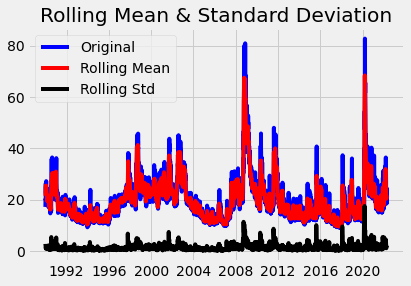

In [15]:
#plot rolling statistics
orig = plt.plot(df, color='blue', label='Original')
mean = plt.plot(rolmean, color='red', label='Rolling Mean')
std = plt.plot(rolstd, color='black', label='Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.show (block=False)

In [16]:
# calculating Log on Price column
Dataset_logScale = np.log(df['Last Price'])
Dataset_logScale

Date
2022-04-20    3.053529
2022-04-19    3.061988
2022-04-18    3.098740
2022-04-14    3.122365
2022-04-13    3.082827
                ...   
1990-01-08    3.008648
1990-01-05    3.001217
1990-01-04    2.955951
1990-01-03    2.900872
1990-01-02    2.847232
Name: Last Price, Length: 8136, dtype: float64

In [17]:
#Calculating Log Return on Log-Scale by taking log difference
Log_Return = Dataset_logScale.diff()
Log_Return

Date
2022-04-20         NaN
2022-04-19    0.008459
2022-04-18    0.036752
2022-04-14    0.023625
2022-04-13   -0.039538
                ...   
1990-01-08   -0.091444
1990-01-05   -0.007431
1990-01-04   -0.045266
1990-01-03   -0.055079
1990-01-02   -0.053640
Name: Last Price, Length: 8136, dtype: float64

In [18]:
basic_statistics = pd.DataFrame()
#basic_statistics['Norway']= [df.LN_NORWAY.mean(), df.LN_NORWAY.std(), stats.kurtosis(df.LN_NORWAY[1:-1])]
#basic_statistics['Sweden']= [df.LN_SWEDEN.mean(), df.LN_SWEDEN.std(),stats.kurtosis(df.LN_SWEDEN[1:-1])]
#basic_statistics['LIBOR']= [df.LN_LIBOR.mean(), df.LN_LIBOR.std(), stats.kurtosis(df.LN_LIBOR[1:-1])]
basic_statistics['Log_Return']= [df['Last Price'].mean(), df['Last Price'].std(), stats.kurtosis(df['Last Price'][1:-1])]
basic_statistics.rename(index = {0:"Mean", 1:"Standard Deviation", 2:"Kurtosis"}, inplace = True)

basic_statistics

,Log_Return
Mean,19.526503
Standard Deviation,8.005511
Kurtosis,8.381333


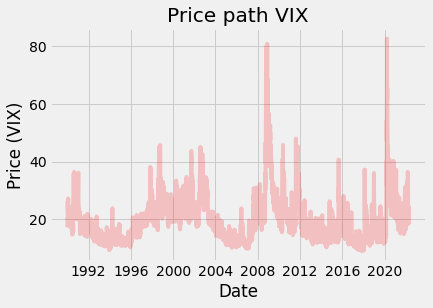

In [19]:
from re import L
plt.grid(b=True)
plt.xlabel('Date')
plt.ylabel('Price (VIX)')
plt.title("Price path VIX")

plt.plot(df.index, df['Last Price'], color="red", alpha=0.2)

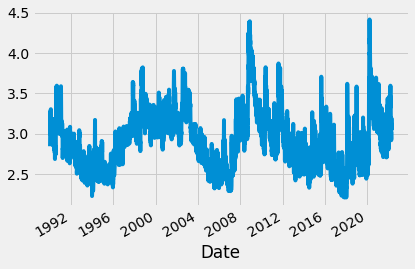

In [20]:
#plotting the logscale trend
Dataset_logScale.plot()

AttributeError: ignored

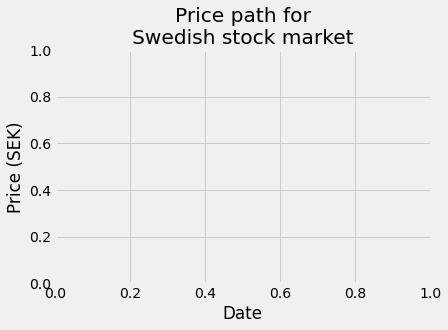

In [21]:
plt.grid(b=True)
plt.xlabel('Date')
plt.ylabel('Price (SEK)')
plt.title("Price path for\nSwedish stock market")


plt.fill_between(list(df.Date_SWEDEN), df.Price_SWEDEN, color="gold", alpha=0.2)

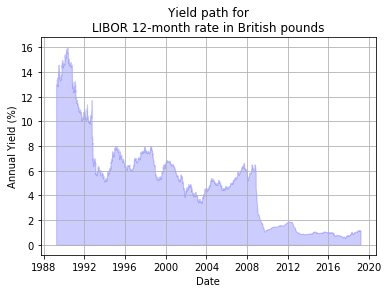

In [ ]:
plt.grid(b=True)
plt.xlabel('Date')
plt.ylabel('Annual Yield (%)')
plt.title("Yield path for\nLIBOR 12-month rate in British pounds")

plt.fill_between(list(df.Date_LIBOR), df.Price_LIBOR, color="blue", alpha=0.2)

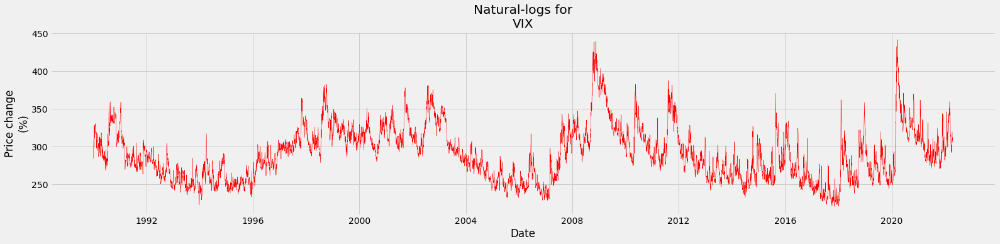

In [22]:
plt.figure(figsize=(24,5))
plt.grid(b=True)

plt.xlabel('Date')
plt.ylabel('Price change\n(%)')

plt.title("Natural-logs for\nVIX")

plt.plot(df.index, Dataset_logScale, color="red",linewidth=0.5)
plt.gca().set_yticklabels(['{:.0f}'.format(x*100) for x in plt.gca().get_yticks()])

plt.show()

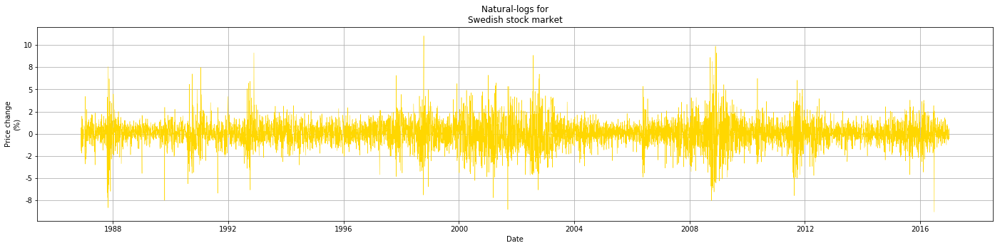

In [ ]:
plt.figure(figsize=(24,5))
plt.grid(b=True)

plt.xlabel('Date')
plt.ylabel('Price change\n(%)')

plt.title("Natural-logs for\nSwedish stock market")

plt.plot(df.Date_SWEDEN, df.LN_SWEDEN, color="gold",linewidth=0.5)
plt.gca().set_yticklabels(['{:.0f}'.format(x*100) for x in plt.gca().get_yticks()])

plt.show()

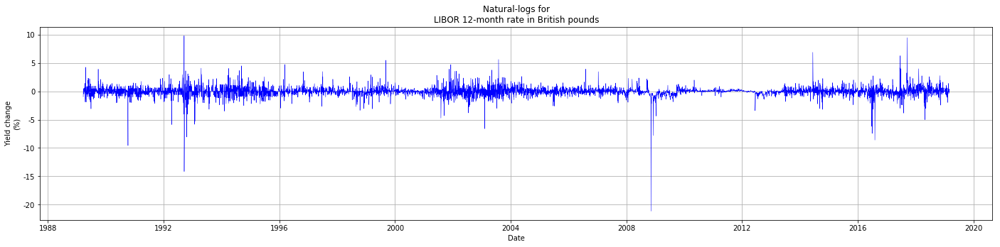

In [ ]:
plt.figure(figsize=(24,5))
plt.grid(b=True)


plt.xlabel('Date')
plt.ylabel('Yield change\n(%)')

plt.title("Natural-logs for\nLIBOR 12-month rate in British pounds")

plt.plot(df.Date_LIBOR, df.LN_LIBOR, color="blue",linewidth=0.5)
plt.gca().set_yticklabels(['{:.0f}'.format(x*100) for x in plt.gca().get_yticks()])

plt.show()

In [23]:
print("Here we consider if the daily price-changes for our three markets are Normally distributed.\nTo do this we use two statistical tests.")
print("\nHere we show the resulting p-values.\n\nAs we can see, the odds of these markets returns being Normally distributed are practically zero.\n")

import warnings
warnings.simplefilter("ignore")

Statistical_Tests=[[stats.kstest(list(df['Last Price'][1:-1]), 'norm').pvalue,
                    #stats.kstest(list(df.LN_SWEDEN[1:-1]), 'norm').pvalue,
                    #stats.kstest(list(df.LN_LIBOR[1:-1]), 'norm').pvalue], 
                   
                   [stats.shapiro(list(df['Last Price'][1:-1]))[1]]]]
                    #stats.shapiro(list(df.LN_SWEDEN[1:-1]))[1],
                    #stats.shapiro(list(df.LN_LIBOR[1:-1]))[1]]]

Statistical_Tests = pd.DataFrame(Statistical_Tests, columns = ['Last Price', 'data.index'], index = ['Kolmogorov-Smirnov', 'Shapiro-Wilk'])
Statistical_Tests

Here we consider if the daily price-changes for our three markets are Normally distributed.
To do this we use two statistical tests.

Here we show the resulting p-values.

As we can see, the odds of these markets returns being Normally distributed are practically zero.



,Last Price,data.index
Kolmogorov-Smirnov,0.0,[0.0]
Shapiro-Wilk,0.0,[0.0]


In [24]:
print("To begin the multifractal analysis, we must first define our Xt variables.\nIt is useful to have a function for this.")

Xt= lambda P: np.log(P) - np.log(P[0])

df['Xt_VIX']= Xt(df['Last Price'])
#df['Xt_SWEDEN']= Xt(df.Price_SWEDEN)
#df['Xt_LIBOR']= Xt(df.Price_LIBOR)

To begin the multifractal analysis, we must first define our Xt variables.
It is useful to have a function for this.


In [77]:
df[['Last Price','Xt_VIX']]

,Last Price,Xt_VIX
Date,,
2022-04-20,21.19,0.000000
2022-04-19,21.37,0.008459
2022-04-18,22.17,0.045211
2022-04-14,22.70,0.068836
2022-04-13,21.82,0.029298
...,...,...
1990-01-08,20.26,-0.044881
1990-01-05,20.11,-0.052312
1990-01-04,19.22,-0.097578


In [84]:
day_count = []
for i, each in enumerate(df.index, start=1):
  print ("{}.{}".format(i, each))
  day_count.append(i)


Streaming output truncated to the last 5000 lines.
3137.2009-11-03 00:00:00
3138.2009-11-02 00:00:00
3139.2009-10-30 00:00:00
3140.2009-10-29 00:00:00
3141.2009-10-28 00:00:00
3142.2009-10-27 00:00:00
3143.2009-10-26 00:00:00
3144.2009-10-23 00:00:00
3145.2009-10-22 00:00:00
3146.2009-10-21 00:00:00
3147.2009-10-20 00:00:00
3148.2009-10-19 00:00:00
3149.2009-10-16 00:00:00
3150.2009-10-15 00:00:00
3151.2009-10-14 00:00:00
3152.2009-10-13 00:00:00
3153.2009-10-12 00:00:00
3154.2009-10-09 00:00:00
3155.2009-10-08 00:00:00
3156.2009-10-07 00:00:00
3157.2009-10-06 00:00:00
3158.2009-10-05 00:00:00
3159.2009-10-02 00:00:00
3160.2009-10-01 00:00:00
3161.2009-09-30 00:00:00
3162.2009-09-29 00:00:00
3163.2009-09-28 00:00:00
3164.2009-09-25 00:00:00
3165.2009-09-24 00:00:00
3166.2009-09-23 00:00:00
3167.2009-09-22 00:00:00
3168.2009-09-21 00:00:00
3169.2009-09-18 00:00:00
3170.2009-09-17 00:00:00
3171.2009-09-16 00:00:00
3172.2009-09-15 00:00:00
3173.2009-09-14 00:00:00
3174.2009-09-11 00:00:00

In [90]:
print(len(day_count))

8136


In [93]:
day_count

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185

In [103]:
day_count= np.array(day_count)

In [108]:
day_count_T = day_count.transpose()

In [109]:
df['day_count'] = day_count_T

In [110]:
print(df)

            Last Price    Xt_VIX  1  2  3  4  5  6  7  8  ...  8128  8129  \
Date                                                      ...               
2022-04-20       21.19  0.000000  1  2  3  4  5  6  7  8  ...  8128  8129   
2022-04-19       21.37  0.008459  1  2  3  4  5  6  7  8  ...  8128  8129   
2022-04-18       22.17  0.045211  1  2  3  4  5  6  7  8  ...  8128  8129   
2022-04-14       22.70  0.068836  1  2  3  4  5  6  7  8  ...  8128  8129   
2022-04-13       21.82  0.029298  1  2  3  4  5  6  7  8  ...  8128  8129   
...                ...       ... .. .. .. .. .. .. .. ..  ...   ...   ...   
1990-01-08       20.26 -0.044881  1  2  3  4  5  6  7  8  ...  8128  8129   
1990-01-05       20.11 -0.052312  1  2  3  4  5  6  7  8  ...  8128  8129   
1990-01-04       19.22 -0.097578  1  2  3  4  5  6  7  8  ...  8128  8129   
1990-01-03       18.19 -0.152657  1  2  3  4  5  6  7  8  ...  8128  8129   
1990-01-02       17.24 -0.206297  1  2  3  4  5  6  7  8  ...  8128  8129   

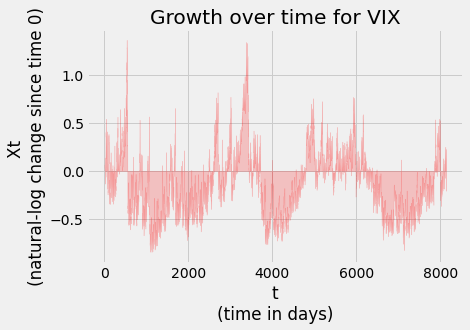

In [111]:
plt.grid(b=True)
plt.xlabel('t\n(time in days)')
plt.ylabel('Xt \n(natural-log change since time 0)')

plt.title("Growth over time for VIX")

plt.fill_between(day_count, df['Xt_VIX'], color="red", alpha=0.2)

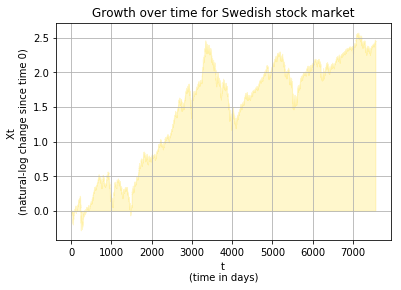

In [ ]:
plt.grid(b=True)
plt.xlabel('t\n(time in days)')
plt.ylabel('Xt \n(natural-log change since time 0)')

plt.title("Growth over time for Swedish stock market")

plt.fill_between(list(df.t), df.Xt_SWEDEN, color="gold", alpha=0.2)

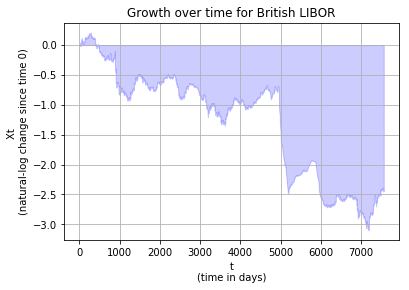

In [ ]:
plt.grid(b=True)
plt.xlabel('t\n(time in days)')
plt.ylabel('Xt \n(natural-log change since time 0)')

plt.title("Growth over time for British LIBOR")

plt.fill_between(list(df.t), df.Xt_LIBOR, color="blue", alpha=0.2)

In [112]:
print("We will be using a HIGHLY COMPOSITE NUMBER - 7560 - as our number of observations. \nThis is because this number has a lot of factors (numbers that can divide 7560 and yield a whole number).\n \nWe will call our time increments 'delta_t'.\n \nThe number of time increments - delta_t's - that we use in the analysis is the same as the number of factors. ")

delta_t=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 15, 18, 20, 21, 24, 27, 28, 30, 35, 36, 40, 42, 45, 54, 56, 60, 63, 70, 72, 84, 90, 105, 108, 120, 126, 135, 140, 168, 180, 189, 210, 216, 252, 270, 280, 315, 360, 378, 420, 504, 540, 630, 756, 840, 945, 1080, 1260, 1512, 1890, 2520, 3780, 7560)

We will be using a HIGHLY COMPOSITE NUMBER - 7560 - as our number of observations. 
This is because this number has a lot of factors (numbers that can divide 7560 and yield a whole number).
 
We will call our time increments 'delta_t'.
 
The number of time increments - delta_t's - that we use in the analysis is the same as the number of factors. 


In [113]:
print("The number of delta_t's is: " + str(len(delta_t)))

The number of delta_t's is: 64


In [114]:
print("Here are all the delta_t's (the factors of 7560):\n")

for i in range (0,int(len(delta_t)/2)):
    print("Factor " + str(i+1) + ": 7560 divided by " + str(delta_t[i]) + " is " + str(int(7560/delta_t[i])))
    
print("\n...\n \netc. \n \nAfter factor 32, the next factors are simply the results of the \ndivisions (90, 105, 108 etc. up to 7560), for a total of 64 factors.")

Here are all the delta_t's (the factors of 7560):

Factor 1: 7560 divided by 1 is 7560
Factor 2: 7560 divided by 2 is 3780
Factor 3: 7560 divided by 3 is 2520
Factor 4: 7560 divided by 4 is 1890
Factor 5: 7560 divided by 5 is 1512
Factor 6: 7560 divided by 6 is 1260
Factor 7: 7560 divided by 7 is 1080
Factor 8: 7560 divided by 8 is 945
Factor 9: 7560 divided by 9 is 840
Factor 10: 7560 divided by 10 is 756
Factor 11: 7560 divided by 12 is 630
Factor 12: 7560 divided by 14 is 540
Factor 13: 7560 divided by 15 is 504
Factor 14: 7560 divided by 18 is 420
Factor 15: 7560 divided by 20 is 378
Factor 16: 7560 divided by 21 is 360
Factor 17: 7560 divided by 24 is 315
Factor 18: 7560 divided by 27 is 280
Factor 19: 7560 divided by 28 is 270
Factor 20: 7560 divided by 30 is 252
Factor 21: 7560 divided by 35 is 216
Factor 22: 7560 divided by 36 is 210
Factor 23: 7560 divided by 40 is 189
Factor 24: 7560 divided by 42 is 180
Factor 25: 7560 divided by 45 is 168
Factor 26: 7560 divided by 54 is 14

In [115]:
print("Let us now choose the values of q - the statistical moments - that we will use for our partition function.")
print("\n(Recall that q=1 is the mean, q=2 is the variance, q=4 is the kurtosis etc.")
print("Well... almost... in fact, only q=1 is as the mean is correct. The other 'raw' moments need to be normalized.\nBut we don't need that distinction here.)")
print("\nMandelbrot et al (1997) chose approximately 99 values for q, mostly concentrated around the low values between 0 and 5.\nWe shall try to do something similar.")


q=[0.01, 0.1, 0.2, 0.3, 0.4, 
   0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 
   1.0, 1.05, 1.1, 1.15, 1.2, 1.25, 1.3, 1.35, 1.4, 1.45, 
   1.5, 1.55, 1.6, 1.65, 1.7, 1.75, 
   1.8, 1.81, 1.82, 1.83, 1.84, 1.85, 1.86, 1.87, 1.88, 1.89, 
   1.9, 1.91, 1.92, 1.93, 1.94, 1.95, 1.96, 1.97, 1.98, 1.985, 1.99, 
   1.991, 1.992, 1.993, 1.994, 1.995, 1.996, 1.997, 1.998, 1.999, 
   2.0, 
   2.001, 2.002, 2.003, 2.004, 2.005, 2.006, 2.007, 2.008, 2.009, 
   2.01, 2.015, 2.02, 2.025, 
   2.03, 2.04, 2.05, 2.06, 2.07, 2.08, 2.09, 
   2.1, 2.15, 2.2, 2.25, 2.3, 2.35, 2.4, 2.45, 2.5, 
   2.6, 2.7, 2.8, 2.9, 
   3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 
   4.0, 4.5, 
   5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 
   12.5, 15.0, 17.5, 20.0, 22.5, 25.0, 27.5, 
   30.0]


print("\nThe number of q's that we will use is " + str(len(q)) + ".")

Let us now choose the values of q - the statistical moments - that we will use for our partition function.

(Recall that q=1 is the mean, q=2 is the variance, q=4 is the kurtosis etc.
Well... almost... in fact, only q=1 is as the mean is correct. The other 'raw' moments need to be normalized.
But we don't need that distinction here.)

Mandelbrot et al (1997) chose approximately 99 values for q, mostly concentrated around the low values between 0 and 5.
We shall try to do something similar.

The number of q's that we will use is 121.


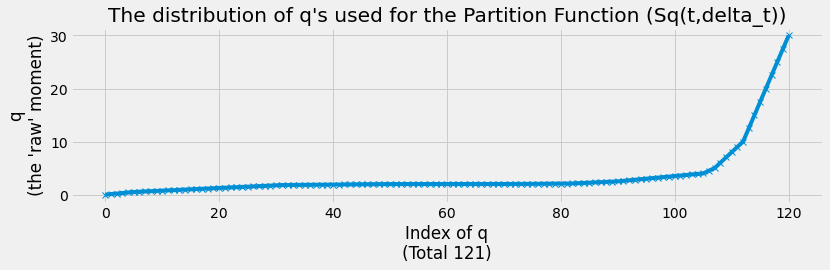

In [116]:
plt.figure(figsize=(12,3))
plt.grid(b=True)

plt.title("The distribution of q's used for the Partition Function (Sq(t,delta_t))")
plt.xlabel("Index of q\n(Total " + str(len(q)) + ")")
plt.ylabel("q\n(the 'raw' moment)")

plt.plot(q, marker='x')

In [117]:
print("q is:\n\n" + str(q))

q is:

[0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0, 1.05, 1.1, 1.15, 1.2, 1.25, 1.3, 1.35, 1.4, 1.45, 1.5, 1.55, 1.6, 1.65, 1.7, 1.75, 1.8, 1.81, 1.82, 1.83, 1.84, 1.85, 1.86, 1.87, 1.88, 1.89, 1.9, 1.91, 1.92, 1.93, 1.94, 1.95, 1.96, 1.97, 1.98, 1.985, 1.99, 1.991, 1.992, 1.993, 1.994, 1.995, 1.996, 1.997, 1.998, 1.999, 2.0, 2.001, 2.002, 2.003, 2.004, 2.005, 2.006, 2.007, 2.008, 2.009, 2.01, 2.015, 2.02, 2.025, 2.03, 2.04, 2.05, 2.06, 2.07, 2.08, 2.09, 2.1, 2.15, 2.2, 2.25, 2.3, 2.35, 2.4, 2.45, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.5, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 12.5, 15.0, 17.5, 20.0, 22.5, 25.0, 27.5, 30.0]


In [118]:
print("The number of q's between 1 and 3 is: " + str(sum(float(num) <= 3 and float(num) >=1 for num in q)) +"\n")

print("The number of q's less than 1 is: " + str(sum(float(num) <= 1 for num in q)))
print("The number of q's greater than 3 is: " + str(sum(float(num) >= 3 for num in q)) +"\n")

print("Total q's: " + str(len(q)))

The number of q's between 1 and 3 is: 81

The number of q's less than 1 is: 16
The number of q's greater than 3 is: 26

Total q's: 121


In [134]:
print("The next step is to figure out the partition function - Sq(T,delta_t) - for different values of delta_t and q.")
print("The partition function Sq(T,delta_t) will be used to estimate the scaling function tau(q).")


def partition_function(SIGMA, DELTA, XT, Q):
    print("Calculating the partition function...\nThis step will take quite a while... so strap yourself in...\n")
    SIGMA=[[0 for x in range(len(DELTA))] for y in range(len(Q))]
    for k in range (0, len(Q)):
        if k%30==0:
            print("calculating i=" + str(k) + ' out of ' + str(len(Q)-1))
        for j in range (0,len(DELTA)):
            for i in range (0,len(XT)-1):
                if i < int(len(XT)/DELTA[j]):
                    SIGMA[k][j]=SIGMA[k][j] + abs(XT[i*DELTA[j]+DELTA[j]]-XT[i*DELTA[j]])**Q[k]

    SIGMA=pd.DataFrame(SIGMA)
    
    for i in range (0,len(Q)):
        SIGMA.rename(index={SIGMA.index[i]:Q[i]}, inplace=True)
    for i in range (len(DELTA)-1,-1,-1):
        SIGMA.rename(columns={SIGMA.columns[i]:DELTA[i]}, inplace=True)
    
    print("Done! Your partition function is ready!\n")
    return SIGMA


print("\nHere we have defined our partition function in the form: \npartition_function(SIGMA, DELTA, XT, Q).")

The next step is to figure out the partition function - Sq(T,delta_t) - for different values of delta_t and q.
The partition function Sq(T,delta_t) will be used to estimate the scaling function tau(q).

Here we have defined our partition function in the form: 
partition_function(SIGMA, DELTA, XT, Q).


In [138]:
len(q)

121

In [135]:
df.Xt_VIX.iloc[0:7560]

Date
2022-04-20    0.000000
2022-04-19    0.008459
2022-04-18    0.045211
2022-04-14    0.068836
2022-04-13    0.029298
                ...   
1992-04-20   -0.285325
1992-04-16   -0.355530
1992-04-15   -0.335529
1992-04-14   -0.282191
1992-04-13   -0.220904
Name: Xt_VIX, Length: 7560, dtype: float64

In [140]:
len(delta_t)

64

In [142]:
print("Here, we will now begin calculating the partition functions for all our markets.\n")

partition_VIX=[[]]
#partition_SWEDEN=[[]]
#partition_LIBOR=[[]]

partition_VIX=partition_function(partition_VIX, delta_t, df.Xt_VIX.iloc[0:7559], q)
#partition_SWEDEN=partition_function(partition_SWEDEN, delta_t, df.Xt_SWEDEN, q)
#partition_LIBOR=partition_function(partition_LIBOR, delta_t, df.Xt_LIBOR, q)

print("\nDone! You can now proceed to estimating the scaling function - tau(q).")

Here, we will now begin calculating the partition functions for all our markets.

Calculating the partition function...
This step will take quite a while... so strap yourself in...

calculating i=0 out of 120
calculating i=30 out of 120
calculating i=60 out of 120
calculating i=90 out of 120
calculating i=120 out of 120
Done! Your partition function is ready!


Done! You can now proceed to estimating the scaling function - tau(q).


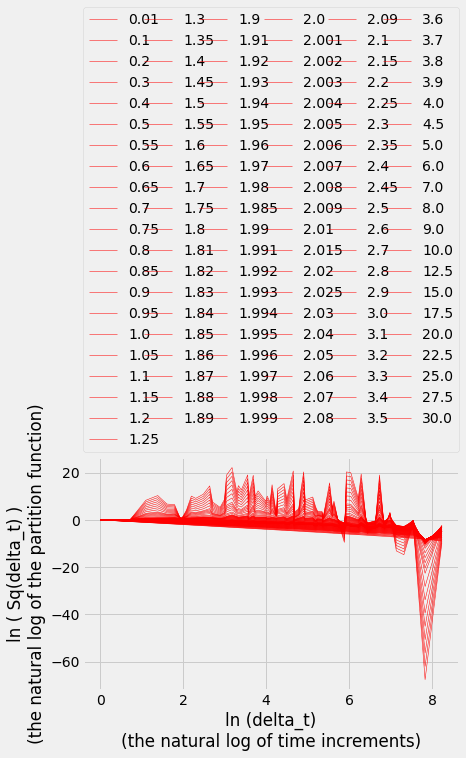

In [143]:
for i in range (0, len(q)):
    plt.plot(np.log(delta_t), np.log(list(partition_VIX.iloc[i])/partition_VIX[1][q[i]]), color="red",linewidth=0.5, label=str(q[i]))


plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,
           ncol=6, mode="expand", borderaxespad=0.)

plt.xlabel('ln (delta_t)\n(the natural log of time increments)')
plt.ylabel('ln ( Sq(delta_t) )\n(the natural log of the partition function)')

plt.show()

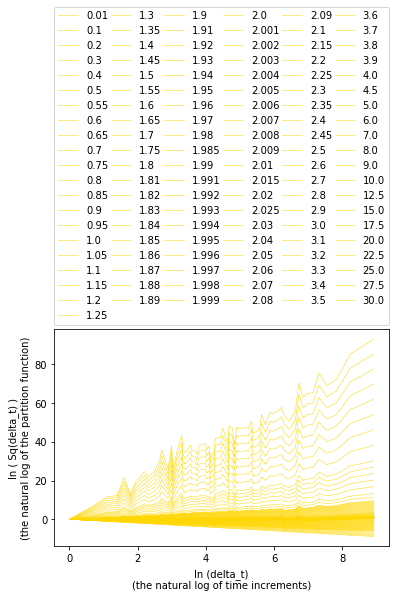

In [ ]:
for i in range (0, len(q)):
    plt.plot(np.log(delta_t), np.log(list(partition_SWEDEN.iloc[i])/partition_SWEDEN[1][q[i]]), color="gold",linewidth=0.5, label=str(q[i]))


plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,
           ncol=6, mode="expand", borderaxespad=0.)

plt.xlabel('ln (delta_t)\n(the natural log of time increments)')
plt.ylabel('ln ( Sq(delta_t) )\n(the natural log of the partition function)')

plt.show()

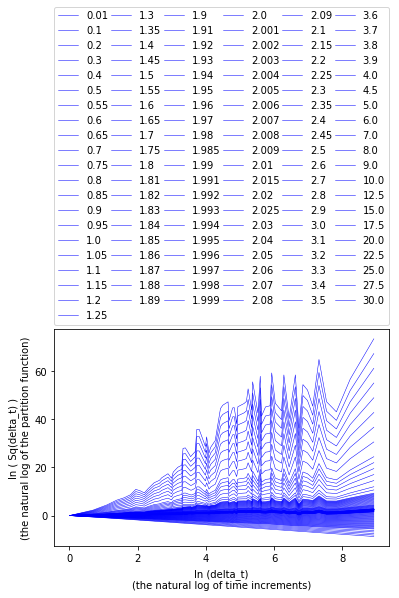

In [ ]:
for i in range (0, len(q)):
    plt.plot(np.log(delta_t), np.log(list(partition_LIBOR.iloc[i])/partition_LIBOR[1][q[i]]), color='blue',linewidth=0.5, label=str(q[i]))


plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,
           ncol=6, mode="expand", borderaxespad=0.)

plt.xlabel('ln (delta_t)\n(the natural log of time increments)')
plt.ylabel('ln ( Sq(delta_t) )\n(the natural log of the partition function)')

plt.show()

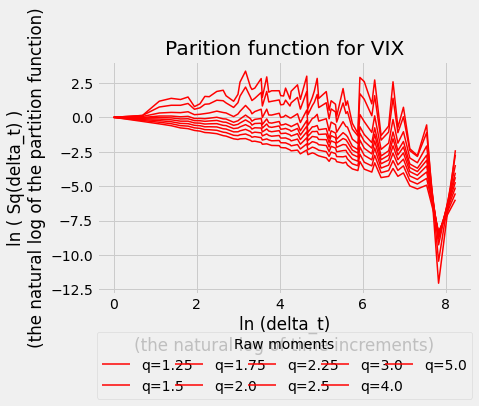

In [144]:
for i in range (0, len(q)):
    if q[i]%0.25==0 and q[i]<6 and q[i]>1 and q[i]!=3.5 and q[i]!=4.5:
        plt.plot(np.log(delta_t), np.log(list(partition_VIX.iloc[i])/partition_VIX[1][q[i]]), color="red", linewidth=1.5, label='q='+str(q[i]))


plt.legend(bbox_to_anchor=(0., -0.45, 1., .102), loc=3,
           ncol=5, mode="expand", borderaxespad=0., title="Raw moments")

plt.title("Parition function for VIX")
plt.xlabel('ln (delta_t)\n(the natural log of time increments)')
plt.ylabel('ln ( Sq(delta_t) )\n(the natural log of the partition function)')

plt.show()

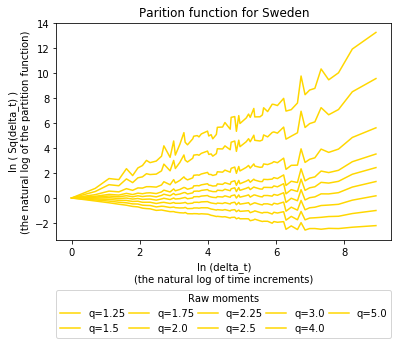

In [ ]:
for i in range (0, len(q)):
    if q[i]%0.25==0 and q[i]<6 and q[i]>1 and q[i]!=3.5 and q[i]!=4.5:
        plt.plot(np.log(delta_t), np.log(list(partition_SWEDEN.iloc[i])/partition_SWEDEN[1][q[i]]), color="gold",linewidth=1.5, label='q='+str(q[i]))


plt.legend(bbox_to_anchor=(0., -0.45, 1., .102), loc=3,
           ncol=5, mode="expand", borderaxespad=0., title="Raw moments")

plt.title("Parition function for Sweden")
plt.xlabel('ln (delta_t)\n(the natural log of time increments)')
plt.ylabel('ln ( Sq(delta_t) )\n(the natural log of the partition function)')

plt.show()

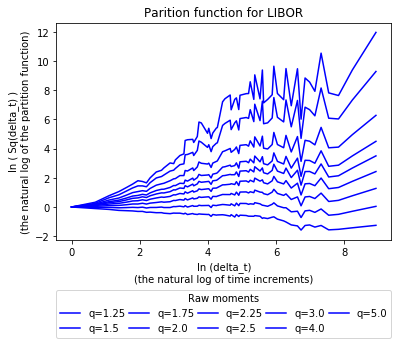

In [ ]:
for i in range (0, len(q)):
    if q[i]%0.25==0 and q[i]<6 and q[i]>1 and q[i]!=3.5 and q[i]!=4.5:
        plt.plot(np.log(delta_t), np.log(list(partition_LIBOR.iloc[i])/partition_LIBOR[1][q[i]]), color="blue",linewidth=1.5, label='q='+str(q[i]))


plt.legend(bbox_to_anchor=(0., -0.45, 1., .102), loc=3,
           ncol=5, mode="expand", borderaxespad=0., title="Raw moments")

plt.title("Parition function for LIBOR")
plt.xlabel('ln (delta_t)\n(the natural log of time increments)')
plt.ylabel('ln ( Sq(delta_t) )\n(the natural log of the partition function)')

plt.show()

In [ ]:
tau_regression=pd.DataFrame(np.log(delta_t))
tau_regression['LN_DELTA']=pd.DataFrame(np.log(delta_t))
tau_regression['LN_T']=[np.log(7560) for x in range(len(delta_t))]

def scaling_function(TAU_Q, PARTITION, Q):
    TAU_Q=[0 for x in range(len(Q))]
    
    for i in range(0,len(Q)):
        TAU_Q[i]=((sm.OLS(endog=np.log(list(PARTITION.iloc[i]/PARTITION[1][Q[i]])), exog = tau_regression[['LN_DELTA','LN_T']], missing='drop')).fit()).params[0]
    
    TAU_Q=pd.DataFrame(TAU_Q)

    return TAU_Q
    
print("Here we have defined how to find the estimated scaling function tau_q. \n\nWe are now ready to estimate tau_q for each market.")


Here we have defined how to find the estimated scaling function tau_q. 

We are now ready to estimate tau_q for each market.


In [ ]:
tau_q_NORWAY=0
tau_q_SWEDEN=0
tau_q_LIBOR=0

tau_q_NORWAY = scaling_function(tau_q_NORWAY, partition_NORWAY, q)
tau_q_SWEDEN = scaling_function(tau_q_SWEDEN, partition_SWEDEN, q)
tau_q_LIBOR = scaling_function(tau_q_LIBOR, partition_LIBOR, q)

hypothetical_tau_q = [0.5*x -1 for x in q]

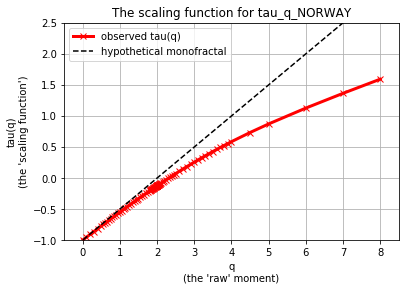

In [ ]:
plt.grid(b=True)
plt.title("The scaling function for tau_q_NORWAY")

plt.xlabel("q\n(the 'raw' moment)")
plt.ylabel("tau(q)\n(the 'scaling function')")

axes = plt.gca()
axes.set_xlim([-0.5,8.5])
axes.set_ylim([-1,2.5])

plt.plot(q[0:111], tau_q_NORWAY[0:111], color="red",linewidth=3, marker="x", label="observed tau(q)")
plt.plot(q[0:111], hypothetical_tau_q[0:111], color="black", linestyle='--', label="hypothetical monofractal")
plt.legend()
plt.show()

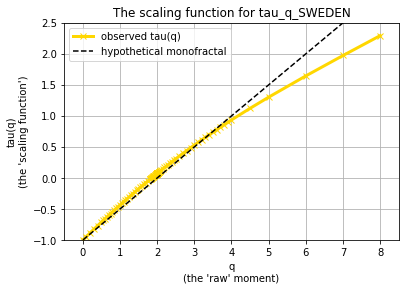

In [ ]:
plt.grid(b=True)
plt.title("The scaling function for tau_q_SWEDEN")


plt.xlabel("q\n(the 'raw' moment)")
plt.ylabel("tau(q)\n(the 'scaling function')")

axes = plt.gca()
axes.set_xlim([-0.5,8.5])
axes.set_ylim([-1,2.5])

plt.plot(q[0:111], tau_q_SWEDEN[0:111], color="gold",linewidth=3, marker="x", label="observed tau(q)")
plt.plot(q[0:111], hypothetical_tau_q[0:111], color="black", linestyle='--', label="hypothetical monofractal")
plt.legend()
plt.show()

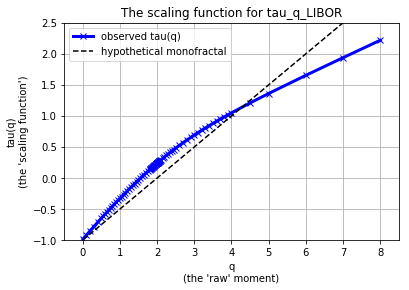

In [ ]:
plt.grid(b=True)
plt.title("The scaling function for tau_q_LIBOR")

plt.xlabel("q\n(the 'raw' moment)")
plt.ylabel("tau(q)\n(the 'scaling function')")

axes = plt.gca()
axes.set_xlim([-0.5,8.5])
axes.set_ylim([-1,2.5])

plt.plot(q[0:111], tau_q_LIBOR[0:111], color="blue",linewidth=3, marker="x", label="observed tau(q)")
plt.plot(q[0:111], hypothetical_tau_q[0:111], color="black", linestyle='--', label="hypothetical monofractal")
plt.legend()
plt.show()

In [ ]:
print("Our intercept is somewhere between:")
print(str(tau_q_NORWAY[0][85])+ " for q=" +str(q[85]))
print(str(tau_q_NORWAY[0][86])+ " for q=" +str(q[86]))

print("\nTherefore NORWAY's H is " + str(round(1/q[86], 3)) + " < H < " + str(round(1/q[85], 3)))

Our intercept is somewhere between:
-0.02323130468519012 for q=2.25
-0.0037307426913569808 for q=2.3

Therefore NORWAY's H is 0.435 < H < 0.444


In [ ]:
print("Our intercept is somewhere between:")
print(str(tau_q_SWEDEN[0][35])+ " for q=" +str(q[35]))
print(str(tau_q_SWEDEN[0][36])+ " for q=" +str(q[36]))

print("\nTherefore Sweden's H is " + str(round(1/q[36], 3)) + " < H < " + str(round(1/q[35], 3)))

Our intercept is somewhere between:
-0.0031340307339489115 for q=1.84
0.0017816021153757647 for q=1.85

Therefore Sweden's H is 0.541 < H < 0.543


In [ ]:
print("Our intercept is somewhere between:")
print(str(tau_q_LIBOR[0][26])+ " for q=" +str(q[26]))
print(str(tau_q_LIBOR[0][27])+ " for q=" +str(q[27]))

print("\nTherefore the UK LIBOR's H is " + str(round(1/q[27], 3)) + " < H < " + str(round(1/q[26], 3)))

Our intercept is somewhere between:
-0.0014986305158324405 for q=1.55
0.02664349951922626 for q=1.6

Therefore the UK LIBOR's H is 0.625 < H < 0.645


In [ ]:
max_q=105

print("Here we have defined the highest moment q which we will use for estimating the multifractal spectrum.")

Here we have defined the highest moment q which we will use for estimating the multifractal spectrum.


In [ ]:
print("We have seen that the partition function Sq(T,delta_t) for higher moments is less robust.\nSo in estimating our scaling function, we will restrict ourselves to lower moments.")
print("\nHere, we will only use moments up to q=" + str(q[max_q]) + " to estimate the scaling function tau(q) by non-linear regression.")
print("\nNext, using the parameters that we obtained from regression, we will perform\na Legendre transformation on tau(q) to estimate the multifractal spectrum f(a).")


def estimate_multifractal_spectrum(TAU_Q, Q, MIN_Q, MAX_Q):
    TAU_Q_ESTIMATED = np.polyfit(Q[MIN_Q:MAX_Q], TAU_Q[MIN_Q:MAX_Q], 2)
    
    F_A = [0 for x in range(len(q)-10)]
    p = [0 for x in range(len(q)-10)]
    
    a = TAU_Q_ESTIMATED[0][0]
    b = TAU_Q_ESTIMATED[1][0]
    c = TAU_Q_ESTIMATED[2][0]
    
    for i in range(0, len(q)-10):
        p[i] = 2*a*Q[i]+b
        F_A[i] = ((p[i]-b)/(2*a))*p[i] - (a*((p[i]-b)/(2*a))**2 + b*((p[i]-b)/(2*a)) + c)
    
    F_A = pd.DataFrame(F_A)
    F_A.rename(columns={F_A.columns[0]:"f(a)"}, inplace=True)
    F_A['p'] = p
    
    print("Using the range of q's from " + str(Q[MIN_Q]) + " to " + str(Q[MAX_Q]) + ":")
    print("The estimated parameters for tau(q) are: \n" + str(TAU_Q_ESTIMATED))
    print("\nThus, the estimated parameters for f(a) are: \n" + str(1/(4*a)) + ", \n"  + str((-2*b)/(4*a)) + ", \n"+ str((-4*a*c+b**2)/(4*a)))
    
    return F_A

We have seen that the partition function Sq(T,delta_t) for higher moments is less robust.
So in estimating our scaling function, we will restrict ourselves to lower moments.

Here, we will only use moments up to q=4.0 to estimate the scaling function tau(q) by non-linear regression.

Next, using the parameters that we obtained from regression, we will perform
a Legendre transformation on tau(q) to estimate the multifractal spectrum f(a).


In [ ]:
f_a_NORWAY = estimate_multifractal_spectrum(tau_q_NORWAY, q, 0, max_q)

print ("\nf_a_NORWAY[f(a)][0] is: " + str(f_a_NORWAY['f(a)'][0]))

Using the range of q's from 0.01 to 4.0:
The estimated parameters for tau(q) are: 
[[-0.02119676]
 [ 0.48380015]
 [-1.00559628]]

Thus, the estimated parameters for f(a) are: 
-11.794255562849537, 
11.412125260624025, 
-1.7549976874789843

f_a_NORWAY[f(a)][0] is: 1.0055941589110933


In [ ]:
f_a_SWEDEN = estimate_multifractal_spectrum(tau_q_SWEDEN, q, 0, max_q)


print ("\nf_a_SWEDEN[f(a)][0] is: " + str(f_a_SWEDEN['f(a)'][0]))

Using the range of q's from 0.01 to 4.0:
The estimated parameters for tau(q) are: 
[[-0.02687856]
 [ 0.59061189]
 [-0.99888873]]

Thus, the estimated parameters for f(a) are: 
-9.301094482632855, 
10.98667400844778, 
-2.245541428374209

f_a_SWEDEN[f(a)][0] is: 0.9988860417823353


In [ ]:
f_a_LIBOR = estimate_multifractal_spectrum(tau_q_LIBOR, q, 0, max_q)

print ("\nf_a_LIBOR[f(a)][0] is: " + str(f_a_LIBOR['f(a)'][0]))

Using the range of q's from 0.01 to 4.0:
The estimated parameters for tau(q) are: 
[[-0.0544081 ]
 [ 0.72757624]
 [-0.99711442]]

Thus, the estimated parameters for f(a) are: 
-4.594904082944945, 
6.686286081872329, 
-1.4352770263190417

f_a_LIBOR[f(a)][0] is: 0.9971089800927976


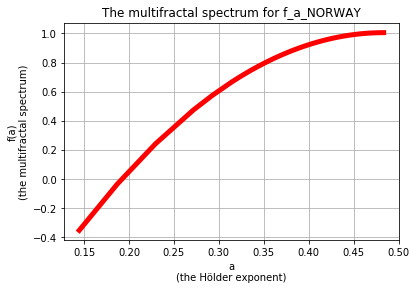

In [ ]:
plt.grid(b=True)
plt.title("The multifractal spectrum for f_a_NORWAY")

plt.xlabel("a\n(the Hölder exponent)")
plt.ylabel('f(a)\n(the multifractal spectrum)')

# axes = plt.gca()
# axes.set_xlim([0.2,0.7])
# axes.set_ylim([0,1.1])

plt.plot(f_a_NORWAY['p'],f_a_NORWAY['f(a)'], color="red",linewidth=5)

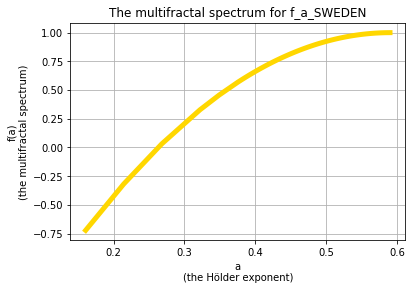

In [ ]:
plt.grid(b=True)
plt.title("The multifractal spectrum for f_a_SWEDEN")

plt.xlabel("a\n(the Hölder exponent)")
plt.ylabel('f(a)\n(the multifractal spectrum)')

# axes = plt.gca()
# axes.set_xlim([0.2,0.8])
# axes.set_ylim([0,1.1])

plt.plot(f_a_SWEDEN['p'],f_a_SWEDEN['f(a)'], color="gold",linewidth=5)

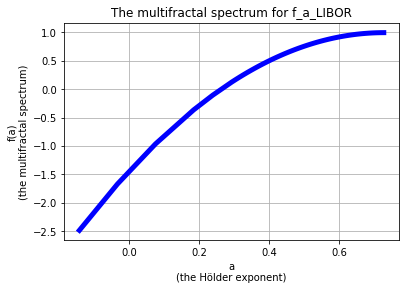

In [ ]:
plt.grid(b=True)
plt.title("The multifractal spectrum for f_a_LIBOR")

plt.xlabel("a\n(the Hölder exponent)")
plt.ylabel('f(a)\n(the multifractal spectrum)')

# axes = plt.gca()
# axes.set_xlim([0.2,0.8])
# axes.set_ylim([0,1.1])

plt.plot(f_a_LIBOR['p'],f_a_LIBOR['f(a)'], color="blue",linewidth=5)

In [ ]:
print("Using the parameters for our tau(q)'s that we estimated by non-linear regression, \nwe can calculate precise values for H:")

Using the parameters for our tau(q)'s that we estimated by non-linear regression, 
we can calculate precise values for H:


In [ ]:
def estimate_H(TAU_Q, Q, MIN_Q, MAX_Q):
    TAU_Q_ESTIMATED = np.polyfit(Q[MIN_Q:MAX_Q], TAU_Q[MIN_Q:MAX_Q], 2)
    
    def f(x):
        return TAU_Q_ESTIMATED[0][0]*x**2 + TAU_Q_ESTIMATED[1][0]*x + TAU_Q_ESTIMATED[2][0]
    
    temp = fsolve(f, [0,4])
    
    H = 1/temp
    return H[0]

print("Here we have defined our function for precisely estimating H.")

Here we have defined our function for precisely estimating H.


In [ ]:
H_NORWAY = estimate_H(tau_q_NORWAY, q, 0, max_q)
H_SWEDEN = estimate_H(tau_q_SWEDEN, q, 0, max_q)
H_LIBOR = estimate_H(tau_q_LIBOR, q, 0, max_q)

print("Here, we calculate our H-values to be:\n")
print("For NORWAY: H = " + str(H_NORWAY))
print("For Sweden: H = " + str(H_SWEDEN))
print("For LIBOR: H = " + str(H_LIBOR))

Here, we calculate our H-values to be:

For NORWAY: H = 0.43235420116535195
For Sweden: H = 0.5415842332894015
For LIBOR: H = 0.6450967232546713


In [ ]:
print("Thus, using our estimated multifractal spectra, we get that:")
print("\nNORWAY's estimated alpha zero = " + str(f_a_NORWAY['p'][0]))
print("\nSweden's estimated alpha zero = " + str(f_a_SWEDEN['p'][0]))
print("\nLIBOR's estimated alpha zero = " + str(f_a_LIBOR['p'][0]))

Thus, using our estimated multifractal spectra, we get that:

NORWAY's estimated alpha zero = 0.4833762164921763

Sweden's estimated alpha zero = 0.5900743202288501

LIBOR's estimated alpha zero = 0.7264880791149612


In [ ]:
print("From this, it is easy to estimate the means and variances for the log-normal distribution:")
print("\nUsing: \n \n𝜆 = a / H \n \n and \n \n𝜎^2 = (2(𝜆-1))/ln[b]")

def lambda_mean(H,ALPHA):
    LAMBDA = ALPHA/H
    return LAMBDA

def sigma_variance(LAMBDA, B):
    SIGMA_VARIANCE = (2*(LAMBDA-1))/np.log(B)
    return SIGMA_VARIANCE

From this, it is easy to estimate the means and variances for the log-normal distribution:

Using: 
 
𝜆 = a / H 
 
 and 
 
𝜎^2 = (2(𝜆-1))/ln[b]


In [ ]:
print("Assuming we will partition our multifractal cascade in two at each step, meaning b=2:")

b=2

lambda_NORWAY = lambda_mean(H_NORWAY, f_a_NORWAY['p'][0])
lambda_SWEDEN = lambda_mean(H_SWEDEN, f_a_SWEDEN['p'][0])
lambda_LIBOR = lambda_mean(H_LIBOR, f_a_LIBOR['p'][0])

sigma_NORWAY = sigma_variance(lambda_NORWAY, b)
sigma_SWEDEN = sigma_variance(lambda_SWEDEN, b)
sigma_LIBOR = sigma_variance(lambda_LIBOR, b)

print("\nFor NORWAY, we estimate\n  𝜆 = " + str(lambda_NORWAY) + "\n  𝜎^2 = " + str(sigma_NORWAY))
print("\nFor Sweden, we estimate\n  𝜆 = " + str(lambda_SWEDEN) + "\n  𝜎^2 = " + str(sigma_SWEDEN))
print("\nFor LIBOR, we estimate\n  𝜆 = " + str(lambda_LIBOR) + "\n  𝜎^2 = " + str(sigma_LIBOR))

Assuming we will partition our multifractal cascade in two at each step, meaning b=2:

For NORWAY, we estimate
  𝜆 = 1.118009759565887
  𝜎^2 = 0.3405041898044085

For Sweden, we estimate
  𝜆 = 1.089533786175672
  𝜎^2 = 0.2583398986153096

For LIBOR, we estimate
  𝜆 = 1.1261692284680203
  𝜎^2 = 0.3640474404471989


In [ ]:
print("Here, we can print our final estimated results.\n")
print("We are now ready to begin constructing our MMAR simulations!\n")

RESULTS = pd.DataFrame([0 for x in range(0,3)])
# RESULTS = pd.DataFrame([[H_NORWAY,H_SWEDEN,H_LIBOR],
#  [f_a_NORWAY['p'][0],f_a_SWEDEN['p'][0], f_a_LIBOR['p'][0]],
#  [lambda_NORWAY, lambda_SWEDEN, lambda_LIBOR]
#  [sigma_NORWAY, sigma_SWEDEN, sigma_LIBOR]])

RESULTS['H'] = pd.DataFrame([H_NORWAY,H_SWEDEN,H_LIBOR])
RESULTS['alpha zero'] = pd.DataFrame([f_a_NORWAY['p'][0],f_a_SWEDEN['p'][0], f_a_LIBOR['p'][0]])
RESULTS['lambda'] = pd.DataFrame([lambda_NORWAY, lambda_SWEDEN, lambda_LIBOR])
RESULTS['sigma^2'] = pd.DataFrame([sigma_NORWAY, sigma_SWEDEN, sigma_LIBOR])

RESULTS.rename(index={RESULTS.index[0]:'Norway'}, inplace=True)
RESULTS.rename(index={RESULTS.index[1]:'Sweden'}, inplace=True)
RESULTS.rename(index={RESULTS.index[2]:'UK LIBOR'}, inplace=True)

RESULTS.drop(labels=0, axis=1, inplace=True)

RESULTS

RESULTS.round(decimals=3)



Here, we can print our final estimated results.

We are now ready to begin constructing our MMAR simulations!



,H,alpha zero,lambda,sigma^2
Norway,0.432,0.483,1.118,0.341
Sweden,0.542,0.590,1.090,0.258
UK LIBOR,0.645,0.726,1.126,0.364


In [ ]:
RESULTS

,H,alpha zero,lambda,sigma^2
Norway,0.432354,0.483376,1.118010,0.340504
Sweden,0.541584,0.590074,1.089534,0.258340
UK LIBOR,0.645097,0.726488,1.126169,0.364047


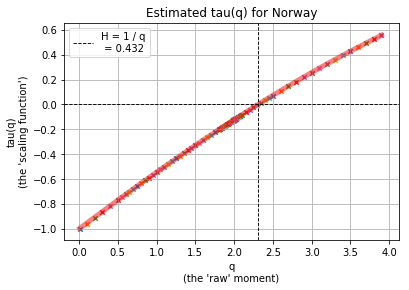

Using the range of q's from 0.01 to 4.0:
The estimated parameters for tau(q) are: 
[[-0.02119676]
 [ 0.48380015]
 [-1.00559628]]

Thus, the estimated parameters for f(a) are: 
-11.794255562849537, 
11.412125260624025, 
-1.7549976874789843

For NORWAY, we estimate
  𝜆 = 1.118009759565887
  𝜎^2 = 0.3405041898044085


In [ ]:

tau_q_ESTIMATED_NORWAY=0

tau_q_ESTIMATED_NORWAY=np.polyfit(q[0:max_q],tau_q_NORWAY[0:max_q],2)

for i in range(0,max_q):
    plt.scatter(q[i], (tau_q_ESTIMATED_NORWAY[0][0]*(q[i]**2) + tau_q_ESTIMATED_NORWAY[1][0]*q[i] + tau_q_ESTIMATED_NORWAY[2][0]), s = 20, marker='x')

plt.plot(q[0:max_q], tau_q_NORWAY[0:max_q], color="red",linewidth=5, alpha = 0.5)
#plt.plot(q,tau_q_ESTIMATED_NORWAY, linewidth=1)

plt.grid(b=True)
plt.title("Estimated tau(q) for Norway")
plt.xlabel("q\n(the 'raw' moment)")
plt.axvline(1/H_NORWAY, color="black", linestyle='--', linewidth=0.9, label = "H = 1 / q\n = " + str(round(H_NORWAY, 3)))
plt.axhline(0, color="black", linestyle='--', linewidth=0.9)
plt.ylabel("tau(q)\n(the 'scaling function')")
plt.legend()
plt.show()

print("\nFor NORWAY, we estimate\n  𝜆 = " + str(lambda_NORWAY) + "\n  𝜎^2 = " + str(sigma_NORWAY))

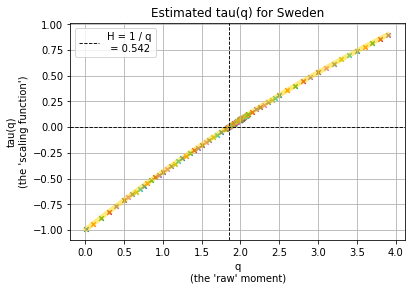

Using the range of q's from 0.01 to 4.0:
The estimated parameters for tau(q) are: 
[[-0.02687856]
 [ 0.59061189]
 [-0.99888873]]

Thus, the estimated parameters for f(a) are: 
-9.301094482632855, 
10.98667400844778, 
-2.245541428374209

For SWEDEN, we estimate
  𝜆 = 1.089533786175672
  𝜎^2 = 0.2583398986153096


In [ ]:
tau_q_ESTIMATED_SWEDEN=0

tau_q_ESTIMATED_SWEDEN=np.polyfit(q[0:max_q],tau_q_SWEDEN[0:max_q],2)

for i in range(0,max_q):
    plt.scatter(q[i], (tau_q_ESTIMATED_SWEDEN[0][0]*(q[i]**2) + tau_q_ESTIMATED_SWEDEN[1][0]*q[i] + tau_q_ESTIMATED_SWEDEN[2][0]), s = 20, marker='x')

plt.plot(q[0:max_q], tau_q_SWEDEN[0:max_q], color="gold",linewidth=5, alpha=0.5)
#plt.plot(q,tau_q_ESTIMATED_NORWAY, linewidth=1)

plt.grid(b=True)
plt.title("Estimated tau(q) for Sweden")
plt.xlabel("q\n(the 'raw' moment)")
plt.axvline(1/H_SWEDEN, color="black", linestyle='--', linewidth=0.9, label = "H = 1 / q\n = " + str(round(H_SWEDEN, 3)))
plt.axhline(0, color="black", linestyle='--', linewidth=0.9)
plt.ylabel("tau(q)\n(the 'scaling function')")
plt.legend()
plt.show()

print("\nFor SWEDEN, we estimate\n  𝜆 = " + str(lambda_SWEDEN) + "\n  𝜎^2 = " + str(sigma_SWEDEN))

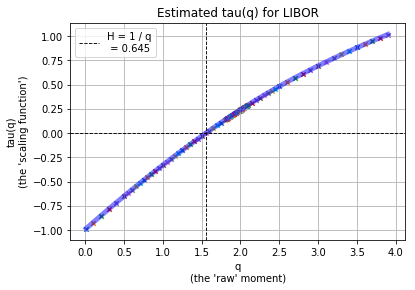


For LIBOR, we estimate
  𝜆 = 1.1261692284680203
  𝜎^2 = 0.3640474404471989


In [ ]:
tau_q_ESTIMATED_LIBOR=0

tau_q_ESTIMATED_LIBOR=np.polyfit(q[0:max_q],tau_q_LIBOR[0:max_q],2)

for i in range(0,max_q):
    plt.scatter(q[i], (tau_q_ESTIMATED_LIBOR[0][0]*(q[i]**2) + tau_q_ESTIMATED_LIBOR[1][0]*q[i] + tau_q_ESTIMATED_LIBOR[2][0]), s = 20, marker='x')

plt.plot(q[0:max_q], tau_q_LIBOR[0:max_q], color="blue",linewidth=5, alpha=0.5)
#plt.plot(q,tau_q_ESTIMATED_NORWAY, linewidth=1)

plt.grid(b=True)
plt.title("Estimated tau(q) for LIBOR")
plt.xlabel("q\n(the 'raw' moment)")
plt.axvline(1/H_LIBOR, color="black", linestyle='--', linewidth=0.9, label = "H = 1 / q\n = " + str(round(H_LIBOR, 3)))
plt.axhline(0, color="black", linestyle='--', linewidth=0.9)
plt.ylabel("tau(q)\n(the 'scaling function')")
plt.legend()
plt.show()


print("\nFor LIBOR, we estimate\n  𝜆 = " + str(lambda_LIBOR) + "\n  𝜎^2 = " + str(sigma_LIBOR))

In [ ]:
pip install fbm


The following command must be run outside of the IPython shell:

    $ pip install fbm

The Python package manager (pip) can only be used from outside of IPython.
Please reissue the `pip` command in a separate terminal or command prompt.

See the Python documentation for more information on how to install packages:

    https://docs.python.org/3/installing/


In [ ]:
from fbm import FBM
from fbm import fbm, fgn, times
from fbm import MBM
from fbm import mbm, mgn, times

import math

In [ ]:
def lognormal_cascade(k, v,ln_lambda, ln_theta):
    
    k = k - 1

    m0 = np.random.lognormal(ln_lambda,ln_theta)
    m1 = np.random.lognormal(ln_lambda,ln_theta)
    M = [m0, m1]
    
    if (k >= 0):
        d=[0 for x in range(0,2)]
        for i in range(0,2):
            d[i] = lognormal_cascade(k, (M[i]*v), ln_lambda, ln_theta)
        
        v = d

    return v


In [ ]:
def MMAR(K, simulated_H, simulated_lambda, simulated_sigma, original_price_history, magnitude_parameter, GRAPHS):

    # --- VARIABLES ---
    # K
        # adjust K depending on how many days you want to simulate (e.g. if K=13, you'll simulate 2^13=8192 days)
    # simulated_H
        # the Hurst parameter for the fBm process
    # simulated_lambda
        # the mean for the lognormal cascade
    # simulated_sigma
        # the variance for the lognormal cascade
    # original_price_history
        # the price history of the market under study (used for starting the prices from the right time!)
    # magnitude_parameter
        # adjust this up or down to change the range of price changes (e.g. if prices are swinging too wildly every day, then adjust this downwards)
    # GRAPHS
        # Boolean - either True or False - use True if you want the MMAR to simulate graphs for you
        
    # --- MESSAGE ---
    if GRAPHS == True:
        print("Performing an MMAR simulation with parameters:\n\nH = " + str(simulated_H) + "\nlambda = " + str(simulated_lambda) + "\nsigma = " + str(simulated_sigma) + "\nfBm magnitude = " + str(magnitude_parameter)+ "\n")

    # --- CASCADE ---
    new_cascade = list(np.array(lognormal_cascade(k=K, v=1, ln_lambda = simulated_lambda, ln_theta = simulated_sigma)).flat)
    if GRAPHS == True:
#         plt.figure(figsize=(24,2))
        plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.title("Binomial Cascade")
        plt.xlabel("Conventional time\n(days)")
        plt.ylabel('"Mass"')
        plt.plot(new_cascade, color="crimson", linewidth=0.5)
        plt.show()


    # --- TRADING TIME ---
    tradingtime = 2**K*np.cumsum(new_cascade)/sum(new_cascade)
    if GRAPHS == True:
        plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.yticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.title("Trading time\n(normalized)")
        plt.xlabel("Conventional time\n(days)")
        plt.ylabel('"Trading time"\n(\u03B8 (t), normalized)')
        plt.plot(tradingtime, color="orangered")

        
    # --- FBM (Fractional Brownian Motion) ---
    new_fbm_class = FBM(n = 10*2**K+1, hurst = simulated_H, length = magnitude_parameter, method='daviesharte')
    new_fbm_simulation = new_fbm_class.fbm()
    if GRAPHS == True:
        plt.figure(figsize=(24,2))
        plt.xticks(np.arange(0, 10*2**(K)+1, 10*2**(K-3)))
        plt.title("Fractional Brownian Motion")
        plt.xlabel("t")
        plt.ylabel('fBm (t)')
        plt.plot(new_fbm_simulation, color="orange")
        plt.show()

        
    # --- MMAR XT's ---
    simulated_xt_array = [0 for x in range(0, len(tradingtime))]

    for i in range(0, len(tradingtime)):
        simulated_xt_array[i] = new_fbm_simulation[int(tradingtime[i]*10)]

    if GRAPHS == True:
        plt.title("MMAR generated Xt")
        plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.xlabel("Time\n(days)")
        plt.ylabel('X(t)\n(Natural log growth since beginning)')
        plt.grid(b=True)
        plt.fill_between(np.arange(0, 2**K, 1) , simulated_xt_array, color="darkviolet", alpha=0.2)
        plt.show()


    # --- PRICES ---
    if GRAPHS == True:
        plt.title("MMAR generated Price")
        plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.xlabel("Time\n(days)")
        plt.ylabel('Price level')
        plt.grid(b=True)
        plt.fill_between(np.arange(0, 2**K, 1) , original_price_history[0]*np.exp(simulated_xt_array), color="limegreen", alpha=0.2)
        plt.show()

        
    # --- LN CHANGES ---
    if GRAPHS == True:
        ln_simulated_xt_array = [0 for x in range(0, len(simulated_xt_array)-1)]

        for i in range(1,len(simulated_xt_array)):
            ln_simulated_xt_array[i-1] = np.log((original_price_history[0]*np.exp(simulated_xt_array[i]))/(original_price_history[0]*np.exp(simulated_xt_array[i-1])))
            
        plt.figure(figsize=(24,5))
        plt.title("Price increments")
        plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.xlabel("Time\n(days)")
        plt.ylabel('Change\n(%)')
        plt.grid(b=True)
        plt.plot(ln_simulated_xt_array, color="darkviolet", linewidth=0.5)
        plt.gca().set_yticklabels(['{:.0f}'.format(x*100) for x in plt.gca().get_yticks()]) 
        plt.show()
        print("The number of price increments that equal zero is: " + str(list(np.abs(ln_simulated_xt_array)).count(0)))
    
    # --- END ---
    return simulated_xt_array

Performing an MMAR simulation with parameters:

H = 0.43235420116535195
lambda = 1.118009759565887
sigma = 0.3405041898044085
fBm magnitude = 0.15



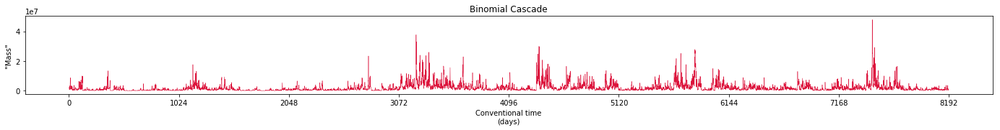

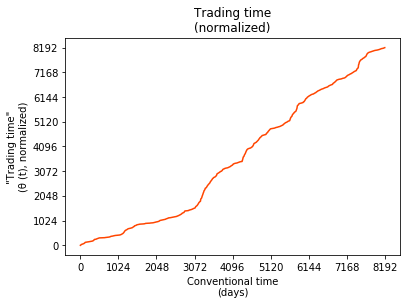

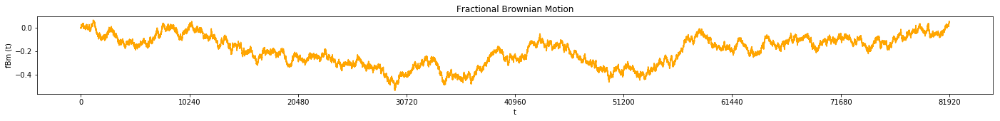

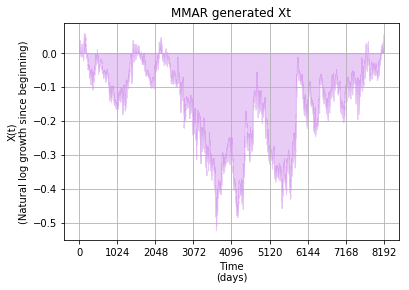

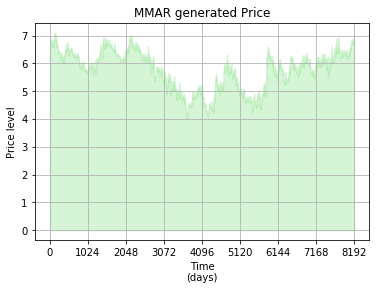

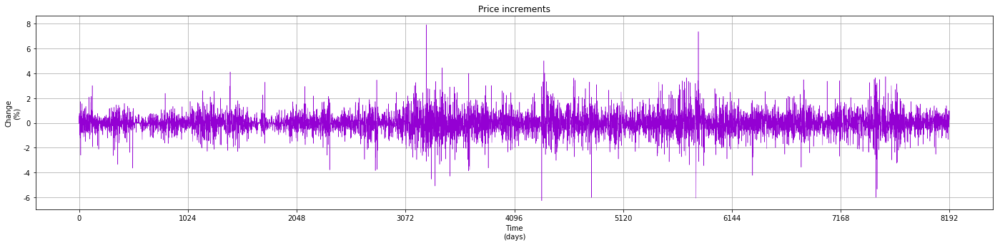

The number of price increments that equal zero is: 277


In [ ]:
wonderfullife = MMAR(13, H_NORWAY, lambda_NORWAY, sigma_NORWAY, df.Price_NORWAY, 0.15, True)

Performing an MMAR simulation with parameters:

H = 0.43235420116535195
lambda = 1.118009759565887
sigma = 0.3405041898044085
fBm magnitude = 0.15



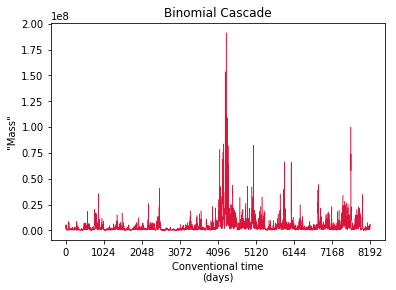

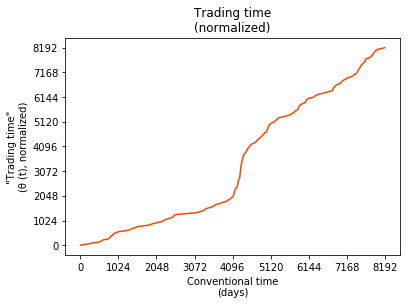

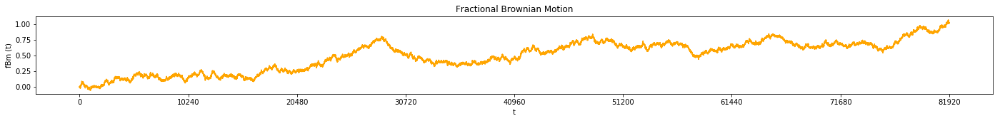

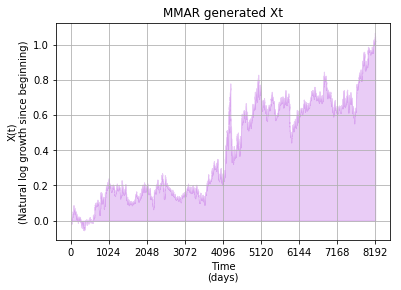

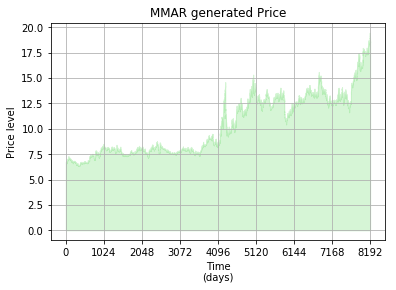

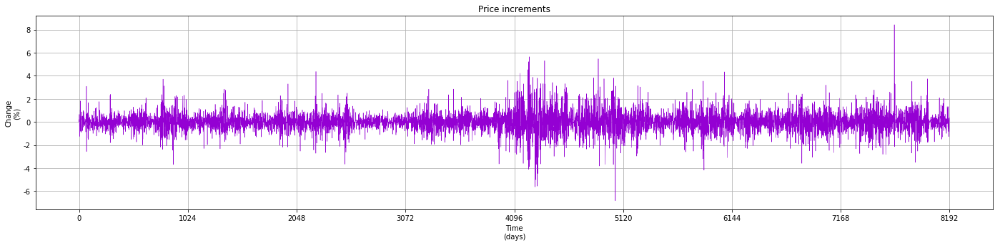

The number of price increments that equal zero is: 324


In [ ]:
new_wonderfullife = MMAR(13, H_NORWAY, lambda_NORWAY, sigma_NORWAY, df.Price_NORWAY, 0.15, True)

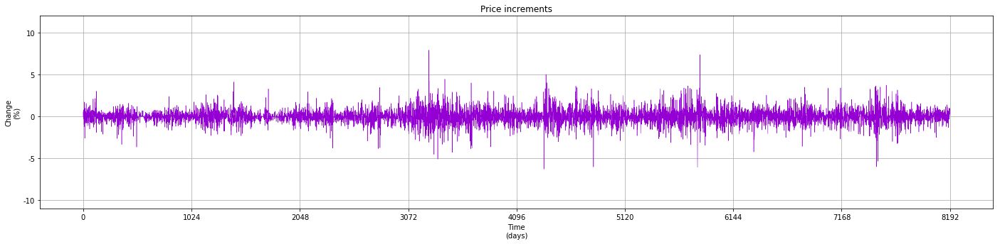

In [ ]:
plt.figure(figsize=(24,5))
plt.title("Price increments")
plt.xticks(np.arange(0, 2**(13)+1, 2**(13-3)))
axes = plt.gca()
axes.set_ylim([-0.11,0.12])
plt.xlabel("Time\n(days)")
plt.grid(b=True)
plt.ylabel('Change\n(%)')
plt.plot(np.diff(wonderfullife), color="darkviolet", linewidth=0.5)
plt.gca().set_yticklabels(['{:.0f}'.format(x*100) for x in plt.gca().get_yticks()]) 
plt.show()

In [ ]:
# A test for creating 10,000 columns or 8,192 rows - i.e. an array with81,920,000 elements
# Apparently, everything works fine! It doesn't even take long :D

# del test_big_array

# test_big_array = [[7.0707 for x in range(0,10000)] for y in range(0,8192)]
# test_big_array = pd.DataFrame(test_big_array)
# test_big_array

In [ ]:
print("We are now ready to attempt to simulate financial markets!")

We are now ready to attempt to simulate financial markets!


In [ ]:
from IPython.display import clear_output

attempt_length = 10000

attempt=pd.DataFrame([0 for x in range(0,2**13)])

start_time = datetime.now().strftime("%I:%M%p")

magnitude_NORWAY = 0.10

for i in range(0,attempt_length):
    print("Having started at "+str(start_time))
    if i%(attempt_length/attempt_length)==0:
        print("Currently at i=" + str(i))
    if i%101==0:
        attempt[i] = pd.DataFrame(MMAR(13, H_NORWAY, lambda_NORWAY, sigma_NORWAY, df.Price_NORWAY, magnitude_NORWAY, False))
    else:
        attempt[i] = pd.DataFrame(MMAR(13, H_NORWAY, lambda_NORWAY, sigma_NORWAY, df.Price_NORWAY, magnitude_NORWAY, False))
    clear_output()

print("Having started at "+str(start_time))
    
attempt

Currently at i=0
Currently at i=500
Currently at i=1000
Currently at i=1500
Currently at i=2000
Currently at i=2500
Currently at i=3000
Currently at i=3500
Currently at i=4000
Currently at i=4500
Currently at i=5000
Currently at i=5500
Currently at i=6000
Currently at i=6500
Currently at i=7000
Currently at i=7500
Currently at i=8000
Currently at i=8500
Currently at i=9000
Currently at i=9500


,0,1,2,3,4,5,6,7,8,9,...,9990,9991,9992,9993,9994,9995,9996,9997,9998,9999
0,-0.004104,-0.006654,0.001525,0.000000,-0.004715,-0.008864,0.006536,-0.005804,-0.016103,-0.003998,...,0.003959,0.004775,-0.004254,0.003441,0.003756,-0.001398,-0.001527,0.000279,0.003527,0.003941
1,-0.022198,-0.025900,0.009532,0.000000,0.008606,-0.003459,0.005158,-0.008877,-0.027041,0.008969,...,-0.002782,0.006613,-0.005506,-0.000278,0.007726,-0.013016,-0.010520,-0.002381,0.014040,0.001534
2,-0.025020,-0.036490,0.008816,0.000000,-0.000942,-0.000004,0.007636,0.003379,-0.016275,0.011586,...,-0.000832,-0.001699,-0.010462,-0.011748,0.015196,-0.011202,-0.015531,-0.010298,0.017012,0.004924
3,-0.023396,-0.045451,0.010044,0.000000,0.012951,-0.006722,0.016394,0.017632,-0.020767,0.008453,...,-0.009705,-0.002461,-0.009354,-0.005419,0.012651,-0.008510,-0.015469,-0.021832,0.022068,0.007025
4,-0.013186,-0.045051,0.001920,0.000000,-0.004496,-0.007221,0.014708,0.024112,-0.026589,0.006008,...,-0.010453,-0.007243,-0.012697,-0.012846,0.010645,-0.001409,-0.017539,-0.045021,0.015881,0.005758
5,-0.003105,-0.032204,-0.009144,0.000000,-0.002871,0.011192,0.011236,0.012127,-0.022196,-0.005009,...,-0.009755,-0.008418,-0.015763,-0.013149,0.012524,-0.001710,-0.017788,-0.037235,0.015315,0.008900
6,0.023251,-0.033903,-0.001213,-0.003696,-0.002260,-0.002293,0.014127,0.018915,-0.027271,-0.001849,...,-0.007028,0.000626,-0.017793,-0.022422,0.017197,-0.006866,-0.021269,-0.039204,0.015398,0.016346
7,0.037643,-0.054027,0.005217,-0.003696,0.010904,-0.006043,0.004754,0.011415,-0.029768,-0.006281,...,-0.015455,0.006143,-0.026331,-0.026984,0.013928,-0.009418,-0.018470,-0.037434,0.022080,0.011488
8,0.047917,-0.044636,0.004150,-0.003696,0.008509,-0.006957,0.006067,-0.014804,-0.023818,0.001450,...,-0.004958,0.012542,-0.002293,-0.031799,0.009309,-0.000930,-0.017941,-0.038147,0.028275,0.012447
9,0.039747,-0.073070,0.007098,-0.004132,0.012334,0.001321,-0.000527,-0.020118,-0.021008,-0.004347,...,-0.010447,0.011426,-0.001950,-0.029395,0.013447,0.001048,-0.015234,-0.036585,0.032838,0.008878


In [ ]:
# attempt.to_csv('Norway_attempt.csv')

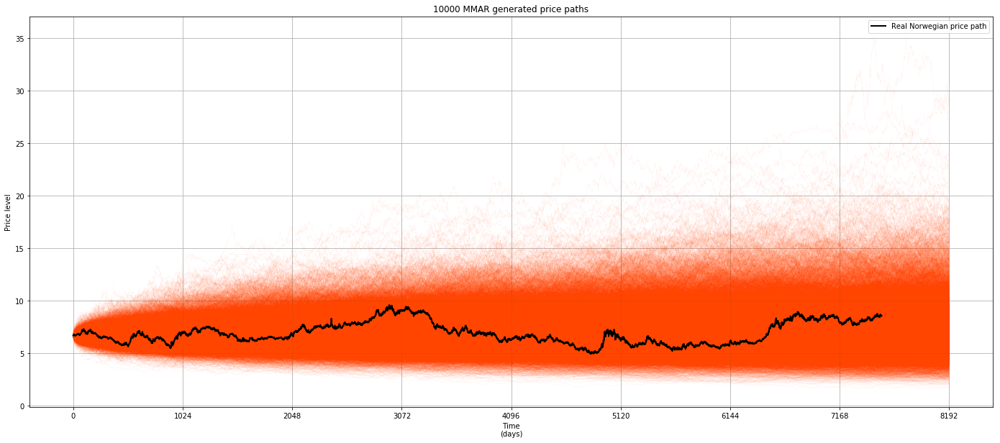

In [ ]:
plt.figure(figsize=(24,10))

plt.plot(df.Price_NORWAY, color="black", linewidth=2, label="Real Norwegian price path")

plt.legend()

for i in range(0,len(attempt.columns)):
    K=13
    plt.title(str(attempt_length) + " MMAR generated price paths")
    plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
    plt.xlabel("Time\n(days)")
    plt.ylabel('Price level')
    plt.grid(b=True)
    plt.plot(np.arange(0, 2**K, 1) , df.Price_NORWAY[0]*np.exp(attempt[i]), color="orangered", linewidth=0.1, alpha=0.2)

plt.plot(df.Price_NORWAY, color="black", linewidth=2)

plt.show()

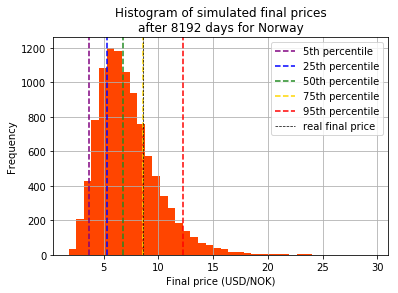

In [ ]:
plt.grid(b=True)
plt.title("Histogram of simulated final prices\nafter 8192 days for Norway")
plt.hist(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191]), bins=40, color="orangered")
plt.xlabel("Final price (USD/NOK)")
plt.ylabel("Frequency")
plt.axvline(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191].quantile(0.05)), linestyle='--', color="purple", label="5th percentile")
plt.axvline(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191].quantile(0.25)), linestyle='--', color="blue", label="25th percentile")
plt.axvline(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191].quantile(0.5)), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191].quantile(0.75)), linestyle='--', color="gold", label="75th percentile")
plt.axvline(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191].quantile(0.95)), linestyle='--', color="red", label="95th percentile")
plt.axvline(df.Price_NORWAY.iloc[-1], linestyle='--', color="black", label="real final price", linewidth=0.7)
plt.legend()
plt.show()

In [ ]:
# Here we calculate the LN differences

diff_attempt = [[0 for x in range(0,attempt_length)] for y in range (0,8192)]
for i in range(0,attempt_length):
    if i(attempt_length/attempt_length) == 0:
        print("i="+str(i))
    for j in range (1,8192):
        diff_attempt[j][i]=attempt[i][j] - attempt[i][j-1]
    clear_output()
    
diff_attempt = pd.DataFrame(diff_attempt)

diff_attempt.to_csv('Norway_diff_attempt.csv')

i=0
i=500
i=1000
i=1500
i=2000
i=2500
i=3000
i=3500
i=4000
i=4500
i=5000
i=5500
i=6000
i=6500
i=7000
i=7500
i=8000
i=8500
i=9000
i=9500


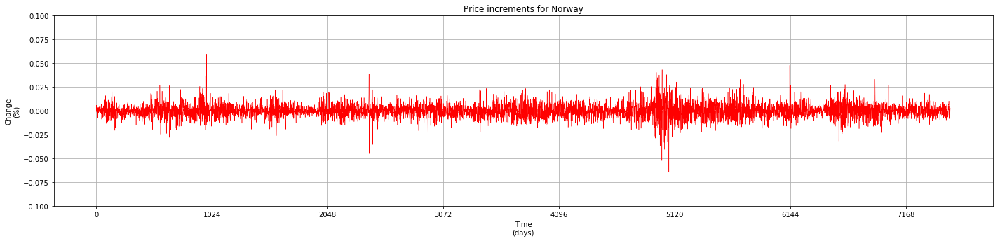

In [ ]:
# Here we show the original graph as a reminder

plt.figure(figsize=(24,5))
plt.title("Price increments for Norway")
plt.xticks(np.arange(0, 2**(13)+1, 2**(13-3)))

plt.xlabel("Time\n(days)")
plt.grid(b=True)
plt.ylabel('Change\n(%)')

axes = plt.gca()
axes.set_ylim([-0.10,0.10])

plt.plot(df.LN_NORWAY, color="red", linewidth=0.5)
plt.show()

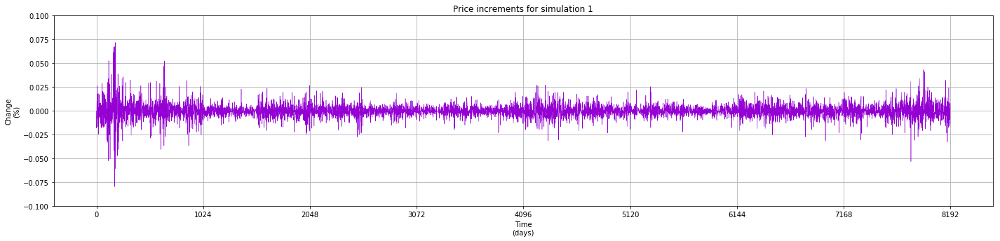

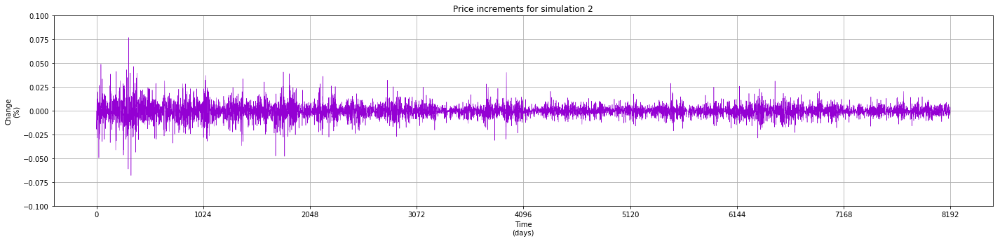

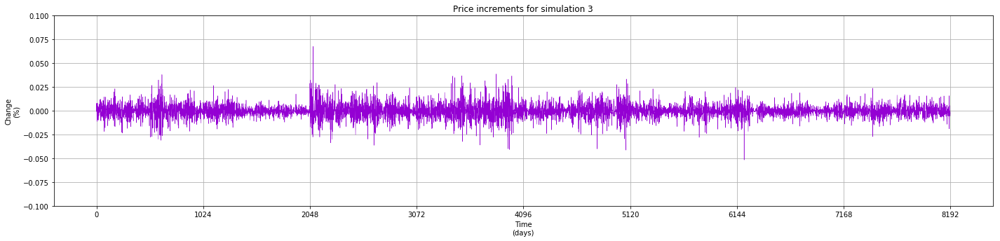

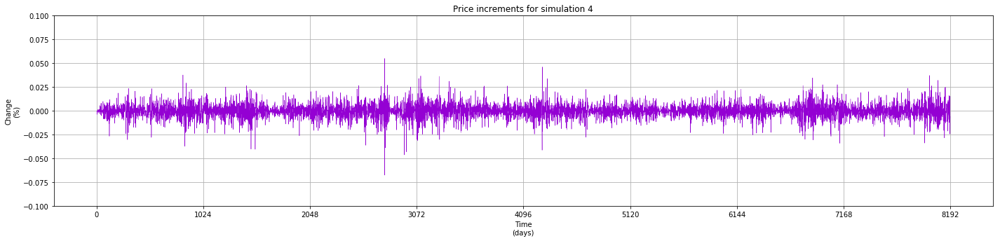

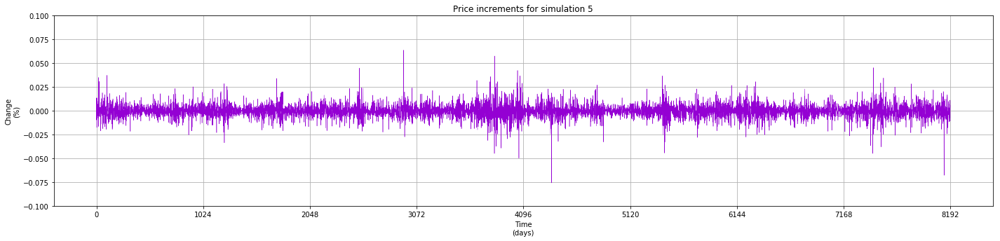

...

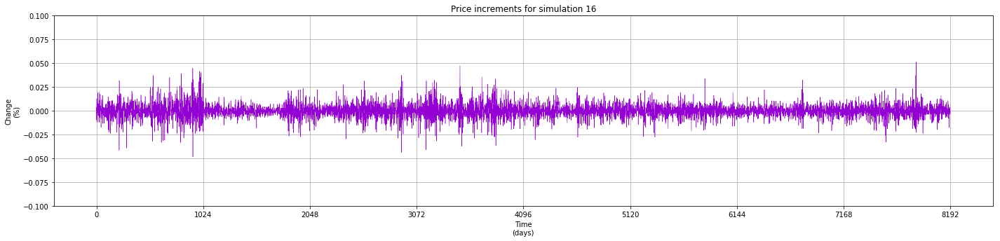

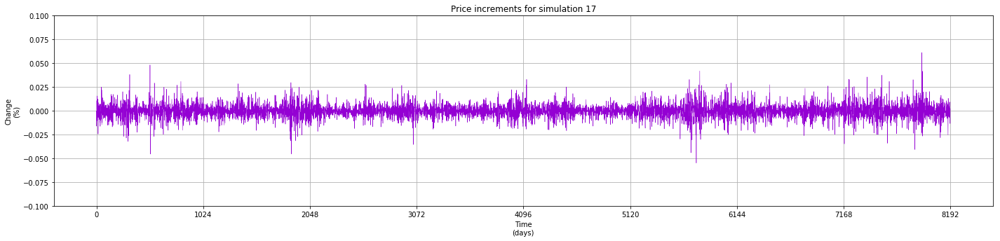

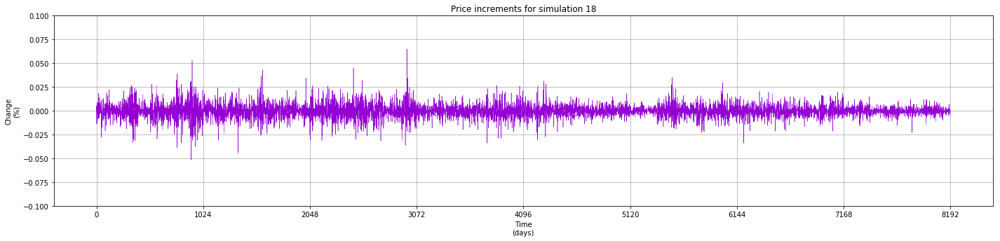

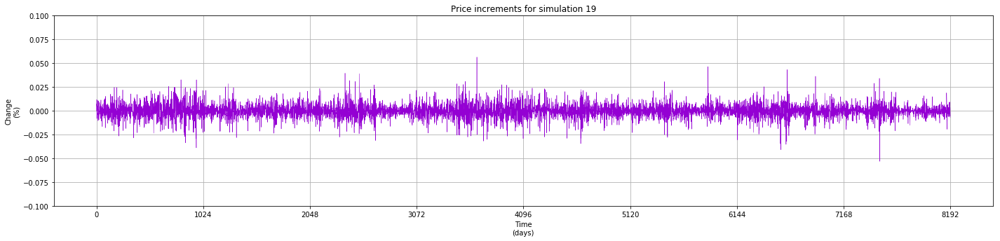

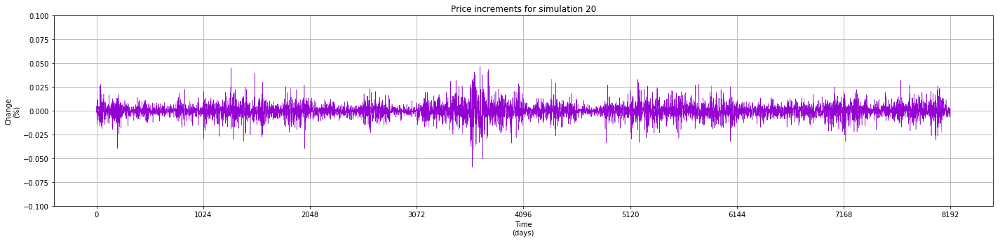

In [ ]:
# Here we show the first twenty graphs of price changes

for i in range(0,20):
    plt.figure(figsize=(24,5))
    plt.title("Price increments for simulation " + str(i+1))
    plt.xticks(np.arange(0, 2**(13)+1, 2**(13-3)))

    plt.xlabel("Time\n(days)")
    plt.grid(b=True)
    plt.ylabel('Change\n(%)')
    
    axes = plt.gca()
    axes.set_ylim([-0.10,0.10])
    
    plt.plot(diff_attempt[i], color="darkviolet", linewidth=0.5)
    plt.show()

In [ ]:
print("Here we can see some statistics about the price changes in the Norwegian exchange rate.\n")

df.LN_NORWAY.describe()

Here we can see some statistics about the price changes in the Norwegian exchange rate.



count    7560.000000
mean        0.000033
std         0.007228
min        -0.064440
25%        -0.004051
50%         0.000000
75%         0.003942
max         0.059688
Name: LN_NORWAY, dtype: float64

In [ ]:
df.LN_NORWAY.std()

0.007228071748173812

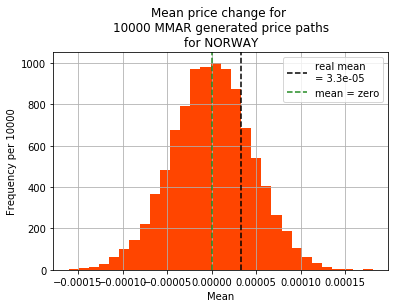

count    1.000000e+04
mean     4.783070e-07
std      4.479205e-05
min     -1.606284e-04
25%     -2.944317e-05
50%      5.766159e-07
75%      3.035007e-05
max      1.811756e-04
dtype: float64


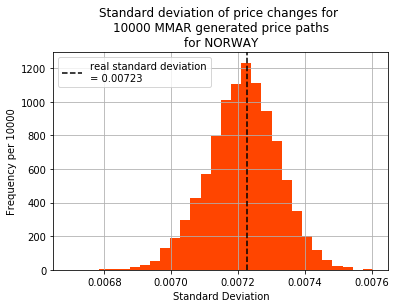



Below is a description of the standard deviations of our 10,000 simulations.



count    10000.000000
mean         0.007215
std          0.000106
min          0.006693
25%          0.007148
50%          0.007218
75%          0.007286
max          0.007604
dtype: float64

In [ ]:
plt.grid(b=True)
plt.title("Mean price change for \n" + str(attempt_length) + " MMAR generated price paths\nfor NORWAY")
plt.hist(diff_attempt.mean(), bins=30, color='orangered')
plt.axvline(df.LN_NORWAY.mean(), linestyle='--', color="black", label="real mean\n= "+str(round(df.LN_NORWAY.mean(), 6)))
plt.axvline(0, linestyle='--', color="forestgreen", label="mean = zero")
plt.ylabel("Frequency per " + str(attempt_length))
plt.xlabel("Mean")
plt.legend()
plt.show()
print((diff_attempt.mean()).describe())

plt.grid(b=True)
plt.title("Standard deviation of price changes for \n" + str(attempt_length) + " MMAR generated price paths\nfor NORWAY")
plt.hist(diff_attempt.std(), bins=30, color='orangered')
plt.axvline(df.LN_NORWAY.std(), linestyle='--', color="black", label="real standard deviation\n= "+str(round(df.LN_NORWAY.std(), 5)))
plt.ylabel("Frequency per " + str(attempt_length))
plt.xlabel("Standard Deviation")
plt.legend()
plt.show()


print("\n\nBelow is a description of the standard deviations of our 10,000 simulations.\n")
(diff_attempt.std()).describe()

In [ ]:
print("The mean is obviously very variable - we can simulate both downward and upward markets.\n\nWe can see that the standard deviation is also quite variable, but it is mostly near to what we expect.")

The mean is obviously very variable - we can simulate both downward and upward markets.

We can see that the standard deviation is also quite variable, but it is mostly near to what we expect.


In [ ]:
print("Here's the kurtosis for the real data for Norway.")

stats.kurtosis(df.LN_NORWAY[1:-1])

Here's the kurtosis for the real data for Norway.


4.279929706945225

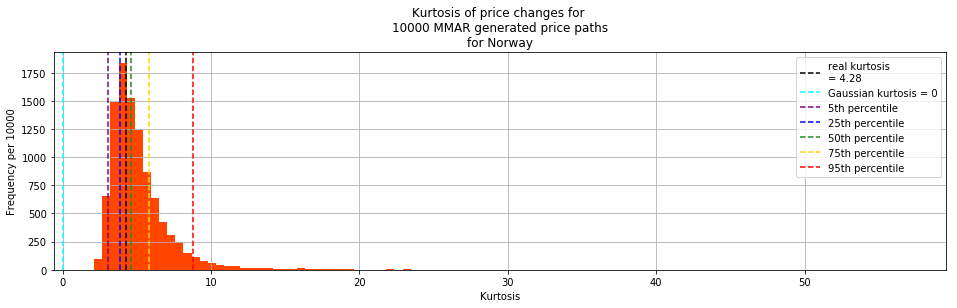

In [ ]:
plt.figure(figsize=(16,4))
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(attempt_length) + " MMAR generated price paths\nfor Norway")
plt.hist(stats.kurtosis(diff_attempt), bins=100, color='orangered')
plt.axvline(stats.kurtosis(df.LN_NORWAY[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_NORWAY[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_diff_attempt = stats.kurtosis(diff_attempt)
plt.axvline(np.quantile(kurtosis_array_diff_attempt, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(attempt_length))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

In [ ]:
print("But at least the kurtosis is about right!")

But at least the kurtosis is about right!


In [ ]:
print("Below is the mean kurtosis of the price changes for every simulation.\nKeep in mind that it is overweighted by the heavy right tail.\n")

stats.kurtosis(diff_attempt).mean()

Below is the mean kurtosis of the price changes for every simulation.
Keep in mind that it is overweighted by the heavy right tail.



5.15394832632845

In [ ]:
print("The median kurtosis is about right. The real kurtosis was "+str(stats.kurtosis(df.LN_NORWAY[1:-1]))+".\n")

np.median(stats.kurtosis(diff_attempt))

The median kurtosis is about right. The real kurtosis was 4.279929706945225.



4.616610555074015

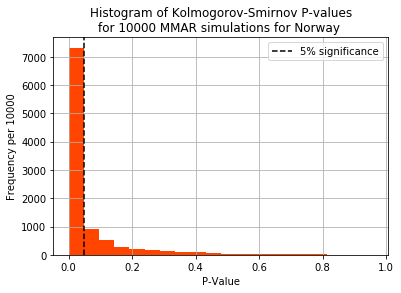

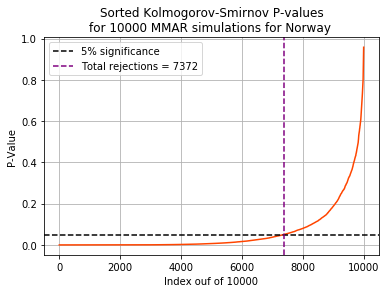

Count of P<0.05 = 7372 failures out of 10000.


In [ ]:
# Here we test how well the simulations fit the original data, using the Kolmogorov-Smirnov test to test the log price changes

ks_test_NORWAY = [0 for x in range(0, attempt_length)]
for i in range(0,attempt_length):
    ks_test_NORWAY[i] = stats.ks_2samp(diff_attempt[i], df.LN_NORWAY).pvalue
    

plt.grid(b=True)
plt.hist(ks_test_NORWAY, bins=20, color='orangered')
plt.title("Histogram of Kolmogorov-Smirnov P-values\nfor " + str(attempt_length) + " MMAR simulations for Norway ")
plt.axvline(0.05, linestyle='--', color="black", label="5% significance")
plt.xlabel("P-Value")
plt.ylabel("Frequency per " + str(attempt_length))
plt.legend()
plt.show()

plt.grid(b=True)
plt.plot(sorted(ks_test_NORWAY), color='orangered')
plt.title("Sorted Kolmogorov-Smirnov P-values\nfor " + str(attempt_length) + " MMAR simulations for Norway ")
plt.axhline(0.05, linestyle='--', color="black", label="5% significance")
plt.axvline(sum(x<0.05 for x in ks_test_NORWAY), linestyle='--', color="purple", label="Total rejections = "+str(sum(x<0.05 for x in ks_test_NORWAY)))
plt.xlabel("Index ouf of " + str(attempt_length))
plt.ylabel("P-Value")
plt.legend()
plt.show()

print("Count of P<0.05 = "+ str(sum(x<0.05 for x in ks_test_NORWAY)) + " failures out of " + str(attempt_length) + ".")

In [ ]:
print("We can see that most simulations fail the Kolmogorov-Smirnov test, which is a shame.\n")
print("That said, the test may be overly sensitive.\n")
print("But unfortunately, the authors don't provide any better way to test if an MMAR simulation fits the real data.")

We can see that most simulations fail the Kolmogorov-Smirnov test, which is a shame.

That said, the test may be overly sensitive.

But unfortunately, the authors don't provide any better way to test if an MMAR simulation fits the real data.


In [ ]:
print("Now we encounter a problem: we see that the mean return for an MMAR simulation is 0.\n")
print("For stocks of rich countries, we don't expect the stock index to go down over 30 years,\nso we can't leave our price increments with an expectation of zero.")
print("\nWe must therefore introduce an upward bias into our price movement simulation.")
print("\nHere, we will multiply our simulated Xt by e to the power of the mean daily return over 30 years")
print("(in our case, the mean daily return was " + str(round(df.LN_SWEDEN.mean(), 6)*100) + "% per day.)  This will bias the price to move upwards.")
print("\nBut we also don't want our prices to move in a way that's too extreme, so we will restrict our prices\nfrom ever exceeding a barrier that's 4x higher than the real price at the end of thirty years.")
print("This is admittedly an arbitray number, but it is comparable to the Nikkei 225 index, \nwhich rose to nearly 40,000 in the 80's and was still only around 10,000 over twenty years later. ")


Now we encounter a problem: we see that the mean return for an MMAR simulation is 0.

For stocks of rich countries, we don't expect the stock index to go down over 30 years,
so we can't leave our price increments with an expectation of zero.

We must therefore introduce an upward bias into our price movement simulation.

Here, we will multiply our simulated Xt by e to the power of the mean daily return over 30 years
(in our case, the mean daily return was 0.0325% per day.)  This will bias the price to move upwards.

But we also don't want our prices to move in a way that's too extreme, so we will restrict our prices
from ever exceeding a barrier that's 4x higher than the real price at the end of thirty years.
This is admittedly an arbitray number, but it is comparable to the Nikkei 225 index, 
which rose to nearly 40,000 in the 80's and was still only around 10,000 over twenty years later. 


In [ ]:
def MMAR_STOCKS(K, simulated_H, simulated_lambda, simulated_sigma, original_price_history, magnitude_parameter, GRAPHS, FBMCLASS, FBM_TOP_LIMIT, FBM_BOTTOM_LIMIT, MEAN_RETURN):

    # --- VARIABLES ---
    # K
        # adjust K depending on how many days you want to simulate (e.g. if K=13, you'll simulate 2^13=8192 days)
    # simulated_H
        # the Hurst parameter for the fBm process
    # simulated_lambda
        # the mean for the lognormal cascade
    # simulated_sigma
        # the variance for the lognormal cascade
    # original_price_history
        # the price history of the market under study (used for starting the prices from the right time!)
    # magnitude_parameter
        # adjust this up or down to change the range of price changes (e.g. if prices are swinging too wildly every day, then adjust this downwards)
    # GRAPHS
        # Boolean - either True or False - use True if you want the MMAR to simulate graphs for you
        
    # --- MESSAGE ---
    if GRAPHS == True:
        print("Performing an MMAR simulation with parameters:\n\nH = " + str(simulated_H) + "\nlambda = " + str(simulated_lambda) + "\nsigma = " + str(simulated_sigma) + "\nfBm magnitude = " + str(magnitude_parameter)+ "\n")

    # --- CASCADE ---
    new_cascade = list(np.array(lognormal_cascade(k=K, v=1, ln_lambda = simulated_lambda, ln_theta = simulated_sigma)).flat)
    if GRAPHS == True:
        plt.figure(figsize=(24,2))
        plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.title("Binomial Cascade")
        plt.xlabel("Conventional time\n(days)")
        plt.ylabel('"Mass"')
        plt.plot(new_cascade, color="crimson", linewidth=0.5)
        plt.show()


    # --- TRADING TIME ---
    tradingtime = 2**K*np.cumsum(new_cascade)/sum(new_cascade)
    if GRAPHS == True:
        plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.yticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.title("Trading time\n(normalized)")
        plt.xlabel("Conventional time\n(days)")
        plt.ylabel('"Trading time"\n(\u03B8 (t), normalized)')
        plt.plot(tradingtime, color="orangered")

        
    # --- FBM (Fractional Brownian Motion) ---
        
        # Here we are adding the complicating factor. It is a recursive method to keep simulating fBm's until we get one that gives us a realistic price movement.
    def fbm_attempt(fbmclass, fbm_top_limit, fbm_bottom_limit, mean_return, original_prices):
        # --- FBM (Fractional Brownian Motion) ---
        simulated_fbm = fbmclass.fbm()
        
        xt_top_limit = np.log(fbm_top_limit/original_prices[0])
        xt_bottom_limit = np.log(fbm_bottom_limit/original_prices[0])
        
        # --- MMAR XT's (temporary)---
        TEMPORARY_simulated_xt_array = [simulated_fbm[int(tradingtime[x]*10)]+x*mean_return for x in range(0, len(tradingtime))] # Here, since it's stocks, we also add a multiple of the mean return for every Xt value
        
        if all(XT < xt_top_limit for XT in TEMPORARY_simulated_xt_array) and all(XT > xt_bottom_limit for XT in TEMPORARY_simulated_xt_array):
            return TEMPORARY_simulated_xt_array
            # --- Graphs for FBM ---
            if GRAPHS == True:
                plt.figure(figsize=(24,2))
                plt.xticks(np.arange(0, 10*2**(K)+1, 10*2**(K-3)))
                plt.title("Fractional Brownian Motion")
                plt.xlabel("t")
                plt.ylabel('fBm (t)')
                plt.plot(simulated_fbm, color="orange")
                plt.show()   
        else:
            return fbm_attempt(fbmclass, fbm_top_limit, fbm_bottom_limit, mean_return, original_prices)
        

        
    # --- MMAR XT's ---
    simulated_xt_array = fbm_attempt(FBMCLASS, FBM_TOP_LIMIT, FBM_BOTTOM_LIMIT, MEAN_RETURN, original_price_history)

        
    # --- Graphs for MMAR XT's ---
    if GRAPHS == True:
        plt.title("MMAR generated Xt")
        plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.xlabel("Time\n(days)")
        plt.ylabel('X(t)\n(Natural log growth since beginning)')
        plt.grid(b=True)
        plt.fill_between(np.arange(0, 2**K, 1) , simulated_xt_array, color="darkviolet", alpha=0.2)
        plt.show()


    # --- PRICES ---
    if GRAPHS == True:
        plt.title("MMAR generated Price")
        plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.xlabel("Time\n(days)")
        plt.ylabel('Price level')
        plt.grid(b=True)
        plt.fill_between(np.arange(0, 2**K, 1) , original_price_history[0]*np.exp(simulated_xt_array), color="limegreen", alpha=0.2)
        plt.show()

        
    # --- LN CHANGES ---
    if GRAPHS == True:
        ln_simulated_xt_array = [0 for x in range(0, len(simulated_xt_array)-1)]

        for i in range(1,len(simulated_xt_array)):
            ln_simulated_xt_array[i-1] = np.log((original_price_history[0]*np.exp(simulated_xt_array[i]))/(original_price_history[0]*np.exp(simulated_xt_array[i-1])))
            
        plt.figure(figsize=(24,5))
        plt.title("Price increments")
        plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
        plt.xlabel("Time\n(days)")
        plt.ylabel('Change\n(%)')
        plt.grid(b=True)
        plt.plot(ln_simulated_xt_array, color="darkviolet", linewidth=0.5)
        plt.gca().set_yticklabels(['{:.0f}'.format(x*100) for x in plt.gca().get_yticks()]) 
        plt.show()
        print("The number of price increments that equal zero is: " + str(list(np.abs(ln_simulated_xt_array)).count(0)))
    
    # --- END ---
    return simulated_xt_array

In [ ]:
from IPython.display import clear_output

attempt2_length = 10000

attempt2=pd.DataFrame([0 for x in range(0,2**13)])

magnitude_SWEDEN = 3.24

FBM_class_SWEDEN = FBM(n = 10*2**13+1, hurst = H_SWEDEN, length = magnitude_SWEDEN, method='daviesharte')

start_time = datetime.now().strftime("%I:%M%p")

for i in range(0,attempt2_length):
    print("Having started at "+str(start_time))
    if i%(attempt2_length/attempt2_length)==0:
        print("Currently at i=" + str(i) + " out of " + str(attempt2_length))
    if i%101==0:
        attempt2[i] = pd.DataFrame(MMAR_STOCKS(13, H_SWEDEN, lambda_SWEDEN, sigma_SWEDEN, df.Price_SWEDEN, magnitude_SWEDEN, GRAPHS=False, FBMCLASS=FBM_class_SWEDEN, FBM_TOP_LIMIT=5000, FBM_BOTTOM_LIMIT=100, MEAN_RETURN=df.LN_SWEDEN.mean()))
    else:
        attempt2[i] = pd.DataFrame(MMAR_STOCKS(13, H_SWEDEN, lambda_SWEDEN, sigma_SWEDEN, df.Price_SWEDEN, magnitude_SWEDEN, GRAPHS=False, FBMCLASS=FBM_class_SWEDEN, FBM_TOP_LIMIT=5000, FBM_BOTTOM_LIMIT=100, MEAN_RETURN=df.LN_SWEDEN.mean()))
    clear_output()

print("Having started at "+str(start_time))    

attempt2

Having started at 12:18AM


,0,1,2,3,4,5,6,7,8,9,...,9990,9991,9992,9993,9994,9995,9996,9997,9998,9999
0,-0.000114,-0.010153,0.003611,0.001478,0.011841,-0.005647,-0.000759,-0.003813,-0.004202,0.001683,...,-0.007713,-0.003467,0.003005,0.003985,-0.003611,0.025521,0.005750,-0.014332,0.000000,0.009590
1,-0.006433,-0.021725,-0.004825,-0.001211,0.042306,0.000416,-0.001253,-0.005082,-0.004139,-0.026172,...,0.004267,0.000183,0.007322,-0.013315,-0.002035,0.077039,-0.001172,-0.006648,-0.002434,0.031067
2,-0.005867,-0.061715,0.012571,-0.004235,0.039881,0.010986,0.012344,-0.020796,-0.007927,0.015522,...,0.014386,0.004856,0.002355,-0.018269,-0.001256,0.075331,0.004830,-0.000117,-0.000693,0.036581
3,0.006629,-0.064578,0.015985,-0.011700,0.030554,0.027397,0.012463,0.029331,-0.014908,0.010012,...,0.014677,-0.004465,0.010697,-0.016811,-0.002516,0.083669,0.023073,0.019088,0.000768,0.019659
4,0.007299,-0.072208,0.040801,-0.014336,0.041244,0.029613,0.005077,0.024217,-0.025806,-0.024877,...,0.015258,0.013071,-0.003955,-0.011071,-0.003931,0.107055,0.024820,0.005737,0.006641,0.031951
5,0.013131,-0.086297,0.043331,-0.022132,0.057341,0.040690,0.002386,0.024073,-0.035087,0.027438,...,0.019596,0.022616,0.002423,-0.018878,0.008880,0.145018,0.023769,-0.004472,0.003932,0.045130
6,-0.010529,-0.107857,0.045957,-0.034163,0.056488,0.052777,0.003704,0.029102,-0.021285,-0.021492,...,0.016133,0.027634,0.009732,-0.013354,0.006537,0.171146,0.023908,0.004586,0.004562,0.039547
7,-0.020800,-0.090267,0.019827,-0.027238,0.059914,0.067842,0.003236,0.030168,-0.011211,-0.017712,...,0.018002,0.025476,0.016758,-0.019448,0.008160,0.202189,0.016016,-0.007714,0.010556,0.022348
8,-0.015481,-0.089378,0.015915,-0.034872,0.082771,0.063484,0.002057,0.035751,-0.020315,0.029913,...,0.021053,0.028696,0.005578,-0.028867,-0.001949,0.220458,0.028275,0.009699,0.009985,0.000718
9,-0.014246,-0.095031,0.012379,-0.025076,0.087614,0.058759,0.001975,0.038873,-0.039111,0.003446,...,0.021378,0.026333,-0.000875,-0.025029,-0.007440,0.230813,0.021282,-0.008361,0.002160,0.006682


In [ ]:
attempt2.to_csv('Sweden_attempt.csv')

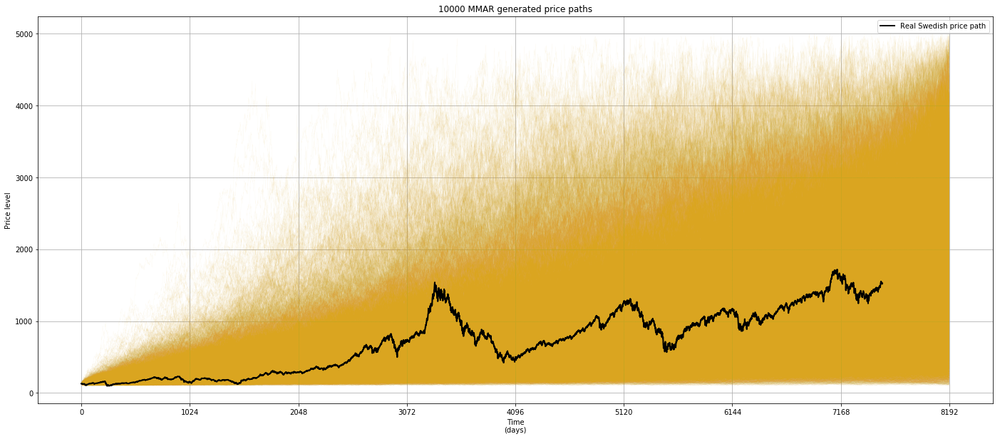

In [ ]:
plt.figure(figsize=(24,10))

plt.plot(df.Price_SWEDEN, color="black", linewidth=2, label="Real Swedish price path")

plt.legend()

for i in range(0,len(attempt2.columns)):
    K=13
    plt.title(str(attempt2_length) + " MMAR generated price paths")
    plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
    plt.xlabel("Time\n(days)")
    plt.ylabel('Price level')
    plt.grid(b=True)
    plt.plot(np.arange(0, 2**K, 1) , df.Price_SWEDEN[0]*np.exp(attempt2[i]), color="goldenrod", linewidth=0.1, alpha=0.2)
    
plt.plot(df.Price_SWEDEN, color="black", linewidth=2)
    
plt.show()

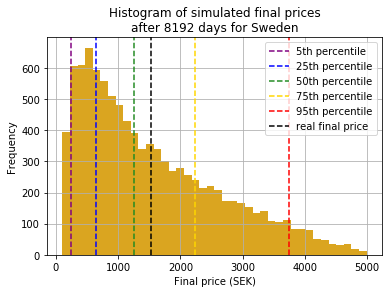

In [ ]:
plt.grid(b=True)
plt.title("Histogram of simulated final prices\nafter 8192 days for Sweden")
plt.hist(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191]), bins=40, color="goldenrod")
plt.xlabel("Final price (SEK)")
plt.ylabel("Frequency")
plt.axvline(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191].quantile(0.05)), linestyle='--', color="purple", label="5th percentile")
plt.axvline(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191].quantile(0.25)), linestyle='--', color="blue", label="25th percentile")
plt.axvline(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191].quantile(0.5)), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191].quantile(0.75)), linestyle='--', color="gold", label="75th percentile")
plt.axvline(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191].quantile(0.95)), linestyle='--', color="red", label="95th percentile")
plt.axvline(df.Price_SWEDEN.iloc[-1], linestyle='--', color="black", label="real final price")

plt.legend()
plt.show()

In [ ]:
# Here we calculate the LN differences

diff_attempt2 = [[0 for x in range(0,attempt2_length)] for y in range (0,8192)]
for i in range(0,attempt2_length):
    
    if i%(attempt2_length/attempt2_length) == 0:
        print("i="+str(i))
    for j in range (1,8192):
        diff_attempt2[j][i]=attempt2[i][j] - attempt2[i][j-1]
    clear_output()
    
diff_attempt2= pd.DataFrame(diff_attempt2)

diff_attempt2.to_csv('Sweden_diff_attempt.csv')

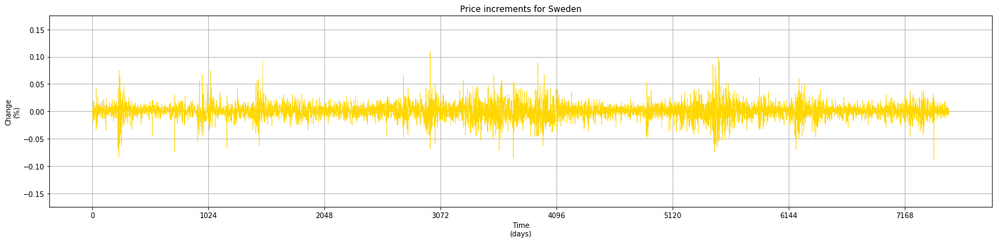

In [ ]:
# Here we show the original graph as a reminder

plt.figure(figsize=(24,5))
plt.title("Price increments for Sweden")
plt.xticks(np.arange(0, 2**(13)+1, 2**(13-3)))

plt.xlabel("Time\n(days)")
plt.grid(b=True)
plt.ylabel('Change\n(%)')

axes = plt.gca()
axes.set_ylim([-0.175,0.175])

plt.plot(df.LN_SWEDEN, color="gold", linewidth=0.5)
plt.show()

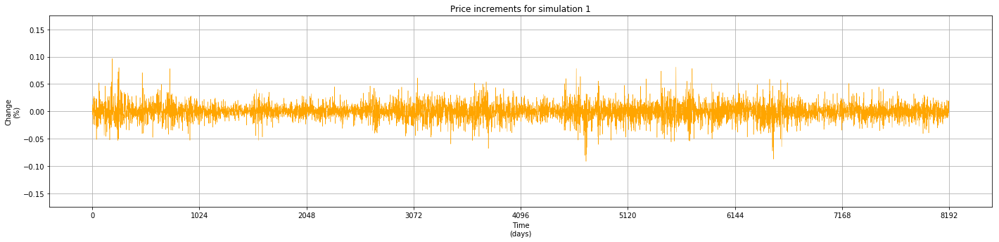

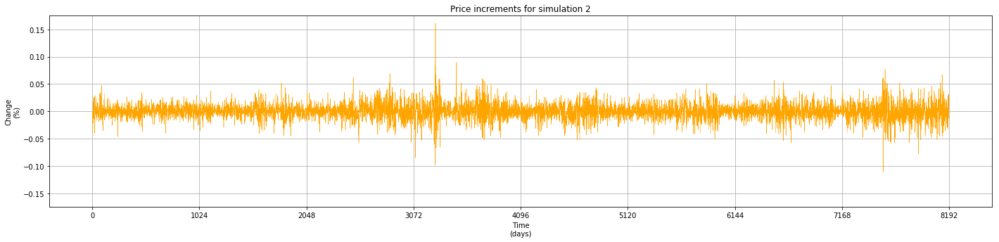

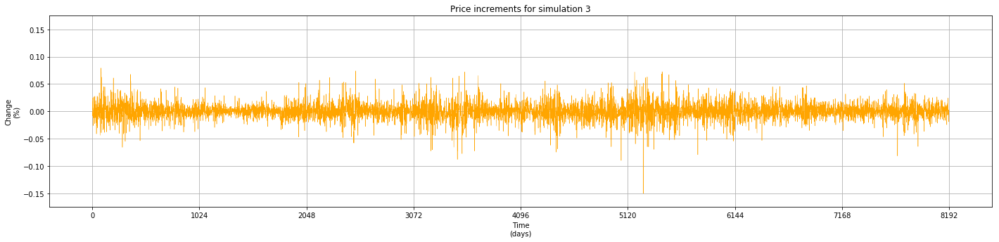

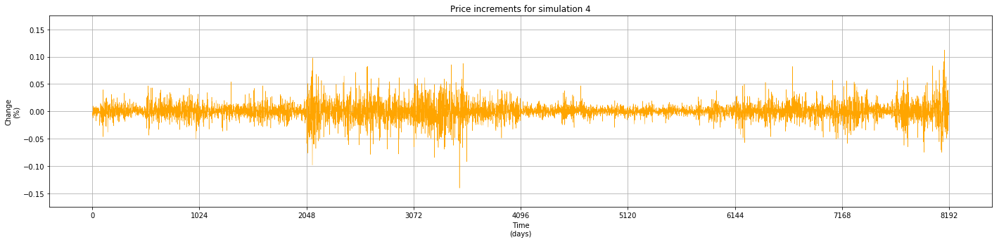

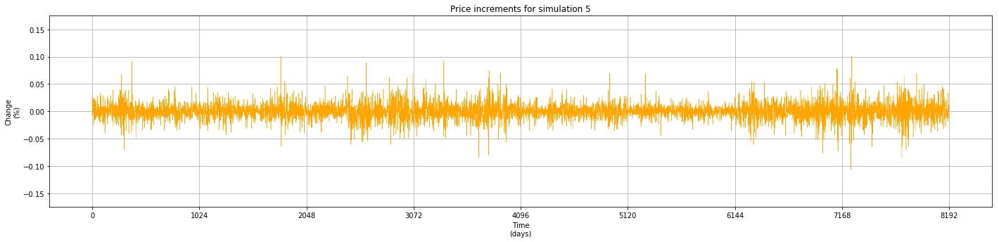

...

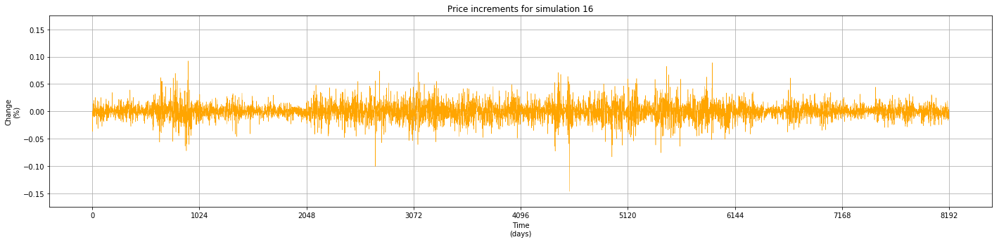

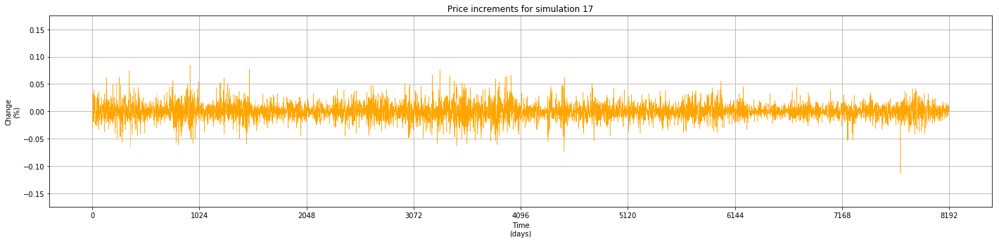

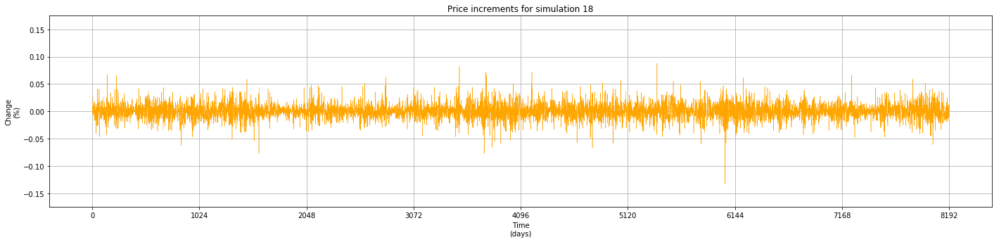

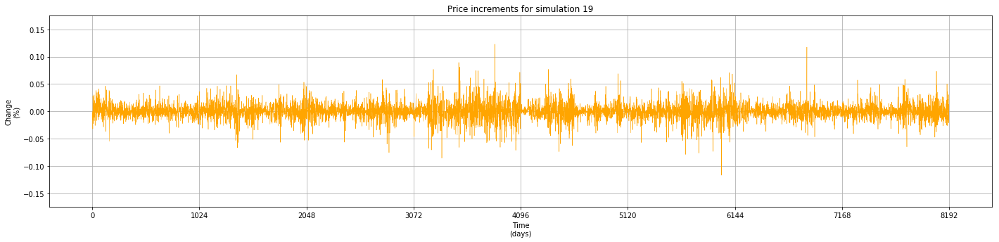

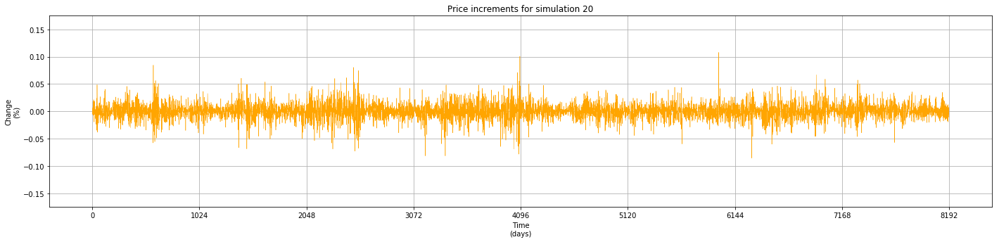

In [ ]:
# Here we show the first twenty graphs of price changes

for i in range(0,20):
    plt.figure(figsize=(24,5))
    plt.title("Price increments for simulation " + str(i+1))
    plt.xticks(np.arange(0, 2**(13)+1, 2**(13-3)))

    plt.xlabel("Time\n(days)")
    plt.grid(b=True)
    plt.ylabel('Change\n(%)')
    
    axes = plt.gca()
    axes.set_ylim([-0.175,0.175])
    
    plt.plot(diff_attempt2[i], color="orange", linewidth=0.5)
    plt.show()

In [ ]:
print("Here we can see some statistics about the price changes in the Swedish stock market.\n")

df.LN_SWEDEN.describe()

Here we can see some statistics about the price changes in the Swedish stock market.



count    7560.000000
mean        0.000325
std         0.014584
min        -0.088003
25%        -0.007073
50%         0.000705
75%         0.007922
max         0.110216
Name: LN_SWEDEN, dtype: float64

In [ ]:
df.LN_SWEDEN.std()

0.014583857213811736

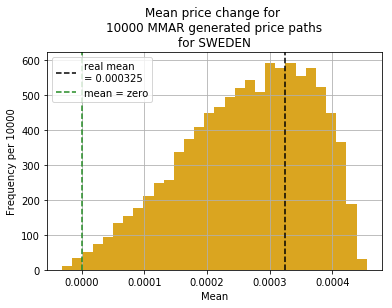

count    10000.000000
mean         0.000264
std          0.000102
min         -0.000031
25%          0.000193
50%          0.000275
75%          0.000347
max          0.000455
dtype: float64


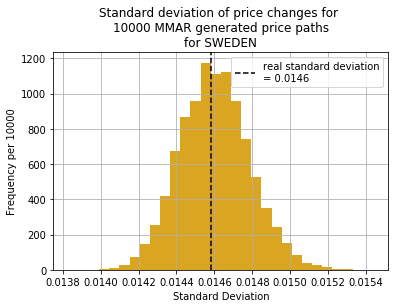



Below is a description of the standard deviations of our 10000 simulations.



count    10000.000000
mean         0.014604
std          0.000185
min          0.013831
25%          0.014475
50%          0.014601
75%          0.014723
max          0.015437
dtype: float64

In [ ]:
plt.grid(b=True)
plt.title("Mean price change for \n" + str(attempt2_length) + " MMAR generated price paths\nfor SWEDEN")
plt.hist(diff_attempt2.mean(), bins=30, color='goldenrod')
plt.axvline(df.LN_SWEDEN.mean(), linestyle='--', color="black", label="real mean\n= "+str(round(df.LN_SWEDEN.mean(), 6)))
plt.axvline(0, linestyle='--', color="forestgreen", label="mean = zero")
plt.ylabel("Frequency per " + str(attempt2_length))
plt.xlabel("Mean")
plt.legend()
plt.show()
print((diff_attempt2.mean()).describe())

plt.grid(b=True)
plt.title("Standard deviation of price changes for \n" + str(attempt2_length) + " MMAR generated price paths\nfor SWEDEN")
plt.hist(diff_attempt2.std(), bins=30, color='goldenrod')
plt.axvline(df.LN_SWEDEN.std(), linestyle='--', color="black", label="real standard deviation\n= "+str(round(df.LN_SWEDEN.std(), 4)))
plt.ylabel("Frequency per " + str(attempt2_length))
plt.xlabel("Standard Deviation")
plt.legend()
plt.show()


print("\n\nBelow is a description of the standard deviations of our " + str(attempt2_length) + " simulations.\n")
(diff_attempt2.std()).describe()

In [ ]:
print("The mean is obviously very variable - we can simulate both downward and upward markets.\n\nWe can see that the standard deviation is also quite variable, but it is mostly near to what we expect.")

The mean is obviously very variable - we can simulate both downward and upward markets.

We can see that the standard deviation is also quite variable, but it is mostly near to what we expect.


In [ ]:
print("Here's the kurtosis for the real data for Sweden.")

stats.kurtosis(df.LN_SWEDEN[1:-1])

Here's the kurtosis for the real data for Sweden.


4.362479840016163

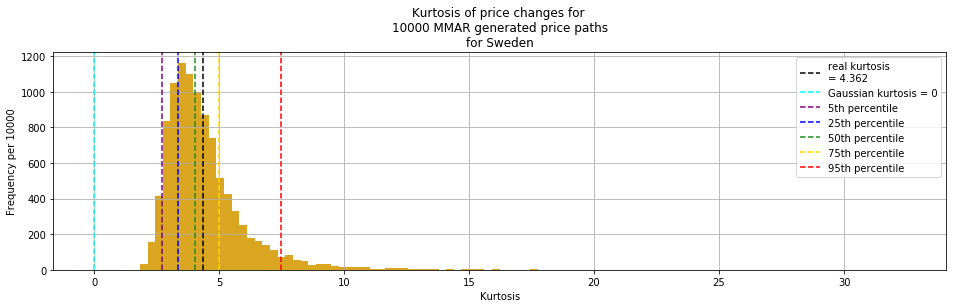

In [ ]:
plt.figure(figsize=(16,4))
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(attempt2_length) + " MMAR generated price paths\nfor Sweden")
plt.hist(stats.kurtosis(diff_attempt2), bins=100, color='goldenrod')
plt.axvline(stats.kurtosis(df.LN_SWEDEN[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_SWEDEN[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_diff_attempt2 = stats.kurtosis(diff_attempt2)
plt.axvline(np.quantile(kurtosis_array_diff_attempt2, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt2,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt2,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt2,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt2,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(attempt2_length))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

In [ ]:
print("But at least the kurtosis is about right!")

But at least the kurtosis is about right!


In [ ]:
print("Below is the mean kurtosis of the price changes for every simulation.\nKeep in mind that it is overweighted by the heavy right tail.\n")

stats.kurtosis(diff_attempt2).mean()

Below is the mean kurtosis of the price changes for every simulation.
Keep in mind that it is overweighted by the heavy right tail.



4.434461371314952

In [ ]:
print("The median kurtosis is a little less than the real, which was "+str(stats.kurtosis(df.LN_SWEDEN[1:-1]))+".\n")

np.median(stats.kurtosis(diff_attempt2))

The median kurtosis is a little less than the real, which was 4.362479840016163.



4.053667250500096

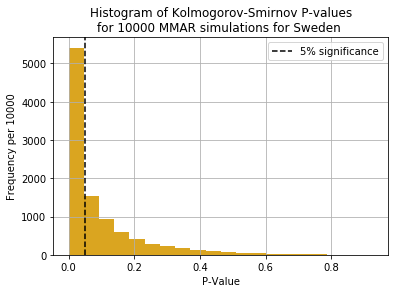

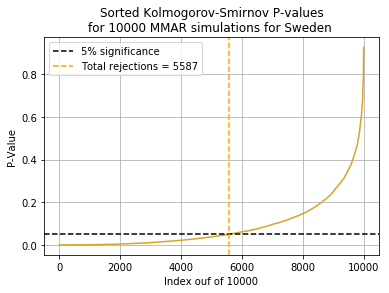

Count of P<0.05 = 5587 failures out of 10000.


In [ ]:
# Here we test how well the simulations fit the original data, using the Kolmogorov-Smirnov test to test the log price changes

ks_test_SWEDEN = [0 for x in range(0, attempt2_length)]
for i in range(0,attempt2_length):
    ks_test_SWEDEN[i] = stats.ks_2samp(diff_attempt2[i], df.LN_SWEDEN).pvalue
    

plt.grid(b=True)
plt.hist(ks_test_SWEDEN, bins=20, color='goldenrod')
plt.title("Histogram of Kolmogorov-Smirnov P-values\nfor " + str(attempt2_length) + " MMAR simulations for Sweden ")
plt.axvline(0.05, linestyle='--', color="black", label="5% significance")
plt.xlabel("P-Value")
plt.ylabel("Frequency per " + str(attempt2_length))
plt.legend()
plt.show()

plt.grid(b=True)
plt.plot(sorted(ks_test_SWEDEN), color='goldenrod')
plt.title("Sorted Kolmogorov-Smirnov P-values\nfor " + str(attempt2_length) + " MMAR simulations for Sweden ")
plt.axhline(0.05, linestyle='--', color="black", label="5% significance")
plt.axvline(sum(x<0.05 for x in ks_test_SWEDEN), linestyle='--', color="orange", label="Total rejections = "+str(sum(x<0.05 for x in ks_test_SWEDEN)))
plt.xlabel("Index ouf of " + str(attempt2_length))
plt.ylabel("P-Value")
plt.legend()
plt.show()

print("Count of P<0.05 = "+ str(sum(x<0.05 for x in ks_test_SWEDEN)) + " failures out of " + str(attempt2_length) + ".")

In [ ]:
print("We can see that most simulations fail the Kolmogorov-Smirnov test, which is a shame.\n")
print("That said, the test may be overly sensitive.\n")
print("But unfortunately, the authors don't provide any better way to test if an MMAR simulation fits the real data.")

We can see that most simulations fail the Kolmogorov-Smirnov test, which is a shame.

That said, the test may be overly sensitive.

But unfortunately, the authors don't provide any better way to test if an MMAR simulation fits the real data.


In [ ]:
print("In the same way that we expect stocks to go downwards, we may expect lending rates to move in a certain direction.")
print("\nHere, we reuse our modified MMAR for stocks to simulate bond yields going down over thirty years.")
print("In the same way as for stocks, we can modify our Xt's by adding the mean change from the real yield changes over thirty years.")

In the same way that we expect stocks to go downwards, we may expect lending rates to move in a certain direction.

Here, we reuse our modified MMAR for stocks to simulate bond yields going down over thirty years.
In the same way as for stocks, we can modify our Xt's by adding the mean change from the real yield changes over thirty years.


In [ ]:
from IPython.display import clear_output

attempt3_length = 10000

attempt3=pd.DataFrame([0 for x in range(0,2**13)])

magnitude_LIBOR = 4

FBM_class_LIBOR = FBM(n = 10*2**13+1, hurst = H_LIBOR, length = magnitude_LIBOR, method='daviesharte')

start_time = datetime.now().strftime("%I:%M%p")

for i in range(0,attempt3_length):
    print("Having started at "+str(start_time))
    if i%(attempt3_length/attempt3_length)==0:
        print("Currently at i=" + str(i) + " out of " + str(attempt3_length))
    if i%101==0:
        attempt3[i] = pd.DataFrame(MMAR_STOCKS(13, H_LIBOR, lambda_LIBOR, sigma_LIBOR, df.Price_LIBOR, magnitude_LIBOR, GRAPHS=False, FBMCLASS=FBM_class_LIBOR, FBM_TOP_LIMIT=20, FBM_BOTTOM_LIMIT=0.1, MEAN_RETURN=df.LN_LIBOR.mean()))
    else:
        attempt3[i] = pd.DataFrame(MMAR_STOCKS(13, H_LIBOR, lambda_LIBOR, sigma_LIBOR, df.Price_LIBOR, magnitude_LIBOR, GRAPHS=False, FBMCLASS=FBM_class_LIBOR, FBM_TOP_LIMIT=20, FBM_BOTTOM_LIMIT=0.1, MEAN_RETURN=df.LN_LIBOR.mean()))
    clear_output()

print("Having started at "+str(start_time))    

attempt3

Having started at 06:35PM


,0,1,2,3,4,5,6,7,8,9,...,9990,9991,9992,9993,9994,9995,9996,9997,9998,9999
0,-0.006085,0.000198,0.017357,0.001478,-0.002785,0.000360,0.005255,0.007278,-0.011759,-0.005731,...,-0.001646,0.003740,-0.002696,0.002113,0.003772,0.005266,-0.001307,0.001294,0.013085,0.016313
1,-0.002982,-0.000142,0.017528,-0.001177,-0.005290,0.002091,0.010725,0.002889,0.002684,-0.009315,...,-0.004020,0.006519,-0.005387,0.001990,0.009146,0.003628,0.004121,0.003907,0.023379,0.019145
2,-0.008014,-0.001295,0.013652,0.005270,-0.007156,-0.000314,0.025287,-0.038624,-0.017861,-0.002336,...,-0.009327,0.013212,-0.004621,0.005357,0.008749,0.003046,0.003245,0.003585,0.029982,0.024835
3,-0.038169,-0.004733,0.018479,0.003118,-0.009217,-0.002852,0.026084,-0.033595,-0.025102,0.007250,...,-0.013536,0.013169,-0.007317,0.008292,0.016158,0.004490,0.001510,0.006512,0.031848,0.047945
4,-0.033958,-0.008491,0.011054,0.007997,-0.008656,-0.013280,0.018455,-0.030605,-0.032139,0.006317,...,-0.015315,0.017649,-0.006817,0.012819,0.012077,0.007684,0.009573,0.009570,0.031892,0.052807
5,-0.012915,-0.012069,0.012467,0.025437,-0.012226,-0.006728,0.016727,-0.031441,-0.012569,0.001049,...,-0.021378,0.021866,-0.006902,0.017603,0.015384,0.008636,0.004987,0.006398,0.019711,0.062439
6,-0.024787,-0.015252,0.025659,0.025772,-0.013149,-0.005882,0.013150,-0.028933,-0.025970,-0.006799,...,-0.024208,0.024949,-0.007731,0.025996,0.010614,0.000135,0.002740,0.003816,0.019886,0.070993
7,-0.048935,-0.011893,0.019847,0.027193,-0.012518,-0.007316,0.007749,-0.030123,-0.046800,-0.002244,...,-0.022711,0.028847,-0.008054,0.018746,0.005597,-0.004151,-0.006049,0.001460,0.024899,0.065013
8,-0.050991,-0.009866,0.021681,0.031184,-0.019307,-0.003163,0.004984,-0.025983,-0.052472,0.002679,...,-0.034619,0.033988,-0.012907,0.015889,0.006437,-0.023883,-0.004080,0.003023,0.020087,0.063729
9,-0.060674,-0.008193,0.024982,0.035191,-0.022566,-0.003486,0.005875,-0.025247,-0.058169,0.006950,...,-0.033770,0.030775,-0.015469,0.016945,0.014676,-0.022718,-0.005746,0.002700,0.021592,0.064158


In [ ]:
attempt3.to_csv('LIBOR_attempt.csv')

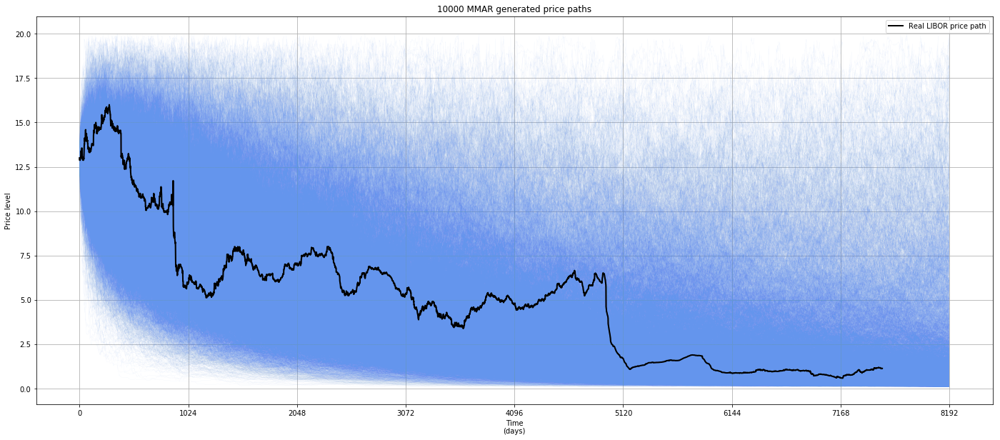

In [ ]:
plt.figure(figsize=(24,10))

plt.plot(df.Price_LIBOR, color="black", linewidth=2, label="Real LIBOR price path")

plt.legend()

for i in range(0,len(attempt3.columns)):
    K=13
    plt.title(str(attempt3_length) + " MMAR generated price paths")
    plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
    plt.xlabel("Time\n(days)")
    plt.ylabel('Price level')
    plt.grid(b=True)
    plt.plot(np.arange(0, 2**K, 1) , df.Price_LIBOR[0]*np.exp(attempt3[i]), color="cornflowerblue", linewidth=0.1, alpha=0.2)
    
plt.plot(df.Price_LIBOR, color="black", linewidth=2)
    
plt.show()

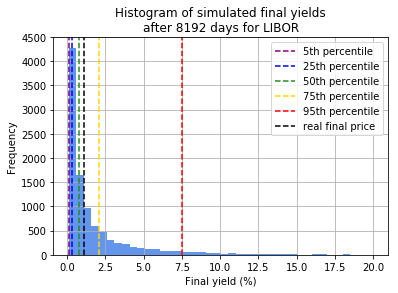

In [ ]:
plt.grid(b=True)
plt.title("Histogram of simulated final yields\nafter 8192 days for LIBOR")
plt.hist(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191]), bins=40, color="cornflowerblue")
plt.xlabel("Final yield (%)")
plt.ylabel("Frequency")
plt.axvline(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191].quantile(0.05)), linestyle='--', color="purple", label="5th percentile")
plt.axvline(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191].quantile(0.25)), linestyle='--', color="blue", label="25th percentile")
plt.axvline(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191].quantile(0.5)), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191].quantile(0.75)), linestyle='--', color="gold", label="75th percentile")
plt.axvline(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191].quantile(0.95)), linestyle='--', color="red", label="95th percentile")
plt.axvline(df.Price_LIBOR.iloc[-1], linestyle='--', color="black", label="real final price")
plt.legend()
plt.show()

In [ ]:
# Here we calculate the LN differences

diff_attempt3 = [[0 for x in range(0,attempt3_length)] for y in range (0,8192)]
for i in range(0,attempt3_length):
    if i%(attempt3_length/attempt3_length) == 0:
        print("i="+str(i))
    for j in range (1,8192):
        diff_attempt3[j][i]=attempt3[i][j] - attempt3[i][j-1]
    clear_output()
    
    
diff_attempt3= pd.DataFrame(diff_attempt3)

diff_attempt3.to_csv('LIBOR_diff_attempt.csv')

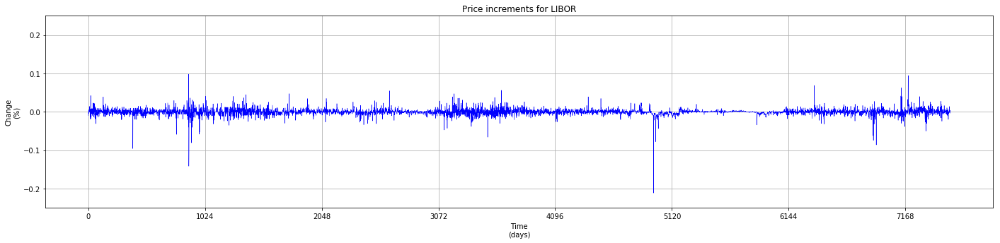

In [ ]:
# Here we show the original graph as a reminder

plt.figure(figsize=(24,5))
plt.title("Price increments for LIBOR")
plt.xticks(np.arange(0, 2**(13)+1, 2**(13-3)))

plt.xlabel("Time\n(days)")
plt.grid(b=True)
plt.ylabel('Change\n(%)')

axes = plt.gca()
axes.set_ylim([-0.25,0.25])

plt.plot(df.LN_LIBOR, color="blue", linewidth=0.5)
plt.show()

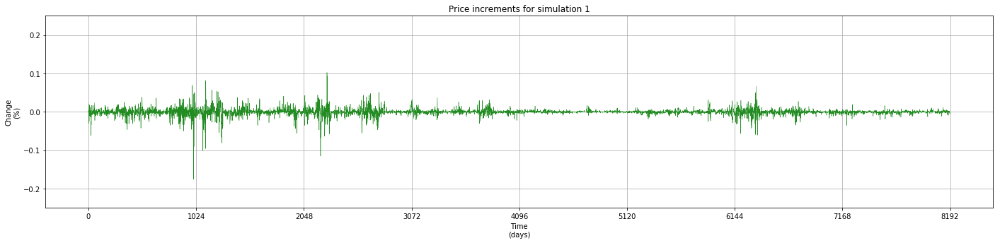

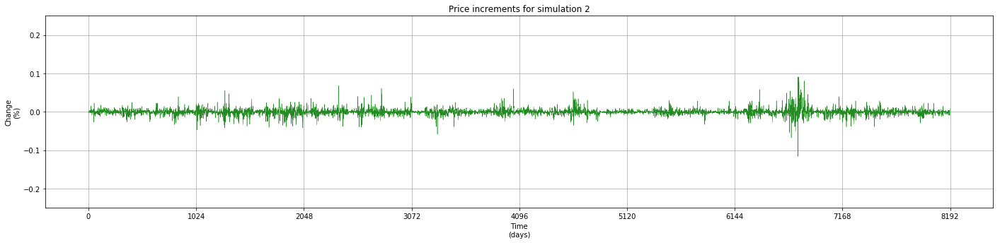

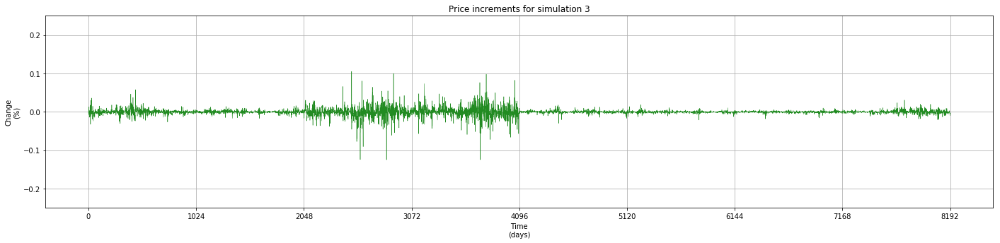

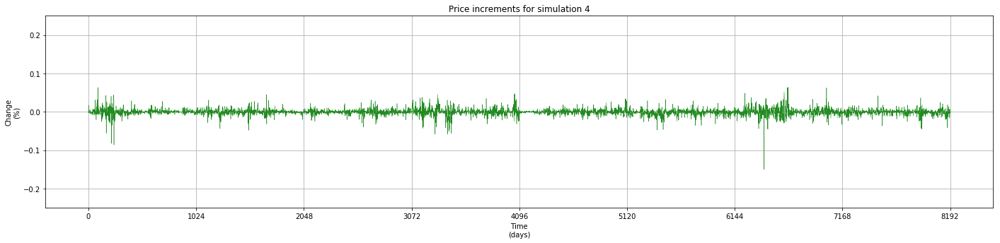

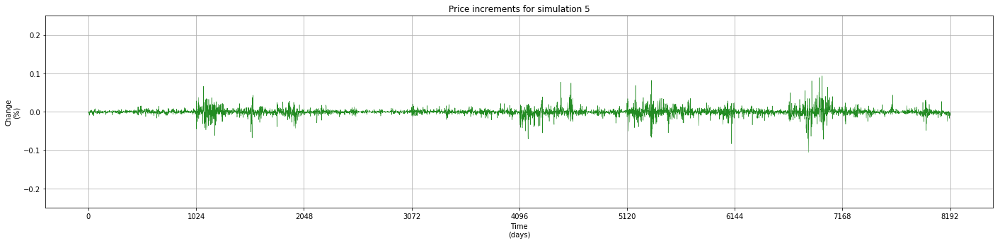

...

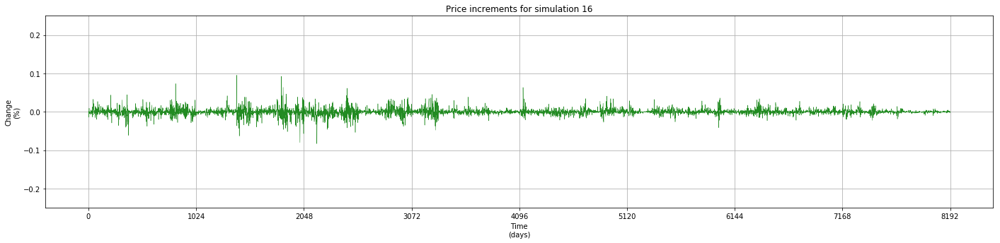

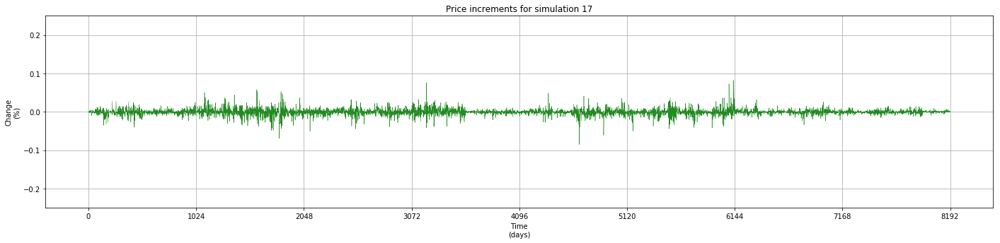

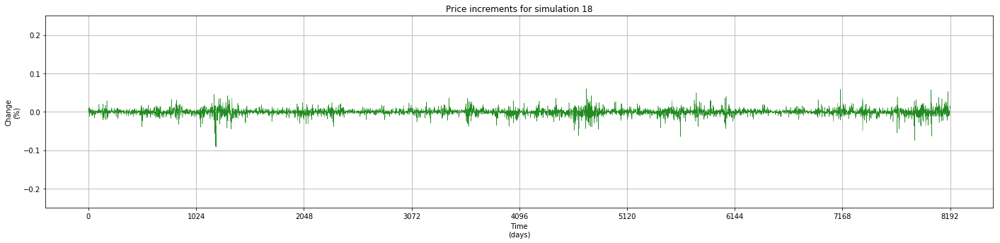

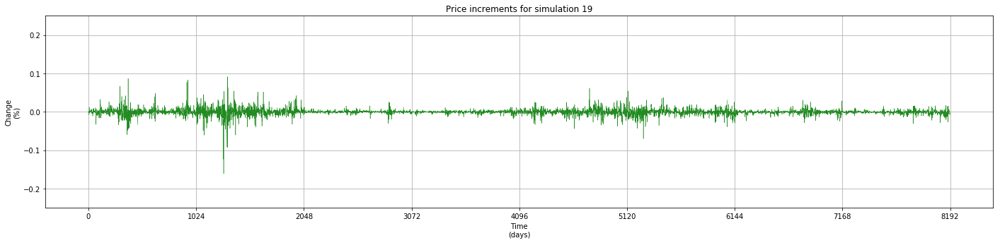

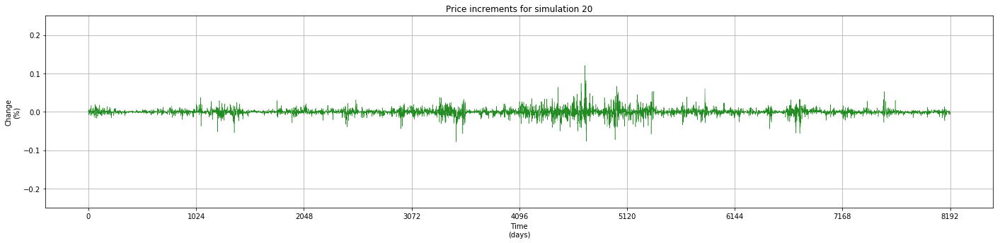

In [ ]:
# Here we show the first twenty graphs of price changes

for i in range(0,20):
    plt.figure(figsize=(24,5))
    plt.title("Price increments for simulation " + str(i+1))
    plt.xticks(np.arange(0, 2**(13)+1, 2**(13-3)))

    plt.xlabel("Time\n(days)")
    plt.grid(b=True)
    plt.ylabel('Change\n(%)')
    
    axes = plt.gca()
    axes.set_ylim([-0.25,0.25])
    
    plt.plot(diff_attempt3[i], color="forestgreen", linewidth=0.5)
    plt.show()

In [ ]:
print("Here we can see some statistics about the price changes in the LIBOR rate in British pounds.\n")

df.LN_LIBOR.describe()

Here we can see some statistics about the price changes in the LIBOR rate in British pounds.



count    7560.000000
mean       -0.000322
std         0.008319
min        -0.211438
25%        -0.002871
50%         0.000000
75%         0.002120
max         0.097980
Name: LN_LIBOR, dtype: float64

In [ ]:
df.LN_LIBOR.std()

0.008318845781112827

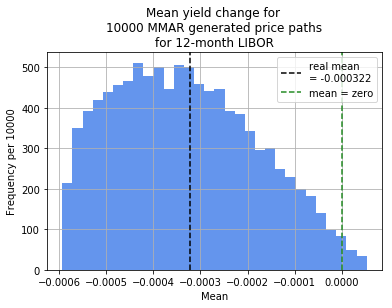

count    10000.000000
mean        -0.000332
std          0.000150
min         -0.000593
25%         -0.000453
50%         -0.000342
75%         -0.000222
max          0.000053
dtype: float64


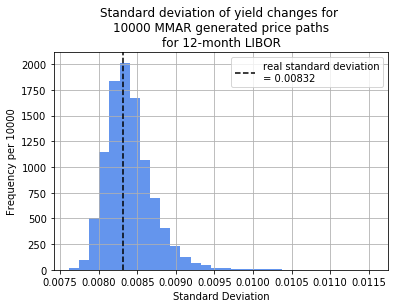



Below is a description of the standard deviations of our 10000 simulations.

count    10000.000000
mean         0.008401
std          0.000306
min          0.007613
25%          0.008198
50%          0.008361
75%          0.008557
max          0.011558
dtype: float64


In [ ]:
plt.grid(b=True)
plt.title("Mean yield change for \n" + str(attempt3_length) + " MMAR generated price paths\nfor 12-month LIBOR")
plt.hist(diff_attempt3.mean(), bins=30, color='cornflowerblue')
plt.axvline(df.LN_LIBOR.mean(), linestyle='--', color="black", label="real mean\n= "+str(round(df.LN_LIBOR.mean(), 6)))
plt.axvline(0, linestyle='--', color="forestgreen", label="mean = zero")
plt.ylabel("Frequency per " + str(attempt3_length))
plt.xlabel("Mean")
plt.legend()
plt.show()
print((diff_attempt3.mean()).describe())

plt.grid(b=True)
plt.title("Standard deviation of yield changes for \n" + str(attempt3_length) + " MMAR generated price paths\nfor 12-month LIBOR")
plt.hist(diff_attempt3.std(), bins=30, color='cornflowerblue')
plt.axvline(df.LN_LIBOR.std(), linestyle='--', color="black", label="real standard deviation\n= "+str(round(df.LN_LIBOR.std(), 5)))
plt.ylabel("Frequency per " + str(attempt3_length))
plt.xlabel("Standard Deviation")
plt.legend()
plt.show()


print("\n\nBelow is a description of the standard deviations of our " + str(attempt3_length) + " simulations.\n")
print((diff_attempt3.std()).describe())

In [ ]:
print("The mean is obviously very variable - we can simulate both downward and upward markets.\n\nWe can see that the standard deviation is also quite variable, but it is mostly near to what we expect.")

The mean is obviously very variable - we can simulate both downward and upward markets.

We can see that the standard deviation is also quite variable, but it is mostly near to what we expect.


In [ ]:
print("Here's the kurtosis for the real data for LIBOR.")

stats.kurtosis(df.LN_LIBOR[1:-1])

Here's the kurtosis for the real data for LIBOR.


86.64031207657735

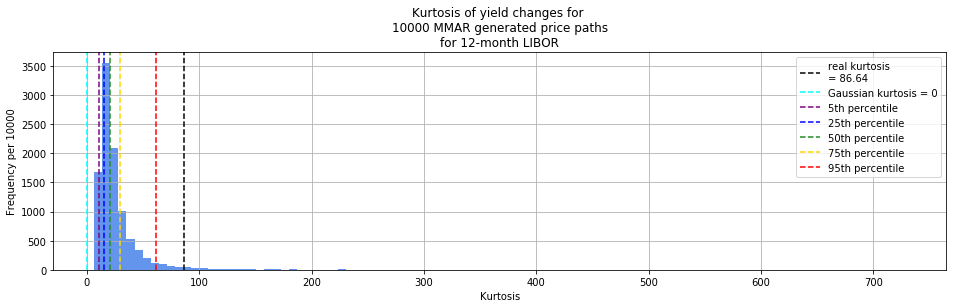

In [ ]:
plt.figure(figsize=(16,4))
plt.grid(b=True)
plt.title("Kurtosis of yield changes for \n" + str(attempt3_length) + " MMAR generated price paths\nfor 12-month LIBOR")
plt.hist(stats.kurtosis(diff_attempt3), bins=100, color='cornflowerblue')
plt.axvline(stats.kurtosis(df.LN_LIBOR[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_LIBOR[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_diff_attempt3 = stats.kurtosis(diff_attempt3)
plt.axvline(np.quantile(kurtosis_array_diff_attempt3, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt3,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt3,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt3,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_diff_attempt3,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(attempt3_length))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

In [ ]:
print("For LIBOR, the kurtosis is kind of all over the place!")

For LIBOR, the kurtosis is kind of all over the place!


In [ ]:
print("Below is the mean kurtosis of the price changes for every simulation.\nKeep in mind that it is overweighted by the heavy right tail.\n")

stats.kurtosis(diff_attempt3).mean()

Below is the mean kurtosis of the price changes for every simulation.
Keep in mind that it is overweighted by the heavy right tail.



26.865422908528835

In [ ]:
print("The median kurtosis is quite far from the real value, which was "+str(stats.kurtosis(df.LN_LIBOR[1:-1]))+".\n")

np.median(stats.kurtosis(diff_attempt3))

The median kurtosis is quite far from the real value, which was 86.64031207657735.



20.25030858020068

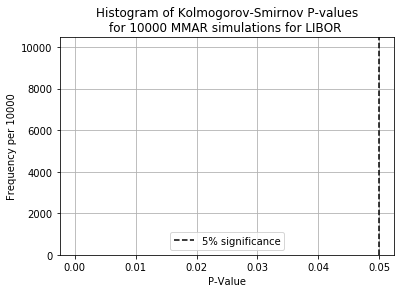

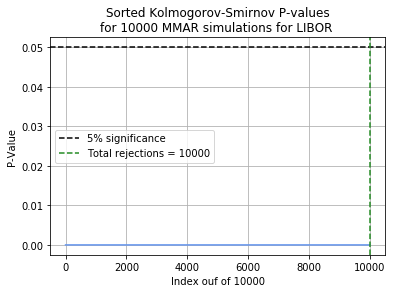

Count of P<0.05 = 10000 failures out of 10000.


In [ ]:
# Here we test how well the simulations fit the original data, using the Kolmogorov-Smirnov test to test the log price changes

ks_test_LIBOR = [0 for x in range(0, attempt3_length)]
for i in range(0,attempt3_length):
    ks_test_LIBOR[i] = stats.ks_2samp(diff_attempt3[i], df.LN_LIBOR).pvalue
    

plt.grid(b=True)
plt.hist(ks_test_LIBOR, bins=20, color='cornflowerblue')
plt.title("Histogram of Kolmogorov-Smirnov P-values\nfor " + str(attempt3_length) + " MMAR simulations for LIBOR ")
plt.axvline(0.05, linestyle='--', color="black", label="5% significance")
plt.xlabel("P-Value")
plt.ylabel("Frequency per " + str(attempt3_length))
plt.legend()
plt.show()

plt.grid(b=True)
plt.plot(sorted(ks_test_LIBOR), color='cornflowerblue')
plt.title("Sorted Kolmogorov-Smirnov P-values\nfor " + str(attempt3_length) + " MMAR simulations for LIBOR ")
plt.axhline(0.05, linestyle='--', color="black", label="5% significance")
plt.axvline(sum(x<0.05 for x in ks_test_LIBOR), linestyle='--', color="forestgreen", label="Total rejections = "+str(sum(x<0.05 for x in ks_test_LIBOR)))
plt.xlabel("Index ouf of " + str(attempt3_length))
plt.ylabel("P-Value")
plt.legend()
plt.show()

print("Count of P<0.05 = "+ str(sum(x<0.05 for x in ks_test_LIBOR)) + " failures out of " + str(attempt3_length) + ".")

In [ ]:
print("We can see that most simulations fail the Kolmogorov-Smirnov test, which is a shame.\n")
print("That said, the test may be overly sensitive.\n")
print("But unfortunately, the authors don't provide any better way to test if an MMAR simulation fits the real data.")

We can see that most simulations fail the Kolmogorov-Smirnov test, which is a shame.

That said, the test may be overly sensitive.

But unfortunately, the authors don't provide any better way to test if an MMAR simulation fits the real data.


# 

currently at i=0
currently at i=500


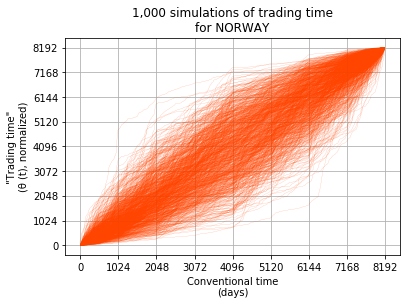

currently at i=0
currently at i=500


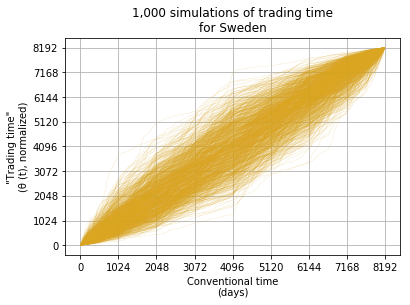

currently at i=0
currently at i=500


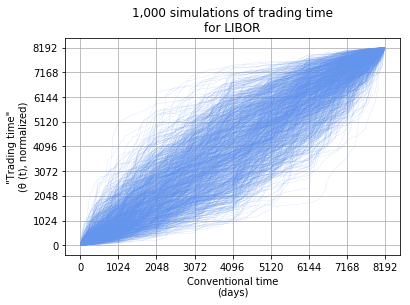

In [ ]:
K=13

for i in range(0,1000):
    if i%500 == 0:
        print("currently at i=" + str(i))
    cherie = np.cumsum(lognormal_cascade(k=K, v=1, ln_lambda=lambda_NORWAY, ln_theta=sigma_NORWAY))
    cherie = 2**(K)*cherie/cherie[-1]
    plt.plot(cherie, linewidth=0.1, color="orangered")
plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
plt.yticks(np.arange(0, 2**(K)+1, 2**(K-3)))
plt.title("1,000 simulations of trading time\nfor Norway")
plt.xlabel("Conventional time\n(days)")
plt.ylabel('"Trading time"\n(\u03B8 (t), normalized)')
plt.grid(b=True)
plt.show()

for i in range(0,1000):
    if i%500 == 0:
        print("currently at i=" + str(i))
    sweetie = np.cumsum(lognormal_cascade(k=K, v=1, ln_lambda=lambda_SWEDEN, ln_theta=sigma_SWEDEN))
    sweetie = 2**(K)*sweetie/sweetie[-1]
    plt.plot(sweetie, linewidth=0.1, color="goldenrod")
plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
plt.yticks(np.arange(0, 2**(K)+1, 2**(K-3)))
plt.title("1,000 simulations of trading time\nfor Sweden")
plt.xlabel("Conventional time\n(days)")
plt.ylabel('"Trading time"\n(\u03B8 (t), normalized)')
plt.grid(b=True)
plt.show()

for i in range(0,1000):
    if i%500 == 0:
        print("currently at i=" + str(i))
    libbie = np.cumsum(lognormal_cascade(k=K, v=1, ln_lambda=lambda_LIBOR, ln_theta=sigma_LIBOR))
    libbie = 2**(K)*libbie/libbie[-1]
    plt.plot(libbie, linewidth=0.1, color="cornflowerblue")
plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
plt.yticks(np.arange(0, 2**(K)+1, 2**(K-3)))
plt.title("1,000 simulations of trading time\nfor LIBOR")
plt.xlabel("Conventional time\n(days)")
plt.ylabel('"Trading time"\n(\u03B8 (t), normalized)')
plt.grid(b=True)
plt.show()

In [ ]:
Gaussian_length = 10000

Gaussian_Norway = pd.DataFrame()

start_time = datetime.now().strftime("%I:%M%p")

for i in range(0,Gaussian_length):
    print("Having started at "+str(start_time))
    print("i="+str(i))
    Gaussian_Norway[i] = [0.0 for x in range(0,2**13)]
    Gaussian_Norway[i][0] = df.Price_NORWAY[0]
    for j in range(1,len(Gaussian_Norway)):
        Gaussian_Norway[i][j] = Gaussian_Norway[i][j-1]*np.exp(np.random.normal(0,df.LN_NORWAY.std()))
    clear_output()
    
print("Having started at "+str(start_time))

Gaussian_Norway.to_csv('Gaussian_Norway.csv')

Having started at 12:50AM


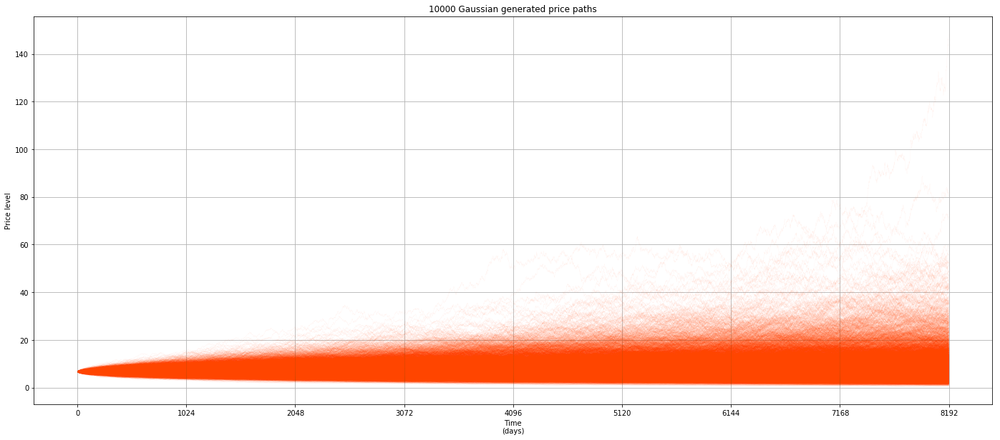

In [ ]:
plt.figure(figsize=(24,10))

for i in range(0,Gaussian_length):
    K=13
    plt.title(str(Gaussian_length) + " Gaussian generated price paths")
    plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
    plt.xlabel("Time\n(days)")
    plt.ylabel('Price level')
    plt.grid(b=True)
    plt.plot(Gaussian_Norway[i], color="orangered", linewidth=0.1, alpha=0.2)
    

plt.show()

In [ ]:
# Here we calculate the LN differences

Gaussian_diff_attempt = [[0 for x in range(0,Gaussian_length)] for y in range (0,8192)]
for i in range(0,Gaussian_length):
    if i%(Gaussian_length/Gaussian_length) == 0:
        print("i="+str(i))
    
    Gaussian_diff_attempt[i]=np.log(Gaussian_Norway[i]).diff()
    
    clear_output()
    
    
Gaussian_diff_attempt= pd.DataFrame(Gaussian_diff_attempt)

Gaussian_diff_attempt.to_csv('Gaussian_diff_Norway.csv')

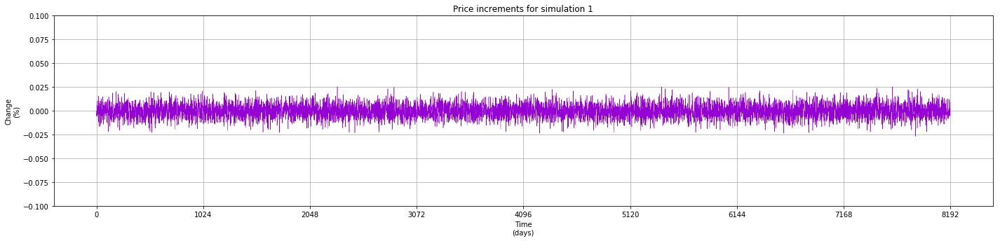

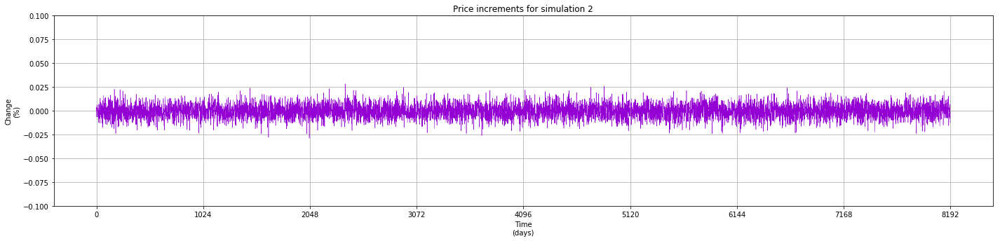

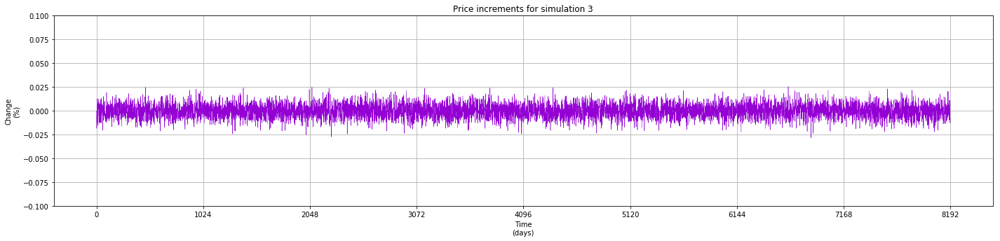

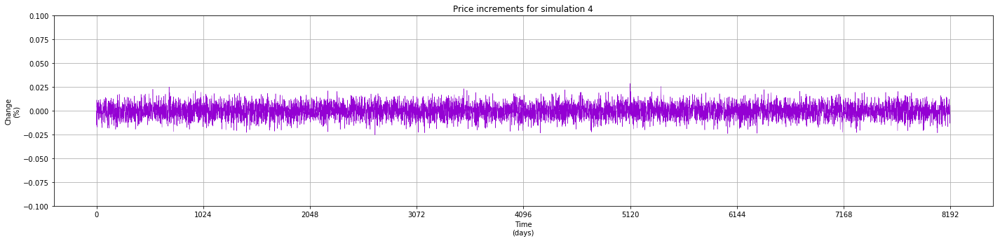

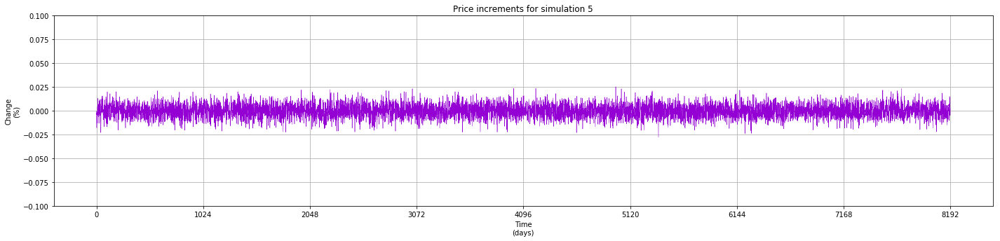

In [ ]:
for i in range(0,5):
    plt.figure(figsize=(24,5))
    plt.title("Price increments for simulation " + str(i+1))
    plt.xticks(np.arange(0, 2**(13)+1, 2**(13-3)))

    plt.xlabel("Time\n(days)")
    plt.grid(b=True)
    plt.ylabel('Change\n(%)')
    
    axes = plt.gca()
    axes.set_ylim([-0.10,0.10])
    
    plt.plot(Gaussian_diff_attempt[i], color="darkviolet", linewidth=0.5)
    plt.show()

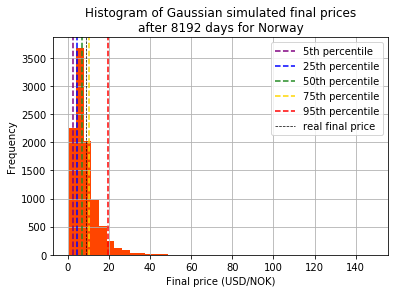

In [ ]:
plt.grid(b=True)
plt.title("Histogram of Gaussian simulated final prices\nafter 8192 days for Norway")
plt.hist(Gaussian_Norway.iloc[-1], bins=40, color="orangered")
plt.xlabel("Final price (USD/NOK)")
plt.ylabel("Frequency")
plt.axvline(Gaussian_Norway.iloc[-1].quantile(0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(Gaussian_Norway.iloc[-1].quantile(0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(Gaussian_Norway.iloc[-1].quantile(0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(Gaussian_Norway.iloc[-1].quantile(0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(Gaussian_Norway.iloc[-1].quantile(0.95), linestyle='--', color="red", label="95th percentile")
plt.axvline(df.Price_NORWAY.iloc[-1], linestyle='--', color="black", label="real final price", linewidth=0.7)
plt.legend()
plt.show()

In [ ]:
print("Here we can see some statistics about the price changes in the Norwegian exchange rate.\n")

df.LN_NORWAY.describe()

Here we can see some statistics about the price changes in the Norwegian exchange rate.



count    7560.000000
mean        0.000033
std         0.007228
min        -0.064440
25%        -0.004051
50%         0.000000
75%         0.003942
max         0.059688
Name: LN_NORWAY, dtype: float64

In [ ]:
df.LN_NORWAY.std()

0.007228071748173812

In [ ]:
attempt = pd.read_csv("~"YOUR USERNAME HERE"/Desktop/Simulation collection/Norway_attempt.csv", index_col=0)
attempt.columns = attempt.columns.astype(int)

diff_attempt = pd.read_csv("~"YOUR USERNAME HERE"/Desktop/Simulation collection/Norway_diff_attempt.csv", index_col=0)
diff_attempt.columns = diff_attempt.columns.astype(int)

Gaussian_Norway = pd.read_csv("~"YOUR USERNAME HERE"/Desktop/Simulation collection/Gaussian_Norway.csv", index_col=0)
Gaussian_Norway.columns = attempt.columns.astype(int)

Gaussian_diff_attempt = pd.read_csv("~"YOUR USERNAME HERE"/Desktop/Simulation collection/Gaussian_diff_Norway.csv", index_col=0)
Gaussian_diff_attempt.columns = diff_attempt.columns.astype(int)

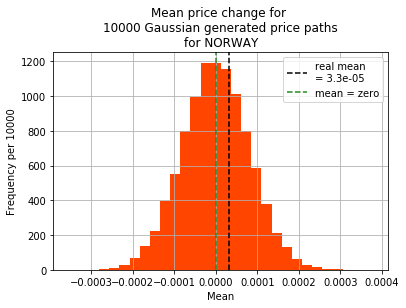

count    1.000000e+04
mean    -1.877157e-07
std      8.041581e-05
min     -3.541401e-04
25%     -5.406017e-05
50%     -6.722251e-07
75%      5.395653e-05
max      3.784583e-04
dtype: float64


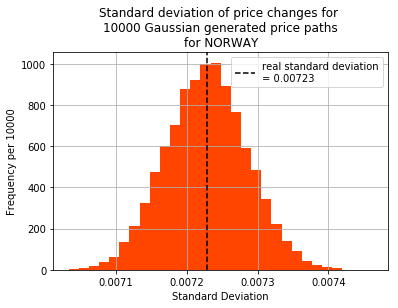



Below is a description of the standard deviations of our 10,000 simulations.



count    10000.000000
mean         0.007228
std          0.000057
min          0.007033
25%          0.007189
50%          0.007228
75%          0.007266
max          0.007463
dtype: float64

In [ ]:
plt.grid(b=True)
plt.title("Mean price change for \n" + str(Gaussian_length) + " Gaussian generated price paths\nfor NORWAY")
plt.hist(Gaussian_diff_attempt.mean(), bins=30, color='orangered')
plt.axvline(df.LN_NORWAY.mean(), linestyle='--', color="black", label="real mean\n= "+str(round(df.LN_NORWAY.mean(), 6)))
plt.axvline(0, linestyle='--', color="forestgreen", label="mean = zero")
plt.ylabel("Frequency per " + str(Gaussian_length))
plt.xlabel("Mean")
plt.legend()
plt.show()
print((Gaussian_diff_attempt.mean()).describe())

plt.grid(b=True)
plt.title("Standard deviation of price changes for \n" + str(Gaussian_length) + " Gaussian generated price paths\nfor NORWAY")
plt.hist(Gaussian_diff_attempt.std(), bins=30, color='orangered')
plt.axvline(df.LN_NORWAY.std(), linestyle='--', color="black", label="real standard deviation\n= "+str(round(df.LN_NORWAY.std(), 5)))
plt.ylabel("Frequency per " + str(Gaussian_length))
plt.xlabel("Standard Deviation")
plt.legend()
plt.show()


print("\n\nBelow is a description of the standard deviations of our 10,000 simulations.\n")
(Gaussian_diff_attempt.std()).describe()

In [ ]:
print("The mean is obviously very variable - we can simulate both downward and upward markets.\n\nWe can see that the standard deviation is also quite variable, but it is mostly near to what we expect.")

The mean is obviously very variable - we can simulate both downward and upward markets.

We can see that the standard deviation is also quite variable, but it is mostly near to what we expect.


In [ ]:
print("Here's the kurtosis for the real data for Norway.")

stats.kurtosis(df.LN_NORWAY[1:-1])

Here's the kurtosis for the real data for Norway.


4.279929706945225

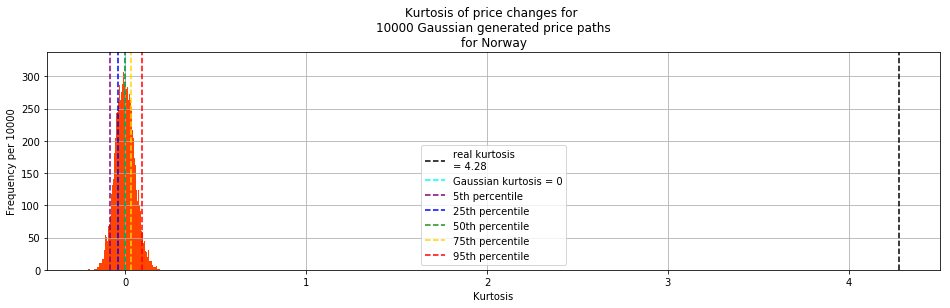

In [ ]:
plt.figure(figsize=(16,4))
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length) + " Gaussian generated price paths\nfor Norway")
plt.hist(stats.kurtosis(Gaussian_diff_attempt), bins=100, color='orangered')
plt.axvline(stats.kurtosis(df.LN_NORWAY[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_NORWAY[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_Gaussian_diff_attempt = stats.kurtosis(Gaussian_diff_attempt)
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(Gaussian_length))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

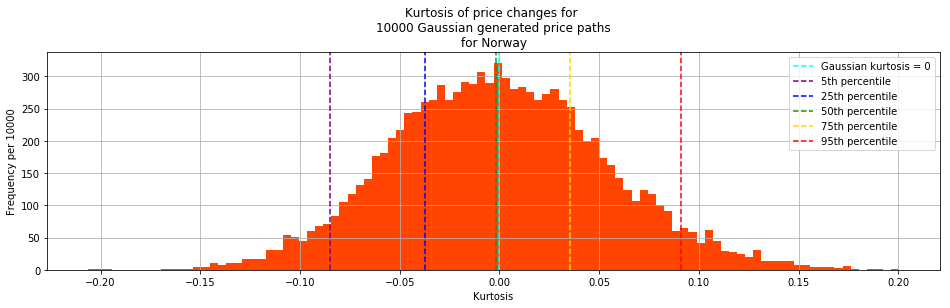

In [ ]:
plt.figure(figsize=(16,4))
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length) + " Gaussian generated price paths\nfor Norway")
plt.hist(stats.kurtosis(Gaussian_diff_attempt), bins=100, color='orangered')
# plt.axvline(stats.kurtosis(df.LN_NORWAY[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_NORWAY[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_Gaussian_diff_attempt = stats.kurtosis(Gaussian_diff_attempt)
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(Gaussian_length))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

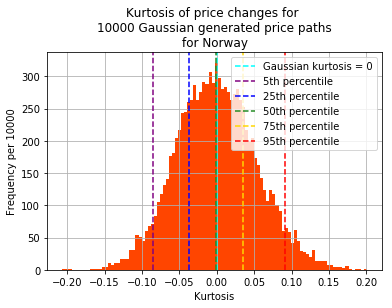

In [ ]:
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length) + " Gaussian generated price paths\nfor Norway")
plt.hist(stats.kurtosis(Gaussian_diff_attempt), bins=100, color='orangered')
# plt.axvline(stats.kurtosis(df.LN_NORWAY[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_NORWAY[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_Gaussian_diff_attempt = stats.kurtosis(Gaussian_diff_attempt)
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(Gaussian_length))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

In [ ]:
print("But at least the kurtosis is about right!")

But at least the kurtosis is about right!


In [ ]:
print("Below is the mean kurtosis of the price changes for every simulation.\nKeep in mind that it is overweighted by the heavy right tail.\n")

stats.kurtosis(diff_attempt).mean()

Below is the mean kurtosis of the price changes for every simulation.
Keep in mind that it is overweighted by the heavy right tail.



5.15394832632845

In [ ]:
print("The median kurtosis is about right. The real kurtosis was "+str(stats.kurtosis(df.LN_NORWAY[1:-1]))+".\n")

np.median(stats.kurtosis(diff_attempt))

The median kurtosis is about right. The real kurtosis was 4.279929706945225.



4.616610555074015

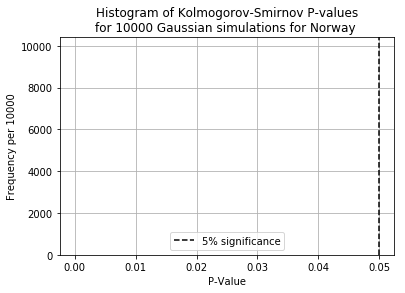

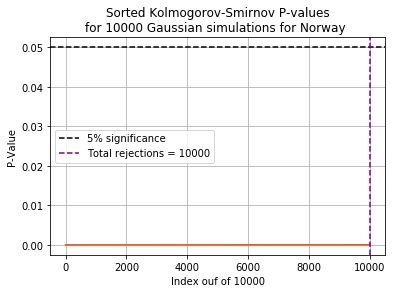

Count of P<0.05 = 10000 failures out of 10000.


In [ ]:
# Here we test how well the simulations fit the original data, using the Kolmogorov-Smirnov test to test the log price changes

ks_test_Gaussian_NORWAY = [0 for x in range(0, Gaussian_length)]
for i in range(0,Gaussian_length):
    ks_test_Gaussian_NORWAY[i] = stats.ks_2samp(Gaussian_diff_attempt[i], df.LN_NORWAY).pvalue
    

plt.grid(b=True)
plt.hist(ks_test_Gaussian_NORWAY, bins=20, color='orangered')
plt.title("Histogram of Kolmogorov-Smirnov P-values\nfor " + str(Gaussian_length) + " Gaussian simulations for Norway ")
plt.axvline(0.05, linestyle='--', color="black", label="5% significance")
plt.xlabel("P-Value")
plt.ylabel("Frequency per " + str(Gaussian_length))
plt.legend()
plt.show()

plt.grid(b=True)
plt.plot(sorted(ks_test_Gaussian_NORWAY), color='orangered')
plt.title("Sorted Kolmogorov-Smirnov P-values\nfor " + str(Gaussian_length) + " Gaussian simulations for Norway ")
plt.axhline(0.05, linestyle='--', color="black", label="5% significance")
plt.axvline(sum(x<0.05 for x in ks_test_Gaussian_NORWAY), linestyle='--', color="purple", label="Total rejections = "+str(sum(x<0.05 for x in ks_test_Gaussian_NORWAY)))
plt.xlabel("Index ouf of " + str(Gaussian_length))
plt.ylabel("P-Value")
plt.legend()
plt.show()

print("Count of P<0.05 = "+ str(sum(x<0.05 for x in ks_test_Gaussian_NORWAY)) + " failures out of " + str(Gaussian_length) + ".")

In [ ]:
print("We can see that all Gaussian simulations fail the Kolmogorov-Smirnov test.\n")


We can see that all Gaussian simulations fail the Kolmogorov-Smirnov test.



In [ ]:
print("Like last time, we want to add some restrictions to our simulations, to avoid 'absurd' results.")
print("\nWe use the same restrictions as last time, namely:\n")
print("For Sweden: 100 < P(t) < 5000 for all t.")
print("For LIBOR: 0.1 < P(t) < 20 for all t.")

Like last time, we want to add some restrictions to our simulations, to avoid 'absurd' results.

We use the same restrictions as last time, namely:

For Sweden: 100 < P(t) < 5000 for all t.
For LIBOR: 0.1 < P(t) < 20 for all t.


In [ ]:
def gaussian_attempt(top_limit, bottom_limit, mean_return, std_return, original_price, number_of_simulated_days):
        
    TEMPORARY_array = [0.0 for x in range(number_of_simulated_days)]
    
    for j in range(0,number_of_simulated_days):
        if j == 0:
            TEMPORARY_array[j] = original_price
        else:
            Z = np.random.normal(mean_return, std_return)
            TEMPORARY_array[j] = TEMPORARY_array[j-1]*np.exp(Z)
    
    if (all(Pt < top_limit for Pt in TEMPORARY_array) and all(Pt > bottom_limit for Pt in TEMPORARY_array))==True:
        return TEMPORARY_array
        
    else:
        return gaussian_attempt(top_limit, bottom_limit, mean_return, std_return, original_price, number_of_simulated_days)

In [ ]:
print("We can now beging generating simple, 'random walk'-style market simulations.")

We can now beging generating simple, 'random walk'-style market simulations.


In [ ]:
Gaussian_length2 = 10000

Gaussian_Sweden = pd.DataFrame()

Sweden_top_limit = 5000
Sweden_bottom_limit = 100

number_of_simulated_days = 2**13+1

start_time = datetime.now().strftime("%I:%M%p")


for i in range(0,Gaussian_length2):
    print("Having started at "+str(start_time))
    print("i="+str(i))
        
    Gaussian_Sweden[i] = gaussian_attempt(Sweden_top_limit, Sweden_bottom_limit, df.LN_SWEDEN.mean(), df.LN_SWEDEN.std(), df.Price_SWEDEN[0], number_of_simulated_days)
    clear_output()
    
print("Having started at "+str(start_time))


Gaussian_Sweden.to_csv('Gaussian_Sweden.csv')

Having started at 11:05AM


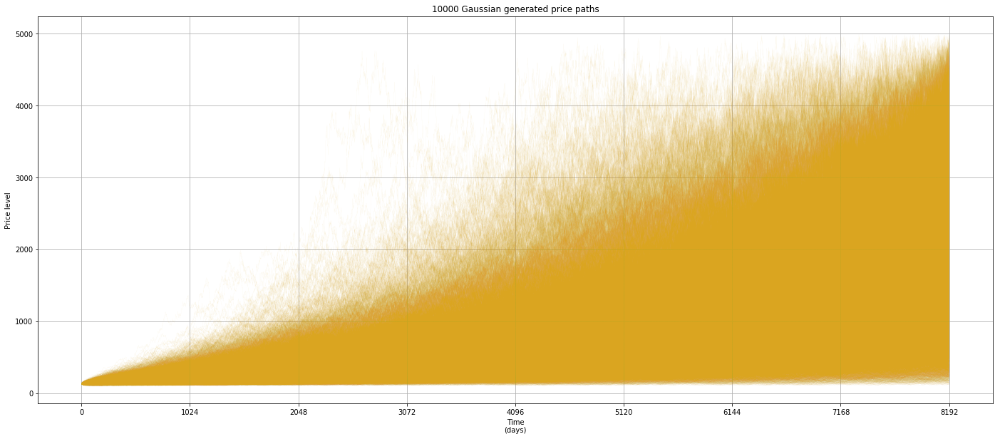

In [ ]:
plt.figure(figsize=(24,10))

for i in range(0,Gaussian_length2):
    K=13
    plt.title(str(Gaussian_length2) + " Gaussian generated price paths")
    plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
    plt.xlabel("Time\n(days)")
    plt.ylabel('Price level')
    plt.grid(b=True)
    plt.plot(Gaussian_Sweden[i], color="goldenrod", linewidth=0.1, alpha=0.2)
    

plt.show()

In [ ]:
# Here we calculate the LN differences

Gaussian_diff_attempt2 = [np.log(Gaussian_Sweden[x]).diff() for x in range(0,Gaussian_length2)]
Gaussian_diff_attempt2 = pd.DataFrame(Gaussian_diff_attempt2).transpose()
Gaussian_diff_attempt2 = Gaussian_diff_attempt2[:-1]


Gaussian_diff_attempt2

Gaussian_diff_attempt2.to_csv('Gaussian_diff_Sweden.csv')

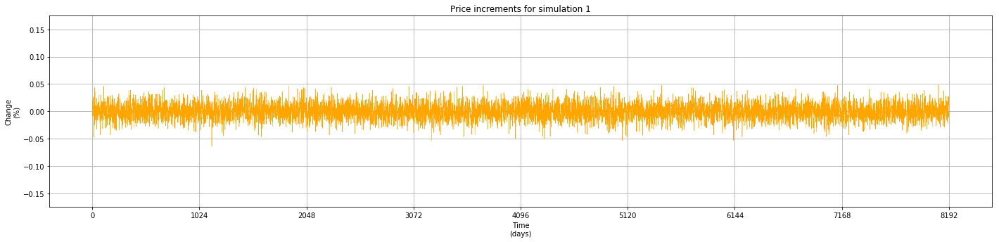

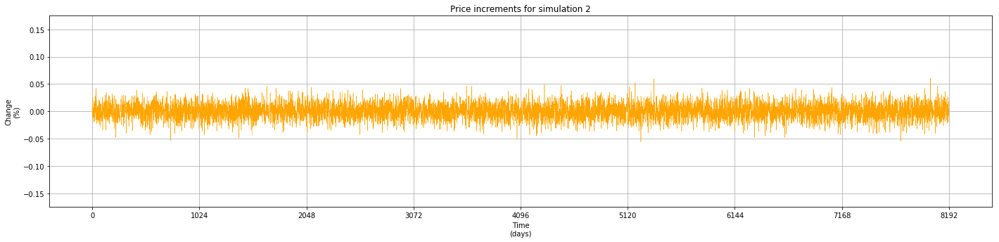

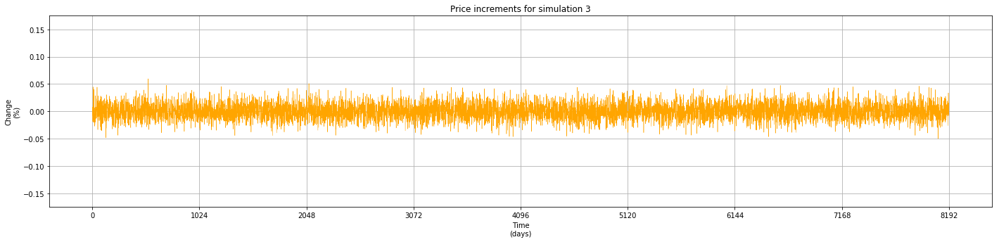

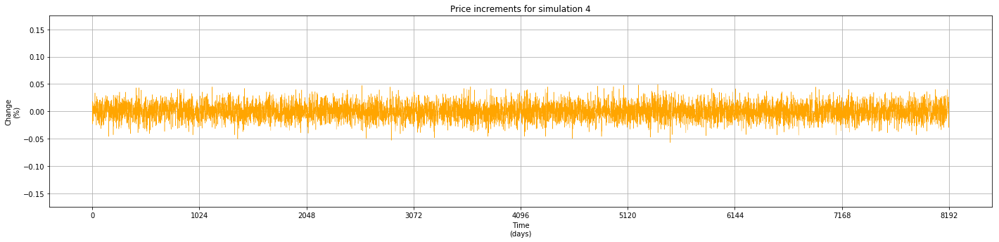

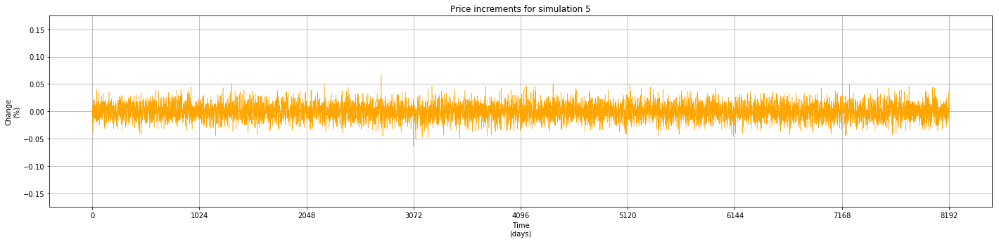

In [ ]:
for i in range(0,5):
    plt.figure(figsize=(24,5))
    plt.title("Price increments for simulation " + str(i+1))
    plt.xticks(np.arange(0, 2**(13)+1, 2**(13-3)))

    plt.xlabel("Time\n(days)")
    plt.grid(b=True)
    plt.ylabel('Change\n(%)')
    
    axes = plt.gca()
    axes.set_ylim([-0.175,0.175])
    
    plt.plot(Gaussian_diff_attempt2[i], color="orange", linewidth=0.5)
    plt.show()

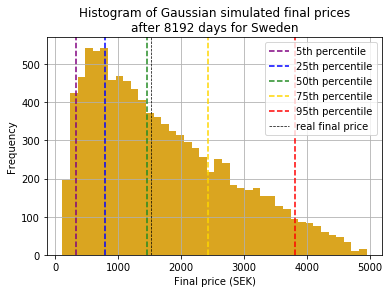

In [ ]:
plt.grid(b=True)
plt.title("Histogram of Gaussian simulated final prices\nafter 8192 days for Sweden")
plt.hist(Gaussian_Sweden.iloc[-1], bins=40, color="goldenrod")
plt.xlabel("Final price (SEK)")
plt.ylabel("Frequency")
plt.axvline(Gaussian_Sweden.iloc[-1].quantile(0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(Gaussian_Sweden.iloc[-1].quantile(0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(Gaussian_Sweden.iloc[-1].quantile(0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(Gaussian_Sweden.iloc[-1].quantile(0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(Gaussian_Sweden.iloc[-1].quantile(0.95), linestyle='--', color="red", label="95th percentile")
plt.axvline(df.Price_SWEDEN.iloc[-1], linestyle='--', color="black", label="real final price", linewidth=0.7)
plt.legend()
plt.show()

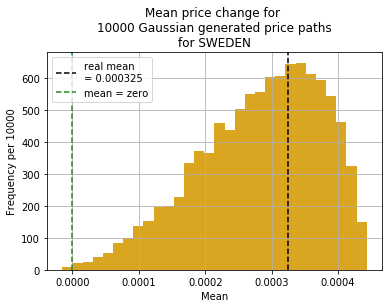

count    10000.000000
mean         0.000283
std          0.000092
min         -0.000015
25%          0.000220
50%          0.000295
75%          0.000356
max          0.000443
dtype: float64


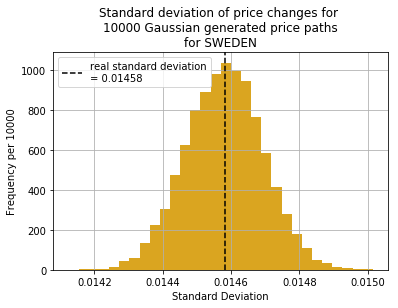



Below is a description of the standard deviations of our 10,000 simulations.



count    10000.000000
mean         0.014582
std          0.000113
min          0.014124
25%          0.014504
50%          0.014583
75%          0.014658
max          0.015016
dtype: float64

In [ ]:
plt.grid(b=True)
plt.title("Mean price change for \n" + str(Gaussian_length2) + " Gaussian generated price paths\nfor SWEDEN")
plt.hist(Gaussian_diff_attempt2.mean(), bins=30, color='goldenrod')
plt.axvline(df.LN_SWEDEN.mean(), linestyle='--', color="black", label="real mean\n= "+str(round(df.LN_SWEDEN.mean(), 6)))
plt.axvline(0, linestyle='--', color="forestgreen", label="mean = zero")
plt.ylabel("Frequency per " + str(Gaussian_length2))
plt.xlabel("Mean")
plt.legend()
plt.show()
print((Gaussian_diff_attempt2.mean()).describe())

plt.grid(b=True)
plt.title("Standard deviation of price changes for \n" + str(Gaussian_length2) + " Gaussian generated price paths\nfor SWEDEN")
plt.hist(Gaussian_diff_attempt2.std(), bins=30, color='goldenrod')
plt.axvline(df.LN_SWEDEN.std(), linestyle='--', color="black", label="real standard deviation\n= "+str(round(df.LN_SWEDEN.std(), 5)))
plt.ylabel("Frequency per " + str(Gaussian_length2))
plt.xlabel("Standard Deviation")
plt.legend()
plt.show()


print("\n\nBelow is a description of the standard deviations of our 10,000 simulations.\n")
(Gaussian_diff_attempt2.std()).describe()

In [ ]:
print("The mean is obviously very variable - we can simulate both downward and upward markets.\n\nWe can see that the standard deviation is also quite variable, but it is mostly near to what we expect.")

The mean is obviously very variable - we can simulate both downward and upward markets.

We can see that the standard deviation is also quite variable, but it is mostly near to what we expect.


In [ ]:
print("Here's the kurtosis for the real data for Norway.")

stats.kurtosis(df.LN_NORWAY[1:-1])

Here's the kurtosis for the real data for Norway.


4.279929706945225

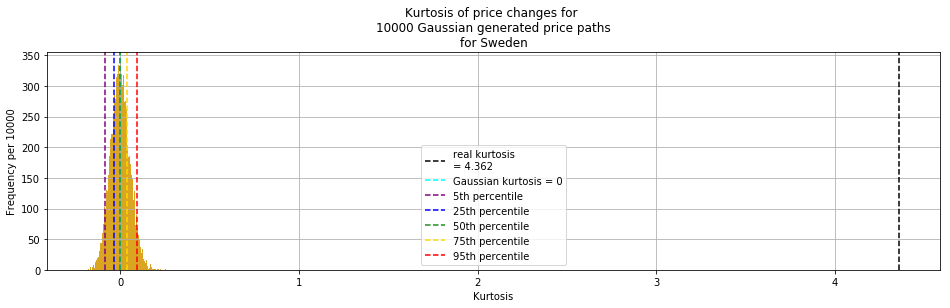

In [ ]:
plt.figure(figsize=(16,4))
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length2) + " Gaussian generated price paths\nfor Sweden")
plt.hist(stats.kurtosis(Gaussian_diff_attempt2), bins=100, color='goldenrod')
plt.axvline(stats.kurtosis(df.LN_SWEDEN[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_SWEDEN[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_Gaussian_diff_attempt2 = stats.kurtosis(Gaussian_diff_attempt2)
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(Gaussian_length2))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

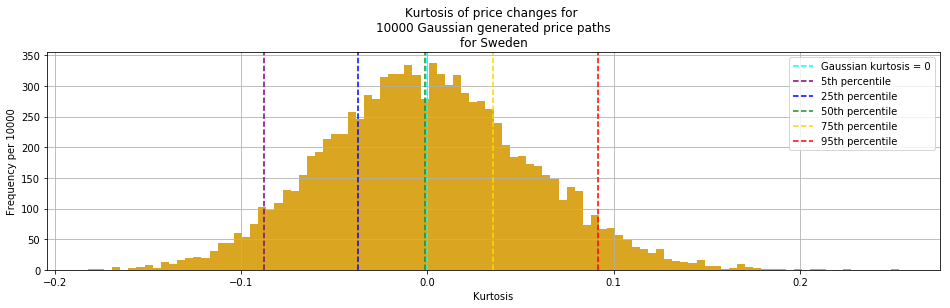

In [ ]:
plt.figure(figsize=(16,4))
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length2) + " Gaussian generated price paths\nfor Sweden")
plt.hist(stats.kurtosis(Gaussian_diff_attempt2), bins=100, color='goldenrod')
# plt.axvline(stats.kurtosis(df.LN_SWEDEN[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_SWEDEN[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_Gaussian_diff_attempt2 = stats.kurtosis(Gaussian_diff_attempt2)
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(Gaussian_length2))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

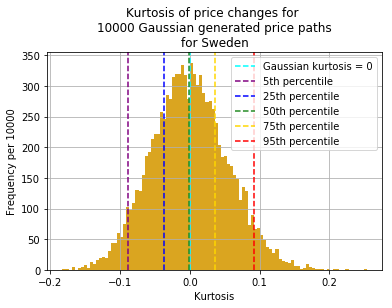

In [ ]:
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length2) + " Gaussian generated price paths\nfor Sweden")
plt.hist(stats.kurtosis(Gaussian_diff_attempt2), bins=100, color='goldenrod')
# plt.axvline(stats.kurtosis(df.LN_SWEDEN[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_SWEDEN[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_Gaussian_diff_attempt2 = stats.kurtosis(Gaussian_diff_attempt2)
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(Gaussian_length2))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

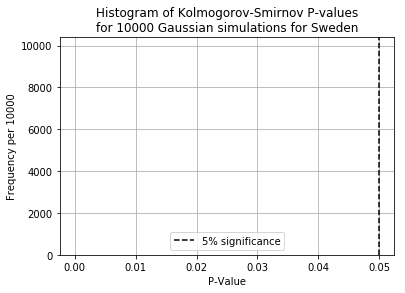

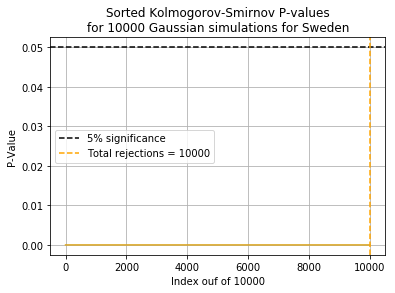

Count of P<0.05 = 10000 failures out of 10000.


In [ ]:
# Here we test how well the simulations fit the original data, using the Kolmogorov-Smirnov test to test the log price changes

ks_test_Gaussian_SWEDEN = [0 for x in range(0, Gaussian_length2)]
for i in range(0,Gaussian_length2):
    ks_test_Gaussian_SWEDEN[i] = stats.ks_2samp(Gaussian_diff_attempt2[i], df.LN_SWEDEN).pvalue
    

plt.grid(b=True)
plt.hist(ks_test_Gaussian_SWEDEN, bins=20, color='goldenrod')
plt.title("Histogram of Kolmogorov-Smirnov P-values\nfor " + str(Gaussian_length2) + " Gaussian simulations for Sweden")
plt.axvline(0.05, linestyle='--', color="black", label="5% significance")
plt.xlabel("P-Value")
plt.ylabel("Frequency per " + str(Gaussian_length2))
plt.legend()
plt.show()

plt.grid(b=True)
plt.plot(sorted(ks_test_Gaussian_SWEDEN), color='goldenrod')
plt.title("Sorted Kolmogorov-Smirnov P-values\nfor " + str(Gaussian_length2) + " Gaussian simulations for Sweden")
plt.axhline(0.05, linestyle='--', color="black", label="5% significance")
plt.axvline(sum(x<0.05 for x in ks_test_Gaussian_SWEDEN), linestyle='--', color="orange", label="Total rejections = "+str(sum(x<0.05 for x in ks_test_Gaussian_SWEDEN)))
plt.xlabel("Index ouf of " + str(Gaussian_length2))
plt.ylabel("P-Value")
plt.legend()
plt.show()

print("Count of P<0.05 = "+ str(sum(x<0.05 for x in ks_test_Gaussian_SWEDEN)) + " failures out of " + str(Gaussian_length2) + ".")

In [ ]:
Gaussian_length3 = 10000

Gaussian_LIBOR = pd.DataFrame()

LIBOR_top_limit = 20
LIBOR_bottom_limit = 0.1

number_of_simulated_days = 2**13+1

start_time = datetime.now().strftime("%I:%M%p")


for i in range(0,Gaussian_length3):
    print("Having started at "+str(start_time))
    print("i="+str(i))
        
    Gaussian_LIBOR[i] = gaussian_attempt(LIBOR_top_limit, LIBOR_bottom_limit, df.LN_LIBOR.mean(), df.LN_LIBOR.std(), df.Price_LIBOR[0], number_of_simulated_days)
    clear_output()
    
print("Having started at "+str(start_time))


Gaussian_LIBOR.to_csv('Gaussian_LIBOR.csv')

Having started at 11:27AM


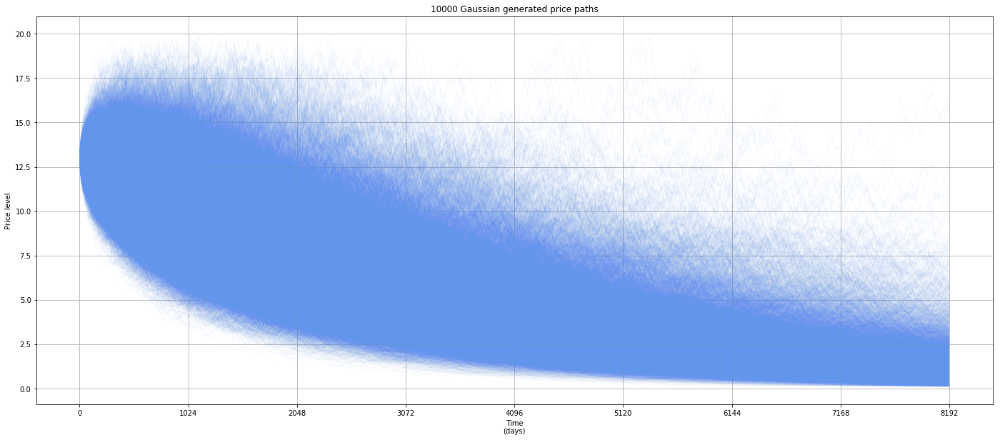

In [ ]:
plt.figure(figsize=(24,10))

for i in range(0,Gaussian_length3):
    K=13
    plt.title(str(Gaussian_length3) + " Gaussian generated price paths")
    plt.xticks(np.arange(0, 2**(K)+1, 2**(K-3)))
    plt.xlabel("Time\n(days)")
    plt.ylabel('Price level')
    plt.grid(b=True)
    plt.plot(Gaussian_LIBOR[i], color="cornflowerblue", linewidth=0.1, alpha=0.2)
    

plt.show()

In [ ]:
# Here we calculate the LN differences

Gaussian_diff_attempt3 = [np.log(Gaussian_LIBOR[x]).diff() for x in range(0,Gaussian_length3)]
Gaussian_diff_attempt3 = pd.DataFrame(Gaussian_diff_attempt3).transpose()
Gaussian_diff_attempt3 = Gaussian_diff_attempt3[:-1]

Gaussian_diff_attempt3

Gaussian_diff_attempt3.to_csv('Gaussian_diff_LIBOR.csv')

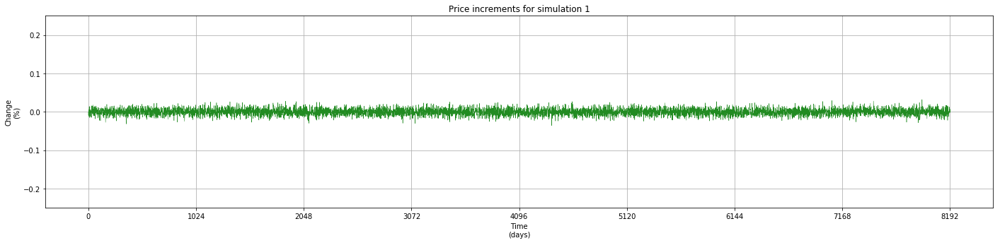

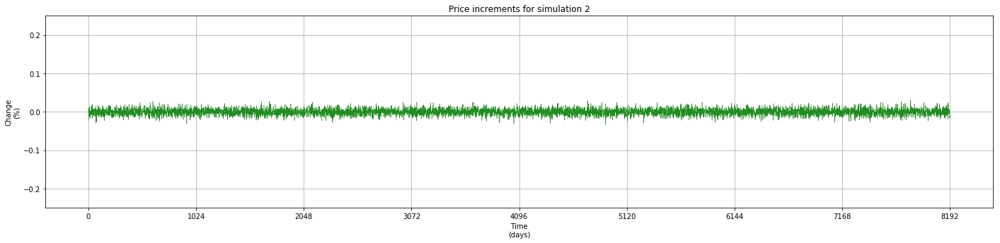

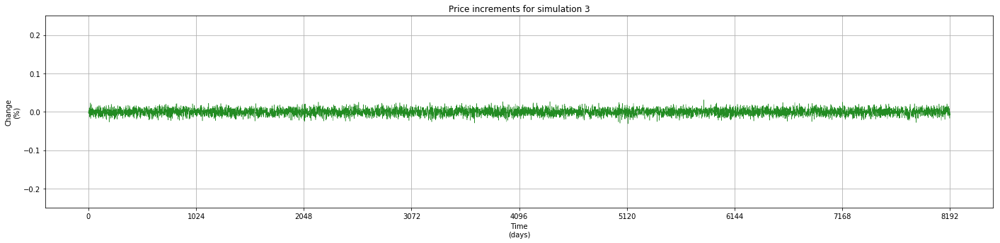

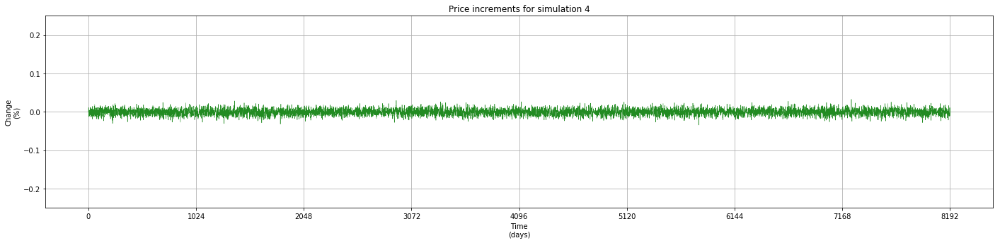

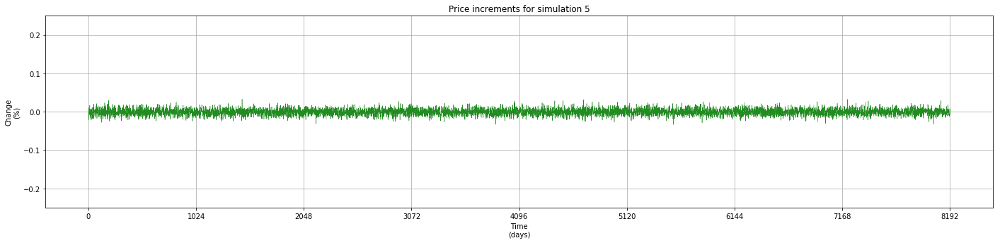

In [ ]:
for i in range(0,5):
    plt.figure(figsize=(24,5))
    plt.title("Price increments for simulation " + str(i+1))
    plt.xticks(np.arange(0, 2**(13)+1, 2**(13-3)))

    plt.xlabel("Time\n(days)")
    plt.grid(b=True)
    plt.ylabel('Change\n(%)')
    
    axes = plt.gca()
    axes.set_ylim([-0.25,0.25])
    
    plt.plot(Gaussian_diff_attempt3[i], color="forestgreen", linewidth=0.5)
    plt.show()

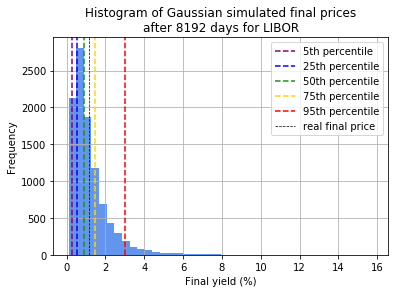

In [ ]:
plt.grid(b=True)
plt.title("Histogram of Gaussian simulated final prices\nafter 8192 days for LIBOR")
plt.hist(Gaussian_LIBOR.iloc[-1], bins=40, color="cornflowerblue")
plt.xlabel("Final yield (%)")
plt.ylabel("Frequency")
plt.axvline(Gaussian_LIBOR.iloc[-1].quantile(0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(Gaussian_LIBOR.iloc[-1].quantile(0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(Gaussian_LIBOR.iloc[-1].quantile(0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(Gaussian_LIBOR.iloc[-1].quantile(0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(Gaussian_LIBOR.iloc[-1].quantile(0.95), linestyle='--', color="red", label="95th percentile")
plt.axvline(df.Price_LIBOR.iloc[-1], linestyle='--', color="black", label="real final price", linewidth=0.7)
plt.legend()
plt.show()

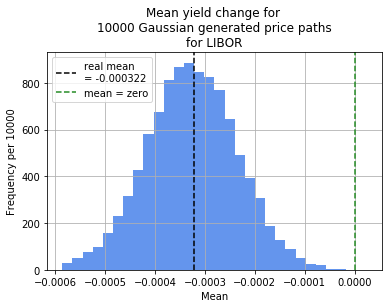

count    10000.000000
mean        -0.000326
std          0.000090
min         -0.000585
25%         -0.000387
50%         -0.000326
75%         -0.000265
max          0.000024
dtype: float64


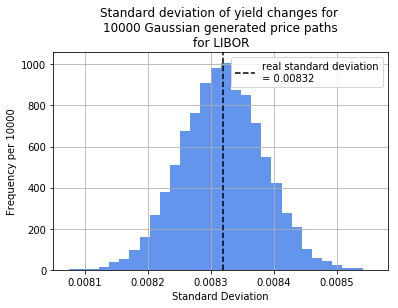



Below is a description of the standard deviations of our 10,000 simulations.



count    10000.000000
mean         0.008318
std          0.000065
min          0.008074
25%          0.008274
50%          0.008318
75%          0.008362
max          0.008557
dtype: float64

In [ ]:
plt.grid(b=True)
plt.title("Mean yield change for \n" + str(Gaussian_length3) + " Gaussian generated price paths\nfor LIBOR")
plt.hist(Gaussian_diff_attempt3.mean(), bins=30, color='cornflowerblue')
plt.axvline(df.LN_LIBOR.mean(), linestyle='--', color="black", label="real mean\n= "+str(round(df.LN_LIBOR.mean(), 6)))
plt.axvline(0, linestyle='--', color="forestgreen", label="mean = zero")
plt.ylabel("Frequency per " + str(Gaussian_length3))
plt.xlabel("Mean")
plt.legend()
plt.show()
print((Gaussian_diff_attempt3.mean()).describe())

plt.grid(b=True)
plt.title("Standard deviation of yield changes for \n" + str(Gaussian_length3) + " Gaussian generated price paths\nfor LIBOR")
plt.hist(Gaussian_diff_attempt3.std(), bins=30, color='cornflowerblue')
plt.axvline(df.LN_LIBOR.std(), linestyle='--', color="black", label="real standard deviation\n= "+str(round(df.LN_LIBOR.std(), 5)))
plt.ylabel("Frequency per " + str(Gaussian_length3))
plt.xlabel("Standard Deviation")
plt.legend()
plt.show()


print("\n\nBelow is a description of the standard deviations of our 10,000 simulations.\n")
(Gaussian_diff_attempt3.std()).describe()

In [ ]:
print("The mean is obviously very variable - we can simulate both downward and upward markets.\n\nWe can see that the standard deviation is also quite variable, but it is mostly near to what we expect.")

The mean is obviously very variable - we can simulate both downward and upward markets.

We can see that the standard deviation is also quite variable, but it is mostly near to what we expect.


In [ ]:
print("Here's the kurtosis for the real data for Norway.")

stats.kurtosis(df.LN_NORWAY[1:-1])

Here's the kurtosis for the real data for Norway.


4.279929706945225

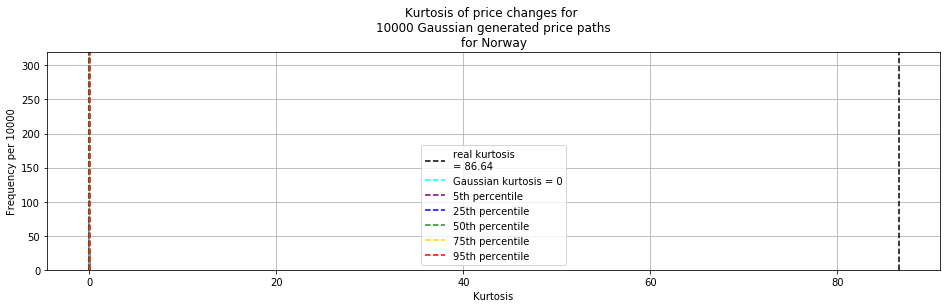

In [ ]:
plt.figure(figsize=(16,4))
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length3) + " Gaussian generated price paths\nfor Norway")
plt.hist(stats.kurtosis(Gaussian_diff_attempt3), bins=100, color='cornflowerblue')
plt.axvline(stats.kurtosis(df.LN_LIBOR[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_LIBOR[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_Gaussian_diff_attempt3 = stats.kurtosis(Gaussian_diff_attempt3)
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(Gaussian_length3))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

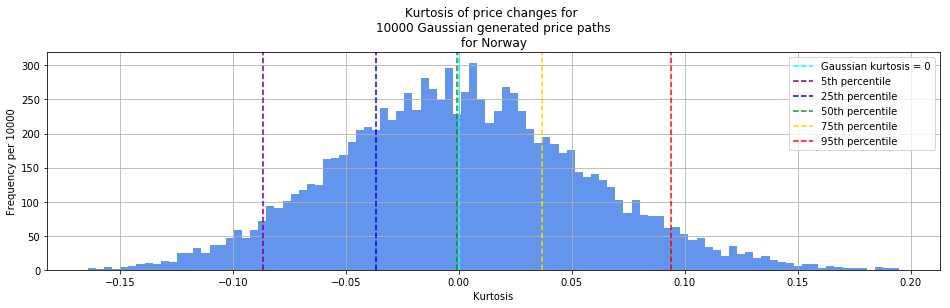

In [ ]:
plt.figure(figsize=(16,4))
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length3) + " Gaussian generated price paths\nfor Norway")
plt.hist(stats.kurtosis(Gaussian_diff_attempt3), bins=100, color='cornflowerblue')
# plt.axvline(stats.kurtosis(df.LN_LIBOR[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_LIBOR[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_Gaussian_diff_attempt3 = stats.kurtosis(Gaussian_diff_attempt3)
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(Gaussian_length3))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

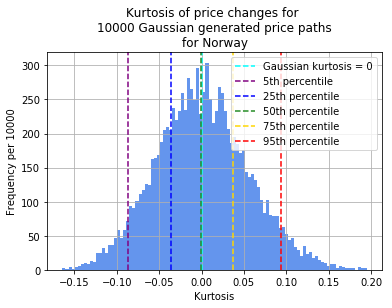

In [ ]:
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length3) + " Gaussian generated price paths\nfor Norway")
plt.hist(stats.kurtosis(Gaussian_diff_attempt3), bins=100, color='cornflowerblue')
# plt.axvline(stats.kurtosis(df.LN_LIBOR[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_LIBOR[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

kurtosis_array_Gaussian_diff_attempt3 = stats.kurtosis(Gaussian_diff_attempt3)
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3, 0.05), linestyle='--', color="purple", label="5th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.25), linestyle='--', color="blue", label="25th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.5), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.75), linestyle='--', color="gold", label="75th percentile")
plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.95), linestyle='--', color="red", label="95th percentile")

plt.ylabel("Frequency per " + str(Gaussian_length3))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

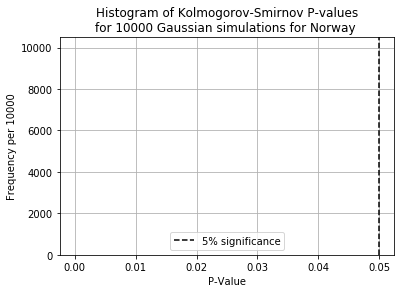

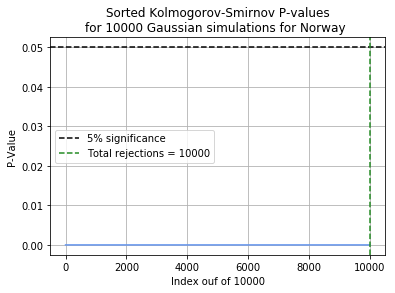

Count of P<0.05 = 10000 failures out of 10000.


In [ ]:
# Here we test how well the simulations fit the original data, using the Kolmogorov-Smirnov test to test the log price changes

ks_test_Gaussian_LIBOR = [0 for x in range(0, Gaussian_length3)]
for i in range(0,Gaussian_length3):
    ks_test_Gaussian_LIBOR[i] = stats.ks_2samp(Gaussian_diff_attempt3[i], df.LN_LIBOR).pvalue
    

plt.grid(b=True)
plt.hist(ks_test_Gaussian_LIBOR, bins=20, color='cornflowerblue')
plt.title("Histogram of Kolmogorov-Smirnov P-values\nfor " + str(Gaussian_length3) + " Gaussian simulations for Norway ")
plt.axvline(0.05, linestyle='--', color="black", label="5% significance")
plt.xlabel("P-Value")
plt.ylabel("Frequency per " + str(Gaussian_length3))
plt.legend()
plt.show()

plt.grid(b=True)
plt.plot(sorted(ks_test_Gaussian_LIBOR), color='cornflowerblue')
plt.title("Sorted Kolmogorov-Smirnov P-values\nfor " + str(Gaussian_length3) + " Gaussian simulations for Norway ")
plt.axhline(0.05, linestyle='--', color="black", label="5% significance")
plt.axvline(sum(x<0.05 for x in ks_test_Gaussian_LIBOR), linestyle='--', color="forestgreen", label="Total rejections = "+str(sum(x<0.05 for x in ks_test_Gaussian_LIBOR)))
plt.xlabel("Index ouf of " + str(Gaussian_length3))
plt.ylabel("P-Value")
plt.legend()
plt.show()

print("Count of P<0.05 = "+ str(sum(x<0.05 for x in ks_test_Gaussian_LIBOR)) + " failures out of " + str(Gaussian_length3) + ".")

In [ ]:
print("Let's get all the kurtosis figures onto one graph")

Let's get all the kurtosis figures onto one graph


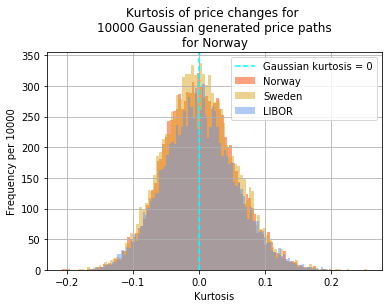

In [ ]:
# NORWAY GRAPHS
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length) + " Gaussian generated price paths\nfor Norway")
plt.hist(stats.kurtosis(Gaussian_diff_attempt), bins=100, color='orangered', alpha = 0.5, label = "Norway")
# plt.axvline(stats.kurtosis(df.LN_NORWAY[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_NORWAY[1:-1]), 3)))
plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

# kurtosis_array_Gaussian_diff_attempt = stats.kurtosis(Gaussian_diff_attempt)
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt, 0.05), linestyle='--', color="purple", label="5th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.25), linestyle='--', color="blue", label="25th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.5), linestyle='--', color="forestgreen", label="50th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.75), linestyle='--', color="gold", label="75th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt,0.95), linestyle='--', color="red", label="95th percentile")


# SWEDEN GRAPHS
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length2) + " Gaussian generated price paths\nfor Sweden")
plt.hist(stats.kurtosis(Gaussian_diff_attempt2), bins=100, color='goldenrod', alpha = 0.5, label = "Sweden")
# plt.axvline(stats.kurtosis(df.LN_SWEDEN[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_SWEDEN[1:-1]), 3)))
# plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

# kurtosis_array_Gaussian_diff_attempt2 = stats.kurtosis(Gaussian_diff_attempt2)
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2, 0.05), linestyle='--', color="purple", label="5th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.25), linestyle='--', color="blue", label="25th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.5), linestyle='--', color="forestgreen", label="50th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.75), linestyle='--', color="gold", label="75th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt2,0.95), linestyle='--', color="red", label="95th percentile")


# LIBOR GRAPHS
plt.grid(b=True)
plt.title("Kurtosis of price changes for \n" + str(Gaussian_length3) + " Gaussian generated price paths\nfor Norway")
plt.hist(stats.kurtosis(Gaussian_diff_attempt3), bins=100, color='cornflowerblue', alpha = 0.5, label = "LIBOR")
# plt.axvline(stats.kurtosis(df.LN_LIBOR[1:-1]), linestyle='--', color="black", label="real kurtosis\n= "+str(round(stats.kurtosis(df.LN_LIBOR[1:-1]), 3)))
# plt.axvline(0, linestyle='--', color="aqua", label="Gaussian kurtosis = 0")

# kurtosis_array_Gaussian_diff_attempt3 = stats.kurtosis(Gaussian_diff_attempt3)
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3, 0.05), linestyle='--', color="purple", label="5th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.25), linestyle='--', color="blue", label="25th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.5), linestyle='--', color="forestgreen", label="50th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.75), linestyle='--', color="gold", label="75th percentile")
# plt.axvline(np.quantile(kurtosis_array_Gaussian_diff_attempt3,0.95), linestyle='--', color="red", label="95th percentile")


# PLT.SHOW
plt.ylabel("Frequency per " + str(Gaussian_length3))
plt.xlabel("Kurtosis")
plt.legend()
plt.show()

In [ ]:
print("Our graphs before were a bit messy.\n\nLet's make them messier by adding a direct comparison to the Gaussian on the same graph.")

Our graphs before were a bit messy.

Let's make them messier by adding a direct comparison to the Gaussian on the same graph.


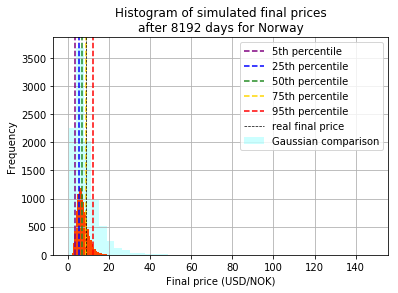

In [ ]:
plt.grid(b=True)
plt.title("Histogram of simulated final prices\nafter 8192 days for Norway")
plt.hist(Gaussian_Norway.iloc[-1], bins=40, color="aqua", alpha = 0.2, label = "Gaussian comparison")
plt.hist(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191]), bins=40, color="orangered")
plt.xlabel("Final price (USD/NOK)")
plt.ylabel("Frequency")
plt.axvline(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191].quantile(0.05)), linestyle='--', color="purple", label="5th percentile")
plt.axvline(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191].quantile(0.25)), linestyle='--', color="blue", label="25th percentile")
plt.axvline(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191].quantile(0.5)), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191].quantile(0.75)), linestyle='--', color="gold", label="75th percentile")
plt.axvline(df.Price_NORWAY[0]*np.exp(attempt.iloc[8191].quantile(0.95)), linestyle='--', color="red", label="95th percentile")
plt.axvline(df.Price_NORWAY.iloc[-1], linestyle='--', color="black", label="real final price", linewidth=0.7)
plt.legend()
plt.show()

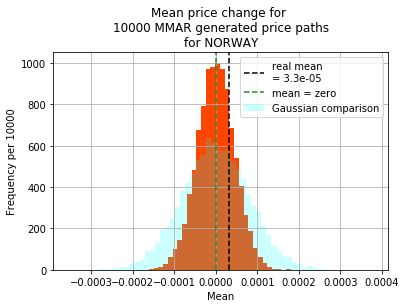

count    1.000000e+04
mean     4.783070e-07
std      4.479205e-05
min     -1.606284e-04
25%     -2.944317e-05
50%      5.766159e-07
75%      3.035007e-05
max      1.811756e-04
dtype: float64


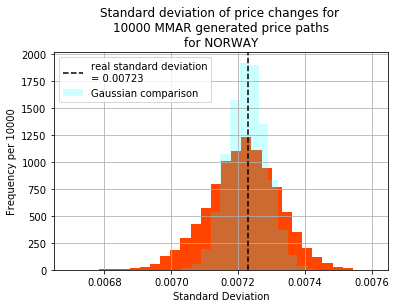



Below is a description of the standard deviations of our 10,000 simulations.



count    10000.000000
mean         0.007215
std          0.000106
min          0.006693
25%          0.007148
50%          0.007218
75%          0.007286
max          0.007604
dtype: float64

In [ ]:
plt.grid(b=True)
plt.title("Mean price change for \n" + str(attempt_length) + " MMAR generated price paths\nfor NORWAY")
plt.hist(diff_attempt.mean(), bins=30, color='orangered')
plt.hist(Gaussian_diff_attempt.mean(), bins=60, color='aqua', alpha = 0.2, label = "Gaussian comparison")
plt.axvline(df.LN_NORWAY.mean(), linestyle='--', color="black", label="real mean\n= "+str(round(df.LN_NORWAY.mean(), 6)))
plt.axvline(0, linestyle='--', color="forestgreen", label="mean = zero")
plt.ylabel("Frequency per " + str(attempt_length))
plt.xlabel("Mean")
plt.legend()
plt.show()
print((diff_attempt.mean()).describe())

plt.grid(b=True)
plt.title("Standard deviation of price changes for \n" + str(attempt_length) + " MMAR generated price paths\nfor NORWAY")
plt.hist(diff_attempt.std(), bins=30, color='orangered')
plt.axvline(df.LN_NORWAY.std(), linestyle='--', color="black", label="real standard deviation\n= "+str(round(df.LN_NORWAY.std(), 5)))
plt.ylabel("Frequency per " + str(attempt_length))
plt.xlabel("Standard Deviation")
plt.hist(Gaussian_diff_attempt.std(), bins=15, color='aqua', alpha = 0.2, label = "Gaussian comparison")
plt.legend()
plt.show()


print("\n\nBelow is a description of the standard deviations of our 10,000 simulations.\n")
(diff_attempt.std()).describe()

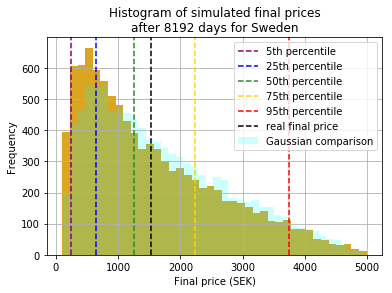

In [ ]:
plt.grid(b=True)
plt.title("Histogram of simulated final prices\nafter 8192 days for Sweden")
plt.hist(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191]), bins=40, color="goldenrod")
plt.hist(Gaussian_Sweden.iloc[-1], bins=40, color="aqua", alpha = 0.2, label = "Gaussian comparison")
plt.xlabel("Final price (SEK)")
plt.ylabel("Frequency")
plt.axvline(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191].quantile(0.05)), linestyle='--', color="purple", label="5th percentile")
plt.axvline(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191].quantile(0.25)), linestyle='--', color="blue", label="25th percentile")
plt.axvline(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191].quantile(0.5)), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191].quantile(0.75)), linestyle='--', color="gold", label="75th percentile")
plt.axvline(df.Price_SWEDEN[0]*np.exp(attempt2.iloc[8191].quantile(0.95)), linestyle='--', color="red", label="95th percentile")
plt.axvline(df.Price_SWEDEN.iloc[-1], linestyle='--', color="black", label="real final price")

plt.legend()
plt.show()

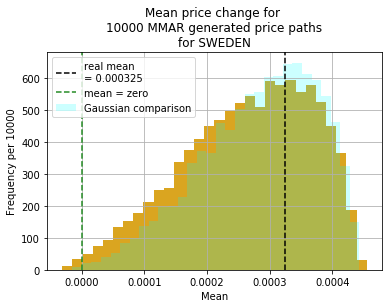

count    10000.000000
mean         0.000264
std          0.000102
min         -0.000031
25%          0.000193
50%          0.000275
75%          0.000347
max          0.000455
dtype: float64


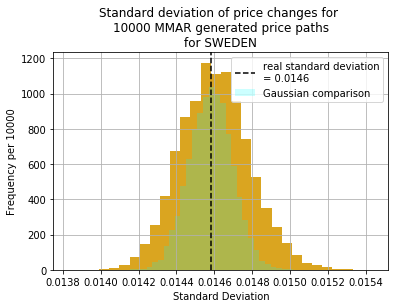



Below is a description of the standard deviations of our 10000 simulations.



count    10000.000000
mean         0.014604
std          0.000185
min          0.013831
25%          0.014475
50%          0.014601
75%          0.014723
max          0.015437
dtype: float64

In [ ]:
plt.grid(b=True)
plt.title("Mean price change for \n" + str(attempt2_length) + " MMAR generated price paths\nfor SWEDEN")
plt.hist(diff_attempt2.mean(), bins=30, color='goldenrod')
plt.hist(Gaussian_diff_attempt2.mean(), bins=30, color='aqua', alpha = 0.2, label = "Gaussian comparison")
plt.axvline(df.LN_SWEDEN.mean(), linestyle='--', color="black", label="real mean\n= "+str(round(df.LN_SWEDEN.mean(), 6)))
plt.axvline(0, linestyle='--', color="forestgreen", label="mean = zero")
plt.ylabel("Frequency per " + str(attempt2_length))
plt.xlabel("Mean")
plt.legend()
plt.show()
print((diff_attempt2.mean()).describe())

plt.grid(b=True)
plt.title("Standard deviation of price changes for \n" + str(attempt2_length) + " MMAR generated price paths\nfor SWEDEN")
plt.hist(diff_attempt2.std(), bins=30, color='goldenrod')
plt.hist(Gaussian_diff_attempt2.std(), bins=30, color='aqua', alpha = 0.2, label = "Gaussian comparison")
plt.axvline(df.LN_SWEDEN.std(), linestyle='--', color="black", label="real standard deviation\n= "+str(round(df.LN_SWEDEN.std(), 4)))
plt.ylabel("Frequency per " + str(attempt2_length))
plt.xlabel("Standard Deviation")
plt.legend()
plt.show()


print("\n\nBelow is a description of the standard deviations of our " + str(attempt2_length) + " simulations.\n")
(diff_attempt2.std()).describe()

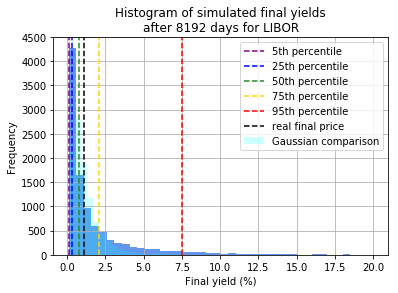

In [ ]:
plt.grid(b=True)
plt.title("Histogram of simulated final yields\nafter 8192 days for LIBOR")
plt.hist(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191]), bins=40, color="cornflowerblue")
plt.hist(Gaussian_LIBOR.iloc[-1], bins=40, color="aqua", alpha = 0.2, label = "Gaussian comparison")
plt.xlabel("Final yield (%)")
plt.ylabel("Frequency")
plt.axvline(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191].quantile(0.05)), linestyle='--', color="purple", label="5th percentile")
plt.axvline(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191].quantile(0.25)), linestyle='--', color="blue", label="25th percentile")
plt.axvline(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191].quantile(0.5)), linestyle='--', color="forestgreen", label="50th percentile")
plt.axvline(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191].quantile(0.75)), linestyle='--', color="gold", label="75th percentile")
plt.axvline(df.Price_LIBOR[0]*np.exp(attempt3.iloc[8191].quantile(0.95)), linestyle='--', color="red", label="95th percentile")
plt.axvline(df.Price_LIBOR.iloc[-1], linestyle='--', color="black", label="real final price")
plt.legend()
plt.show()

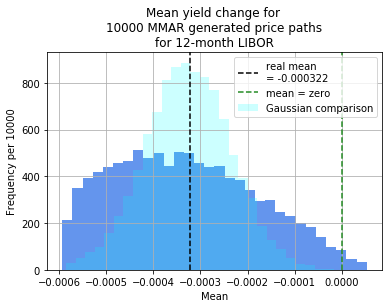

count    10000.000000
mean        -0.000332
std          0.000150
min         -0.000593
25%         -0.000453
50%         -0.000342
75%         -0.000222
max          0.000053
dtype: float64


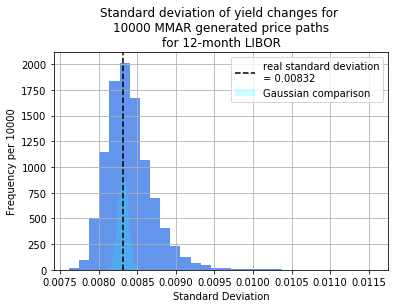



Below is a description of the standard deviations of our 10000 simulations.

count    10000.000000
mean         0.008401
std          0.000306
min          0.007613
25%          0.008198
50%          0.008361
75%          0.008557
max          0.011558
dtype: float64


In [ ]:
plt.grid(b=True)
plt.title("Mean yield change for \n" + str(attempt3_length) + " MMAR generated price paths\nfor 12-month LIBOR")
plt.hist(diff_attempt3.mean(), bins=30, color='cornflowerblue')
plt.hist(Gaussian_diff_attempt3.mean(), bins=30, color='aqua', alpha = 0.2, label = "Gaussian comparison")
plt.axvline(df.LN_LIBOR.mean(), linestyle='--', color="black", label="real mean\n= "+str(round(df.LN_LIBOR.mean(), 6)))
plt.axvline(0, linestyle='--', color="forestgreen", label="mean = zero")
plt.ylabel("Frequency per " + str(attempt3_length))
plt.xlabel("Mean")
plt.legend()
plt.show()
print((diff_attempt3.mean()).describe())

plt.grid(b=True)
plt.title("Standard deviation of yield changes for \n" + str(attempt3_length) + " MMAR generated price paths\nfor 12-month LIBOR")
plt.hist(diff_attempt3.std(), bins=30, color='cornflowerblue')
plt.hist(Gaussian_diff_attempt3.std(), bins=30, color='aqua', alpha = 0.2, label = "Gaussian comparison")
plt.axvline(df.LN_LIBOR.std(), linestyle='--', color="black", label="real standard deviation\n= "+str(round(df.LN_LIBOR.std(), 5)))
plt.ylabel("Frequency per " + str(attempt3_length))
plt.xlabel("Standard Deviation")
plt.legend()
plt.show()


print("\n\nBelow is a description of the standard deviations of our " + str(attempt3_length) + " simulations.\n")
print((diff_attempt3.std()).describe())